# R script to analyse population structure in the GLUE dataset 

## Setup

### Libraries required

In [186]:
# Load required packages
library(tidyverse)
library(wesanderson)
library(vegan)
library(umap)
library("IRdisplay")


In [187]:
# Path to results for this project
results_prefix <- '/scratch/projects/trifolium/glue/demography/glue_demography/results/'

In [188]:
# Function to calculate % variance and cummulative variance from PC
# Used to generate summary table rather than printing the lengthy `princomp()` summary
pca_importance <- function(x) {
  vars <- x$sdev^2
  vars <- vars/sum(vars)
  rbind(`Standard deviation` = x$sdev, `Proportion of Variance` = vars, 
      `Cumulative Proportion` = cumsum(vars))
}

### Order of samples in cov files

In [189]:
# File of samples order in the global analysis
samples<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/resources/glue_pc_sampleSheet.txt", header=TRUE, sep="\t")
global <- read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/program_resources/bam_lists/withoutRelated/finalSamples_4fold_bams.list")
global$V1<-gsub("/scratch/projects/trifolium/glue/pc/results/bam/4fold/","",as.character(global$V1))
global$V1<-gsub("_4fold.bam","",as.character(global$V1))
global_order_detail<-merge(samples, global,  by.x="sample", by.y="V1", all.x=FALSE, all.y=TRUE, sort=FALSE) 
sample_name<-global_order_detail$sample



In [190]:
# File of samples order per city
list<-c("Albuquerque", "Antwerp", "Armidale","Athens","Bogota","Buenos_Aires",
        "Calgary","Canberra","Cape_Town","Christchurch","Hiroshima","Kunming"
        ,"Kyoto","Landshut","Linkoping","Loja","Medellin","Melbourne","Memphis",
        "Mexico_City","Munich","Paris","Quito","Tehran","Thessaloniki","Toronto")
samples<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/resources/glue_pc_sampleSheet.txt", header=TRUE, sep="\t")

for (city in list){
    samples<-read.csv("/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/resources/glue_pc_sampleSheet.txt", header=TRUE, sep="\t")
    detail <- read.table(paste0("/scratch/projects/trifolium/glue/demography/glue_demography/results/program_resources/bam_lists/by_city/withoutRelated/",city,"/",city,"_4fold_lowCovRemoved_bams.list"))
    head(detail)
    detail$V1<-gsub("/scratch/projects/trifolium/glue/pc/results/bam/4fold/","",as.character(detail$V1))
    detail$V1<-gsub("_4fold.bam","",as.character(detail$V1))
    name <-paste0(city,'_order_detail')
    tmp <-merge(samples, detail,  by.x="sample", by.y="V1", all.x=FALSE, all.y=TRUE, sort=FALSE) 
    assign(name,tmp)
    }
                      
head(detail)
head(samples)
head(Paris_order_detail)
    

,V1
,<chr>
1,s_1_9
2,s_2_3
3,s_3_5
4,s_4_18
5,s_5_16
6,s_97_3


,continent,city,pop,individual,site,sample,range,library,lane
,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<int>
1,NAM,Albuquerque,29,5,r,Albuquerque_29_5,Introduced,glue_low1,1
2,NAM,Albuquerque,29,9,r,Albuquerque_29_9,Introduced,glue_low1,1
3,NAM,Albuquerque,32,13,r,Albuquerque_32_13,Introduced,glue_low1,1
4,NAM,Albuquerque,32,3,r,Albuquerque_32_3,Introduced,glue_low1,1
5,NAM,Albuquerque,33,2,r,Albuquerque_33_2,Introduced,glue_low1,1
6,NAM,Albuquerque,33,7,r,Albuquerque_33_7,Introduced,glue_low1,1


,sample,continent,city,pop,individual,site,range,library,lane
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>
1,Paris_11_9,EU,Paris,11,9,r,Native,glue_low1,1
2,Paris_11_6,EU,Paris,11,6,r,Native,glue_low1,1
3,Paris_13_3,EU,Paris,13,3,r,Native,glue_low1,1
4,Paris_13_13,EU,Paris,13,13,r,Native,glue_low1,1
5,Paris_15_13,EU,Paris,15,13,r,Native,glue_low1,1
6,Paris_6_1,EU,Paris,6,1,r,Native,glue_low1,1


# Global PCA and UMAPP

PCA and UMAPP analyses performed on the complete dataset minus low quality samples and related individuals (pairwise relatedness r>=0.5 (first degree relatedness : full-sib or parent offspring). A total of 168,209 4 fold SNPs were used for these analyses.

## PCA

In [191]:
# Load covariance matrix
#covMat_path <- paste0(results_prefix, 'population_structure//pcangsd/allSamples/pcangsd_withoutRelated/allSamples_4fold_maf0.05_pcangsd.cov')
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/allSamples/pcangsd_withoutRelated/allSamples_4fold_maf0.05_pcangsd.cov", sep=" "))

head(covMat)

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V2024,V2025,V2026,V2027,V2028,V2029,V2030,V2031,V2032,V2033
1.032773376,0.014491122,0.01163575,0.011849497,0.005423924,0.006283455,0.014096634,0.0221992750,0.0023045063,0.0005773159,⋯,0.025764767,0.018131522,0.025473028,0.016208576,0.014589527,0.020190874,0.01884717,0.008759730,0.008618019,0.0087613640
0.014491122,1.020675778,0.01402223,0.011438978,0.003726983,0.013405775,0.014760304,0.0147751803,0.0008899939,0.0068883472,⋯,0.024575861,0.026249684,0.021871163,0.022453532,0.025383946,0.015219481,0.02723094,0.027536644,0.014481634,0.0116232438
0.011635747,0.014022231,0.97952235,0.022556953,0.016855754,0.025019743,0.024598658,0.0052414434,-0.0099670440,0.0201104619,⋯,0.013261040,0.014263150,0.005173988,0.020636454,0.012673942,0.017520038,0.01180705,0.022260383,0.012502084,0.0044114934
0.011849497,0.011438978,0.02255695,1.015930653,0.006277044,0.019218497,0.025083337,0.0008607772,-0.0090626404,0.0166499875,⋯,0.016632507,0.020940563,0.014006387,0.017055692,0.005746820,0.018594487,0.01295086,0.018123431,0.013858931,0.0058694324
0.005423924,0.003726983,0.01685575,0.006277044,0.972708285,0.002287834,0.006101602,-0.0060411762,0.0042326772,0.0075571365,⋯,-0.007054264,-0.005060114,-0.006852617,0.001228349,0.004984106,-0.004340338,-0.01227518,-0.005931595,0.003516752,0.0015914063
0.006283455,0.013405775,0.02501974,0.019218497,0.002287834,1.036757231,0.025612380,0.0072805206,-0.0154357320,0.0167642292,⋯,0.022765873,0.034294840,0.014432874,0.035072345,0.019190615,0.026020363,0.02335713,0.033812903,0.014996404,0.0001356211


In [192]:
# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., global_order_detail)



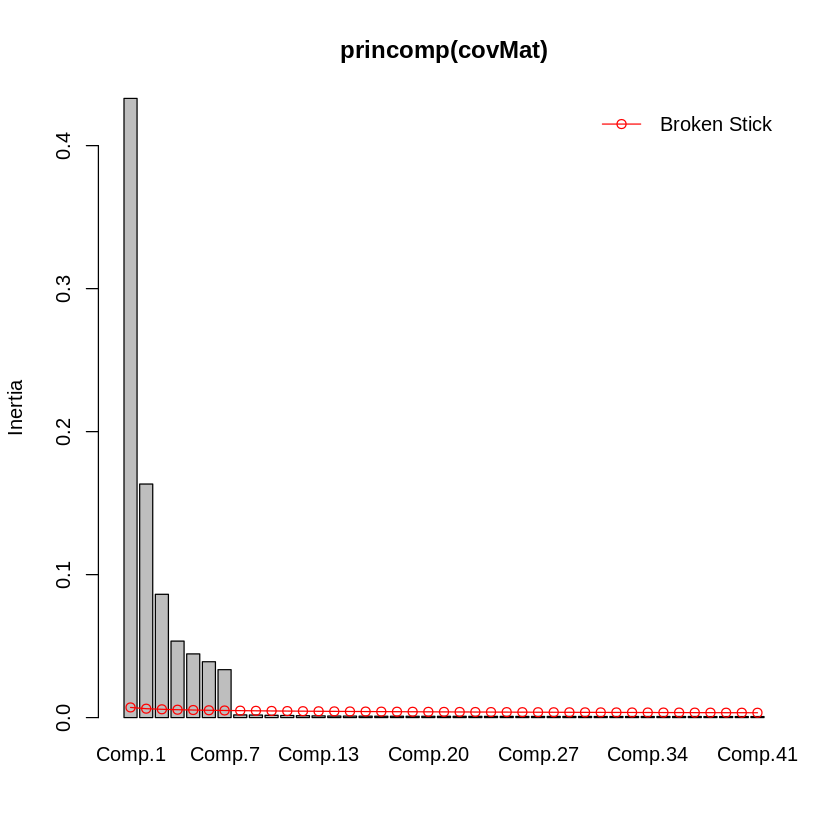

In [193]:
screeplot(princomp(covMat), bstick = TRUE, npcs=41)


In [194]:
# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.6580541,0.40417747,0.29366241,0.23127170,0.21105883,0.19766052,0.18309297,0.04355303
Proportion of Variance,0.2455621,0.09263655,0.04890293,0.03033075,0.02526069,0.02215532,0.01900997,0.00107566
Cumulative Proportion,0.2455621,0.33819870,0.38710163,0.41743238,0.44269307,0.46484839,0.48385836,0.48493402


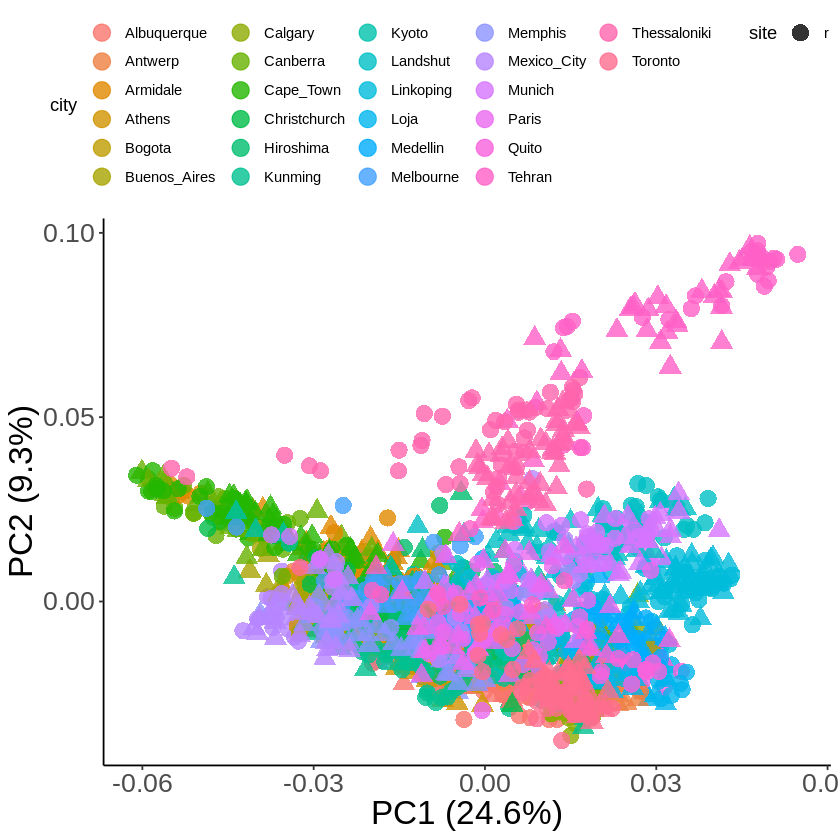

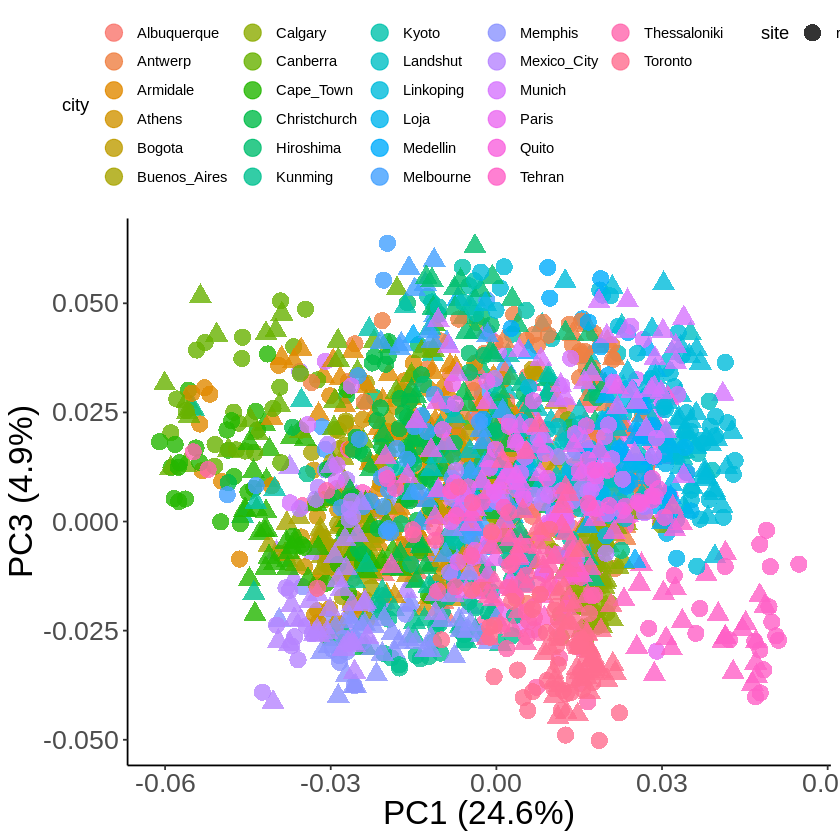

Saving 6.67 x 6.67 in image



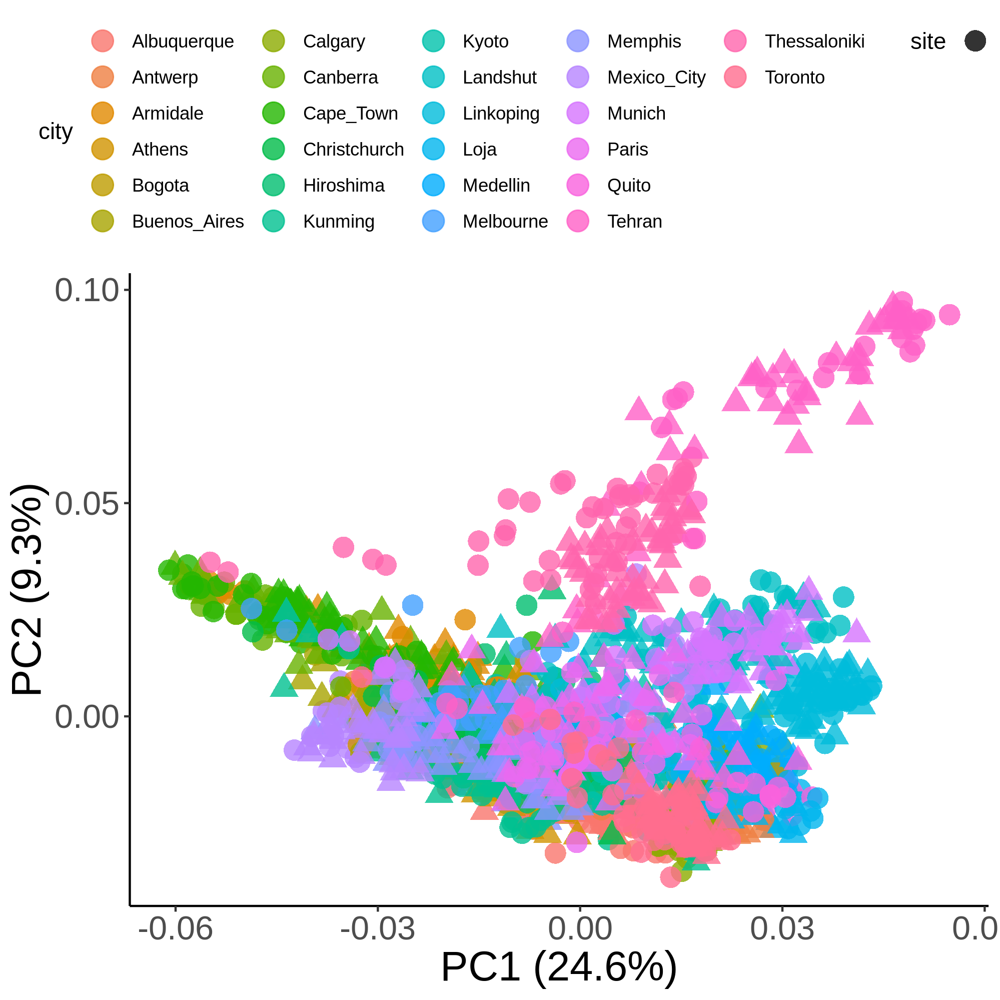

Saving 6.67 x 6.67 in image



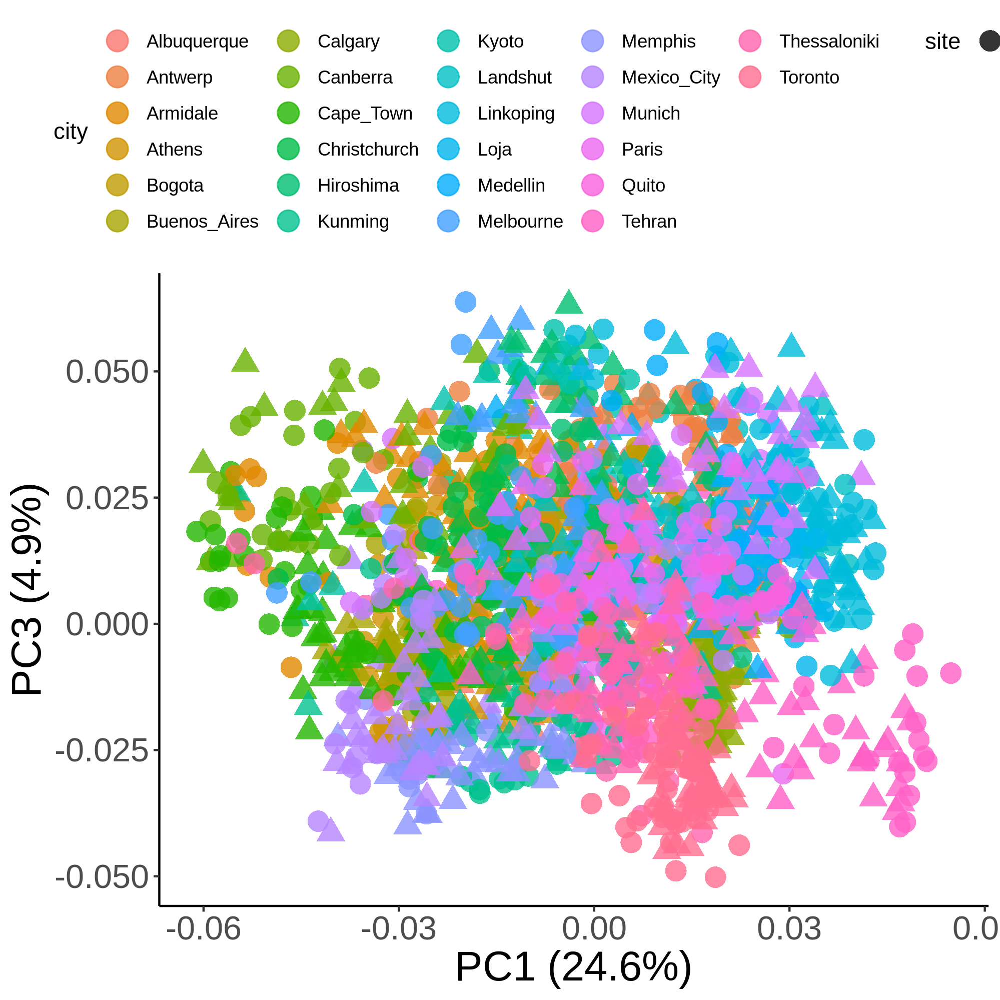

Saving 6.67 x 6.67 in image



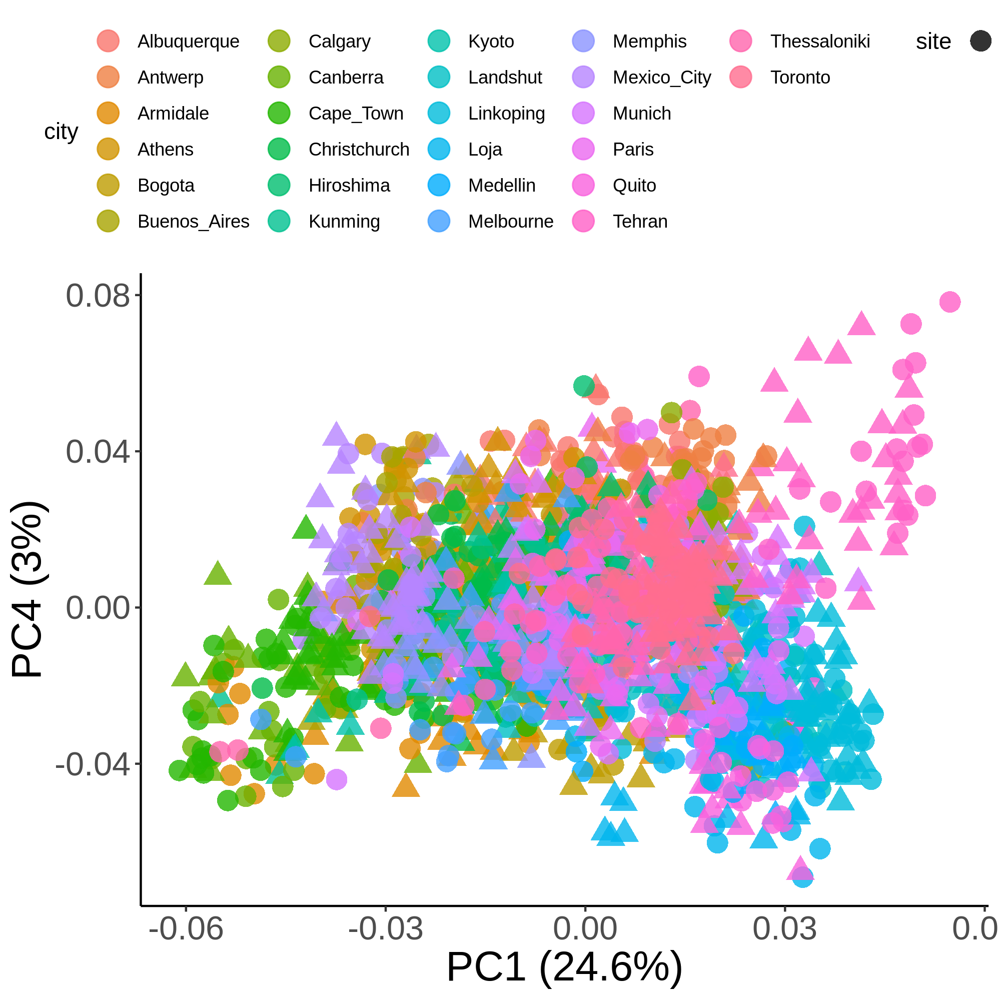

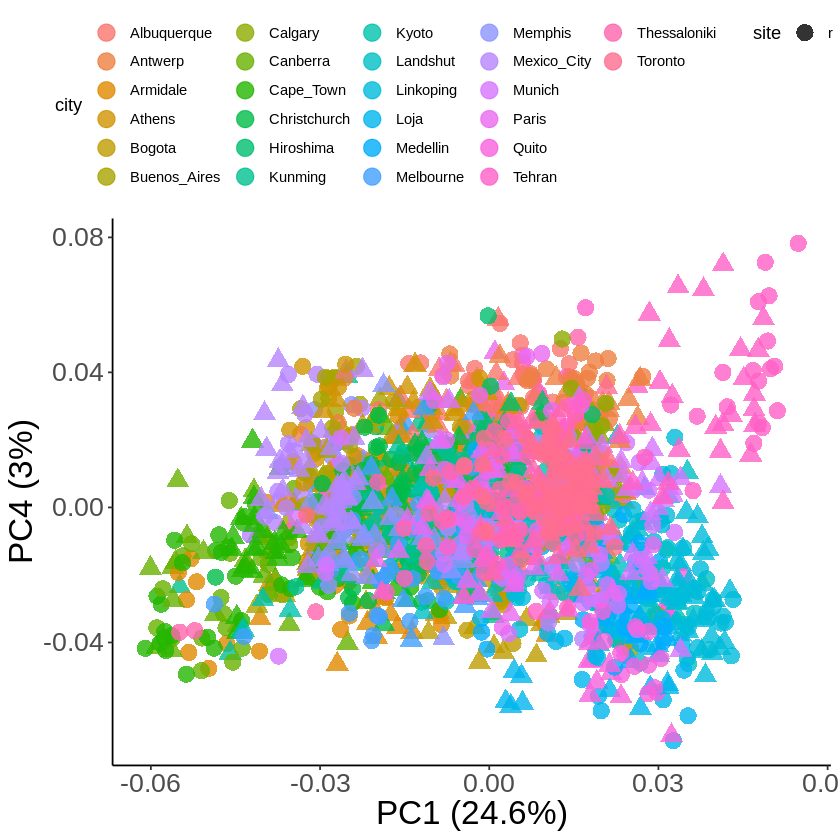

In [195]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = city, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        #stat_ellipse() +
        xlab('PC1 (24.6%)') + ylab('PC2 (9.3%)') +
#         scale_x_continuous(breaks = seq(-0.10, 0.10, 0.10)) +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              legend.position = 'top')
pca_plot1

pca_plot2 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC3, color = city, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        #stat_ellipse() +
        xlab('PC1 (24.6%)') + ylab('PC3 (4.9%)') +
#         scale_x_continuous(breaks = seq(-0.10, 0.10, 0.10)) +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              legend.position = 'top')
pca_plot2

pca_plot3 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC4, color = city, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        #stat_ellipse() +
        xlab('PC1 (24.6%)') + ylab('PC4 (3%)') +
#         scale_x_continuous(breaks = seq(-0.10, 0.10, 0.10)) +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              legend.position = 'top')
pca_plot3

ggsave(
  "Global_PCA_PC1_PC2.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Global_PCA_PC1_PC2.png"
display_png(file=path_to_kplot)

ggsave(
  "Global_PCA_PC1_PC3.png",
  plot = pca_plot2,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Global_PCA_PC1_PC3.png"
display_png(file=path_to_kplot)

ggsave(
  "Global_PCA_PC1_PC4.png",
  plot = pca_plot3,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Global_PCA_PC1_PC4.png"
display_png(file=path_to_kplot)


## Uniform Manifold Approximation Projection (UMAP)

In [196]:
distMat <- as.matrix(dist(covMat))
global_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
global_umap_layout <- global_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., global_order_detail)
head(global_umap_layout)

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V40,sample,continent,city,pop,individual,site,range,library,lane
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>
0.0292448824,-0.09127286,0.04954703,0.1629368,0.000582227,0.049465599,-0.1349830,-0.10138066,-0.11651496,0.018899046,⋯,0.3160985,Albuquerque_29_5,NAM,Albuquerque,29,5,r,Introduced,glue_low1,1
0.0062478426,-0.13116496,0.04953894,0.1150468,0.057832786,-0.016971142,-0.1519171,-0.02814829,-0.06885116,-0.008090666,⋯,0.3059060,Albuquerque_29_9,NAM,Albuquerque,29,9,r,Introduced,glue_low1,1
0.0827915653,-0.13324944,0.08678153,0.1568505,0.024204667,0.071856263,-0.1786237,-0.08451585,-0.13175504,0.046832846,⋯,0.3008125,Albuquerque_32_13,NAM,Albuquerque,32,13,r,Introduced,glue_low1,1
0.1001394457,-0.13818321,0.09246176,0.1420651,0.029010902,0.073942670,-0.1692828,-0.07422262,-0.12198979,0.060005830,⋯,0.3108139,Albuquerque_32_3,NAM,Albuquerque,32,3,r,Introduced,glue_low1,1
0.1023629254,-0.17495997,0.13939240,0.2685278,-0.032527333,0.182042098,-0.2504587,-0.18980477,-0.23001619,0.024716817,⋯,0.3345620,Albuquerque_33_2,NAM,Albuquerque,33,2,r,Introduced,glue_low1,1
0.0006631058,-0.15753301,0.05430346,0.1161522,0.087749140,-0.002517911,-0.1820144,-0.03561927,-0.07257598,-0.026296135,⋯,0.3214706,Albuquerque_33_7,NAM,Albuquerque,33,7,r,Introduced,glue_low1,1


Saving 6.67 x 6.67 in image



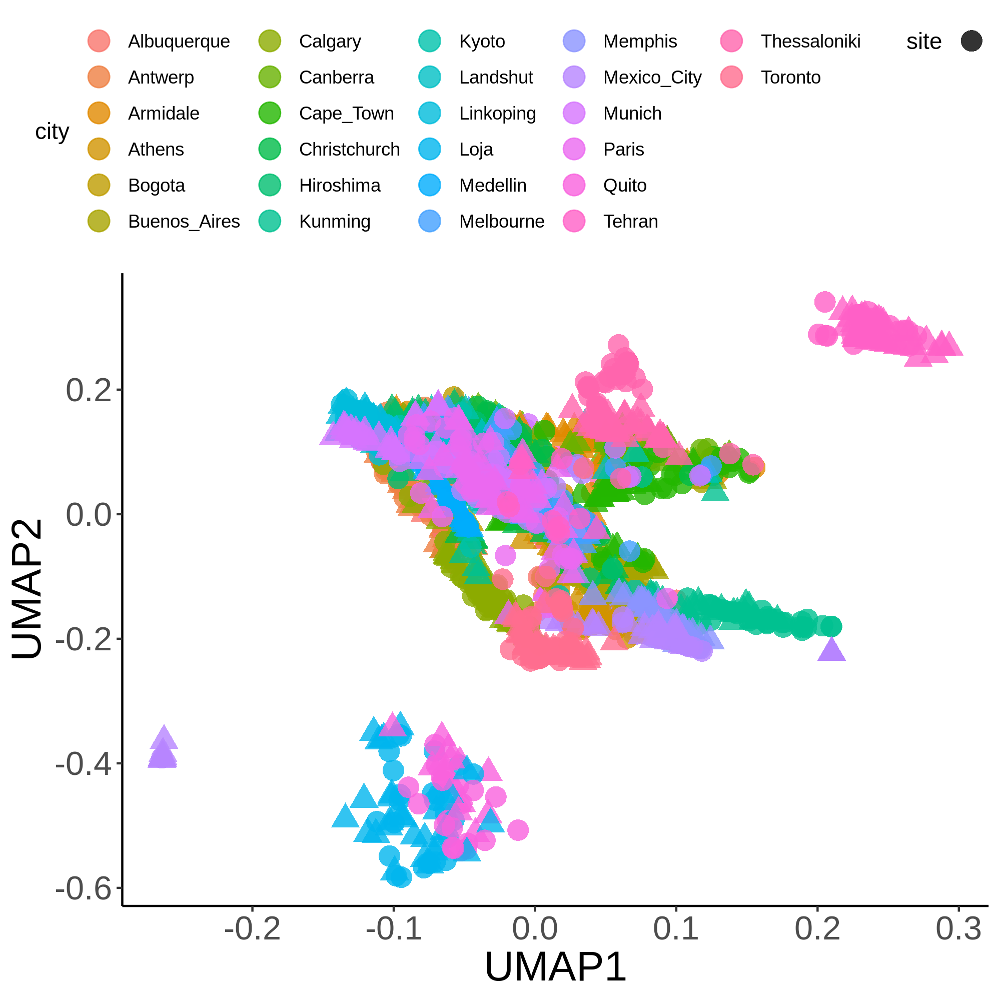

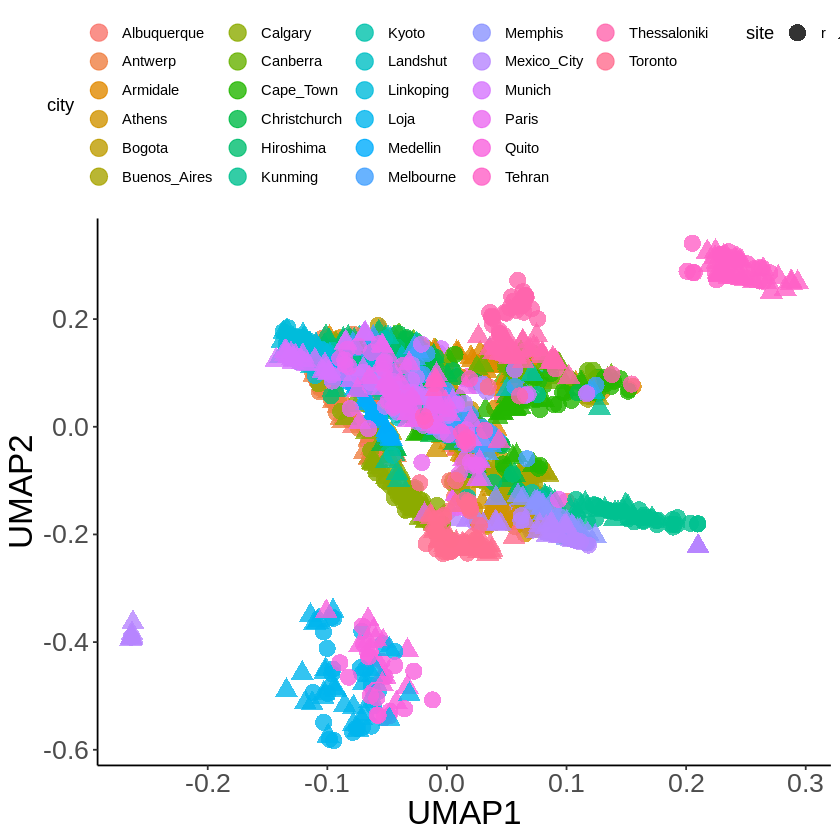

In [197]:
umap_plot <- global_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = city, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              legend.position = 'top')
umap_plot

ggsave(
  "Global_UMAP_UMAP1_UMAP2.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Global_UMAP_UMAP1_UMAP2.png"
display_png(file=path_to_kplot)

In [198]:
# What are those outlier cluster?
global_umap_layout %>% filter((V1 > -0.2 & V2 < -0.2) | ( V1 < 0.18 & V2 > 0.2))

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V40,sample,continent,city,pop,individual,site,range,library,lane
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<int>
-0.09536316,-0.4502377,-0.03574123,0.06145425,0.20297772,0.3478256,-0.2825943,-0.5916182,0.2987808,-0.0264454158,⋯,1.0068069,Loja_1_19,SAM,Loja,1,19,r,Introduced,glue_low1,1
-0.06301646,-0.5558888,-0.12443472,0.02882191,0.23754922,0.2913130,-0.2540111,-0.6241545,0.3088860,0.0006979202,⋯,1.1558630,Loja_1_7,SAM,Loja,1,7,r,Introduced,glue_low1,1
-0.06806414,-0.4497867,-0.04690693,0.05212988,0.19806631,0.3682953,-0.2782002,-0.5950878,0.2775639,-0.0011949219,⋯,1.0045068,Loja_2_10,SAM,Loja,2,10,r,Introduced,glue_low1,1
-0.06146955,-0.5186872,-0.09756762,0.03793338,0.22302784,0.3218814,-0.2604353,-0.6154038,0.2983395,0.0069776586,⋯,1.1016239,Loja_2_20,SAM,Loja,2,20,r,Introduced,glue_low1,1
-0.09617653,-0.4588752,-0.04915797,0.06481921,0.21389917,0.3435115,-0.2744077,-0.5953664,0.3044918,-0.0162691598,⋯,1.0078452,Loja_3_5,SAM,Loja,3,5,r,Introduced,glue_low1,1
-0.07443298,-0.5602830,-0.10170971,0.03467852,0.22814455,0.2878509,-0.2489954,-0.6235629,0.3328727,-0.0092769640,⋯,1.2369165,Loja_3_4,SAM,Loja,3,4,r,Introduced,glue_low1,1
-0.05355014,-0.4029363,0.06054697,0.01036010,0.10028002,0.3545853,-0.3187759,-0.5483054,0.2834132,-0.0995986658,⋯,1.1255929,Loja_3_2,SAM,Loja,3,2,r,Introduced,glue_low1,1
-0.07113956,-0.3801935,0.08517623,0.02074835,0.09540268,0.3611497,-0.3308823,-0.5429359,0.2823080,-0.1163258713,⋯,1.0878208,Loja_2_7,SAM,Loja,2,7,r,Introduced,glue_low1,1
-0.06317912,-0.4810242,-0.07906127,0.04859755,0.21573637,0.3543591,-0.2697836,-0.6099354,0.2799904,0.0147670318,⋯,1.0262017,Loja_2_6,SAM,Loja,2,6,r,Introduced,glue_low1,1


# PCA and UMAP by city

## Albuquerque

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.422543,0.12416617,0.12023646,0.11870491,0.11811176,0.11733162,0.11684117,0.11616353
Proportion of Variance,0.154829,0.01336956,0.01253669,0.01221934,0.01209753,0.01193825,0.01183865,0.01170173
Cumulative Proportion,0.154829,0.16819854,0.18073523,0.19295457,0.20505210,0.21699035,0.22882900,0.24053073


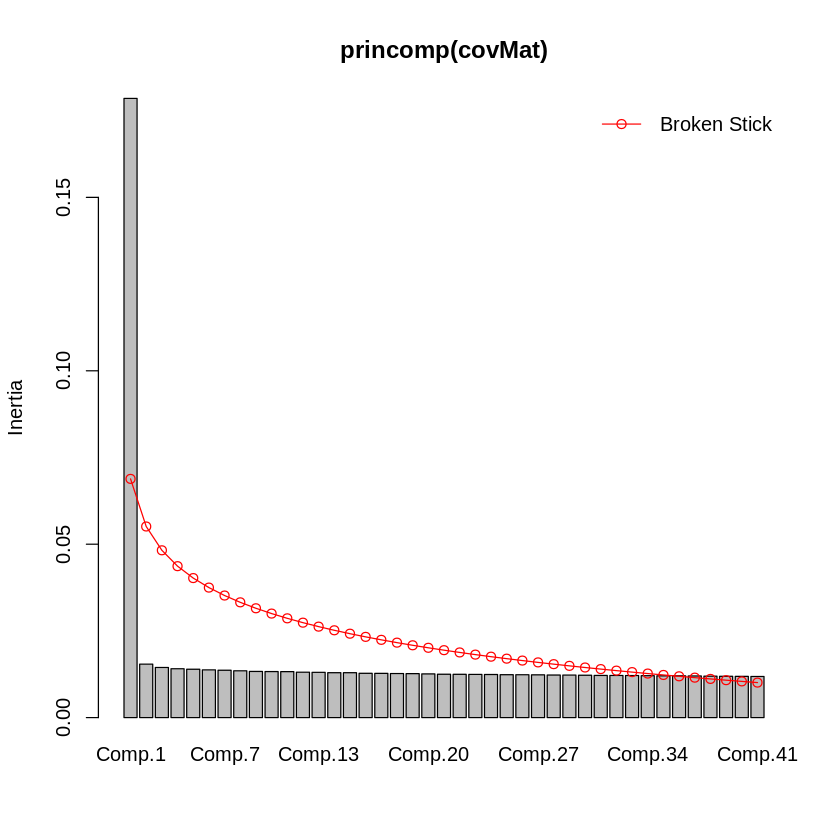

In [199]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Albuquerque/Albuquerque_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Albuquerque_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)


Saving 6.67 x 6.67 in image



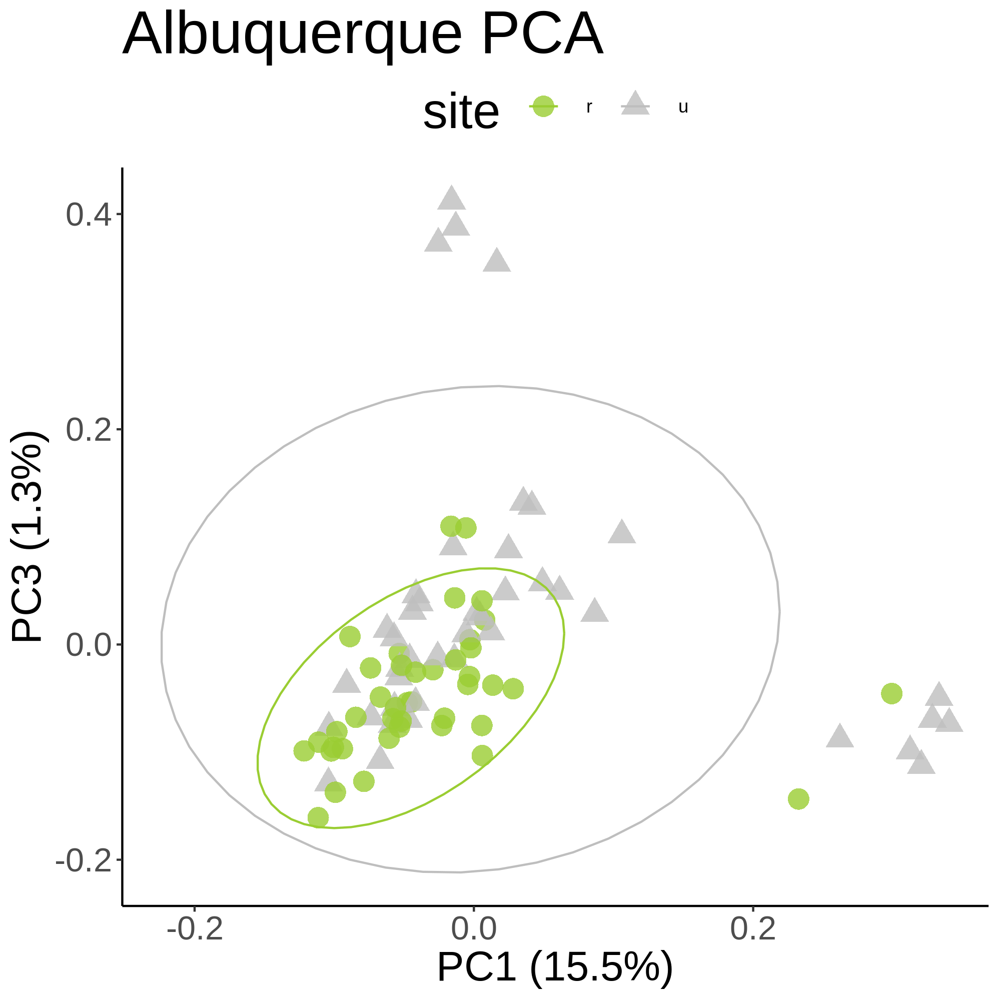

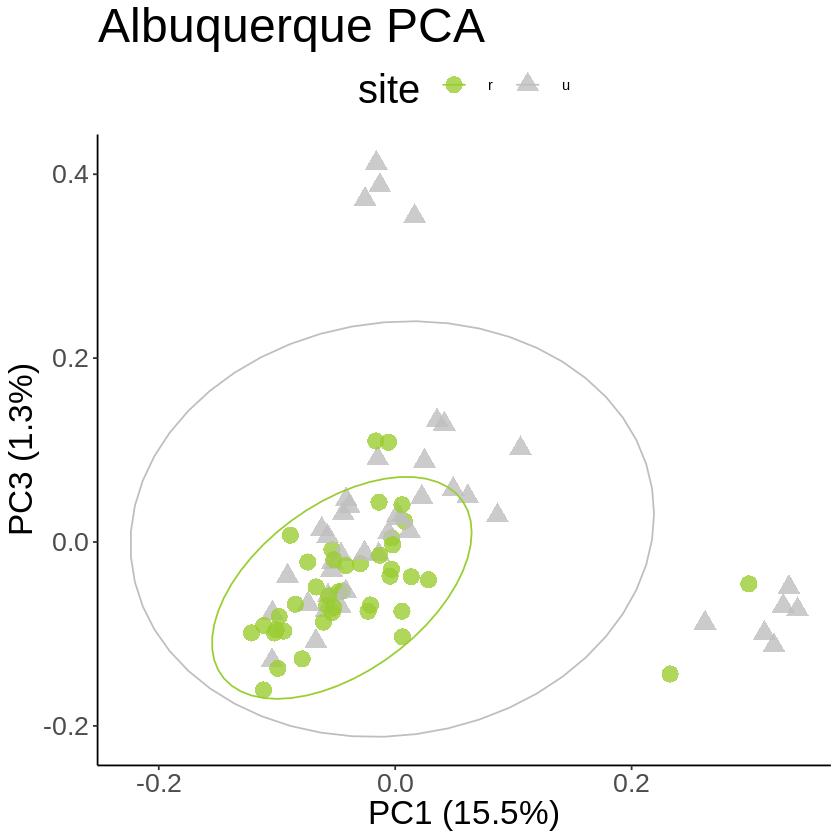

In [200]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        scale_color_manual(values=c("yellowgreen", "grey")) +
        ggtitle('Albuquerque PCA')+
        xlab('PC1 (15.5%)') + ylab('PC3 (1.3%)') +
#         scale_x_continuous(breaks = seq(-0.10, 0.10, 0.10)) +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Albuquerque_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Albuquerque_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”
Saving 6.67 x 6.67 in image

Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”


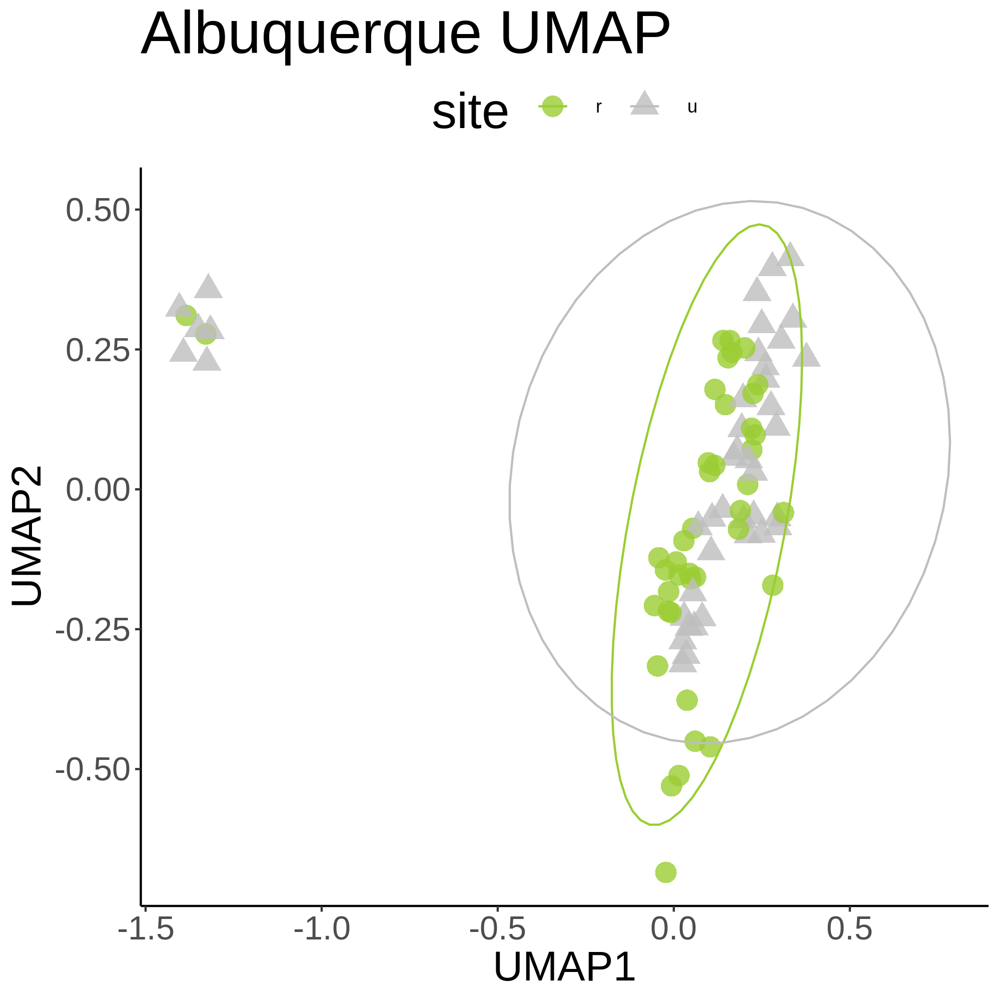

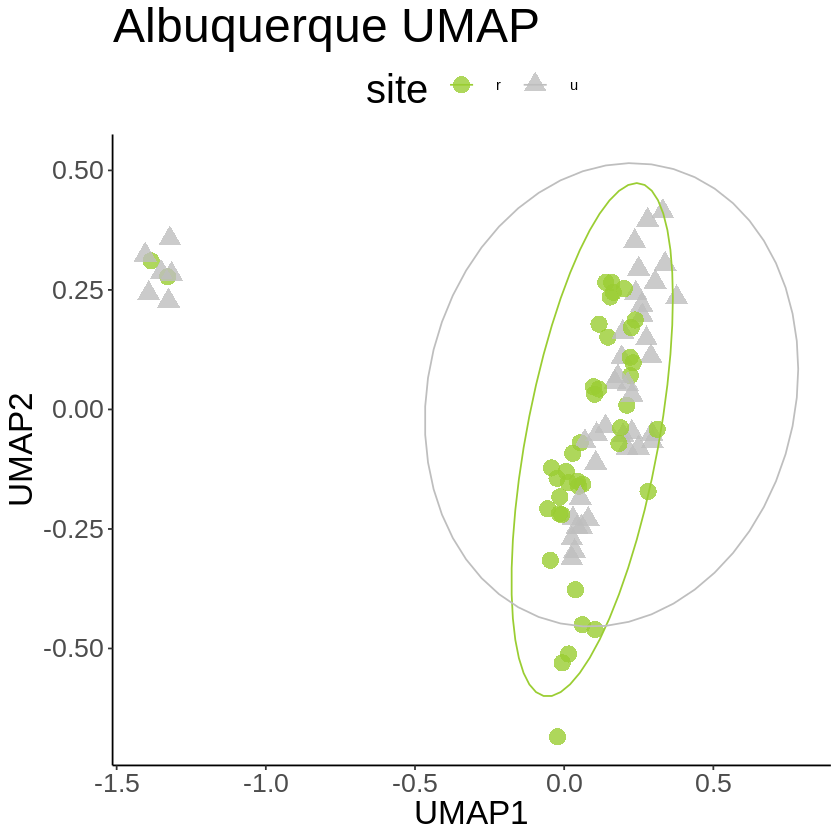

In [201]:
distMat <- as.matrix(dist(covMat))
Albuquerque_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Albuquerque_umap_layout <- Albuquerque_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Albuquerque_order_detail)
    
umap_plot <- Albuquerque_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        ggtitle('Albuquerque UMAP')+
        stat_ellipse() +
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot

ggsave(
  "Albuquerque_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Albuquerque_UMAP.png"
display_png(file=path_to_kplot)

## Antwerp

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4323052,0.12848296,0.12508298,0.12235398,0.12077951,0.12007553,0.11941244,0.11915730
Proportion of Variance,0.1630622,0.01440335,0.01365114,0.01306197,0.01272796,0.01258002,0.01244146,0.01238836
Cumulative Proportion,0.1630622,0.17746557,0.19111671,0.20417868,0.21690664,0.22948666,0.24192813,0.25431648


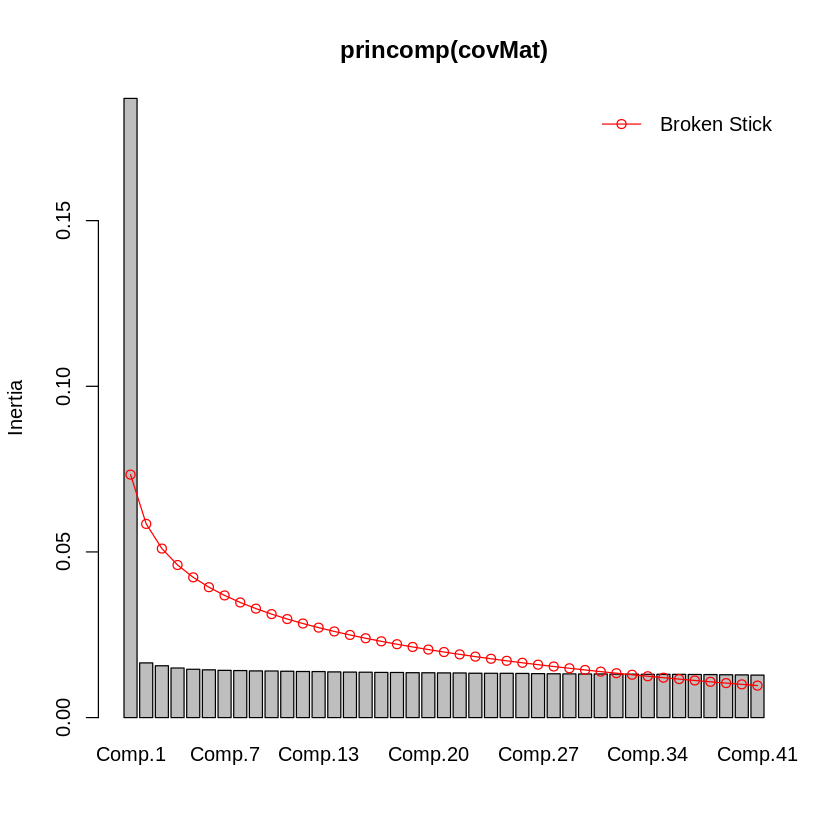

In [202]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Antwerp/Antwerp_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Antwerp_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)


Saving 6.67 x 6.67 in image



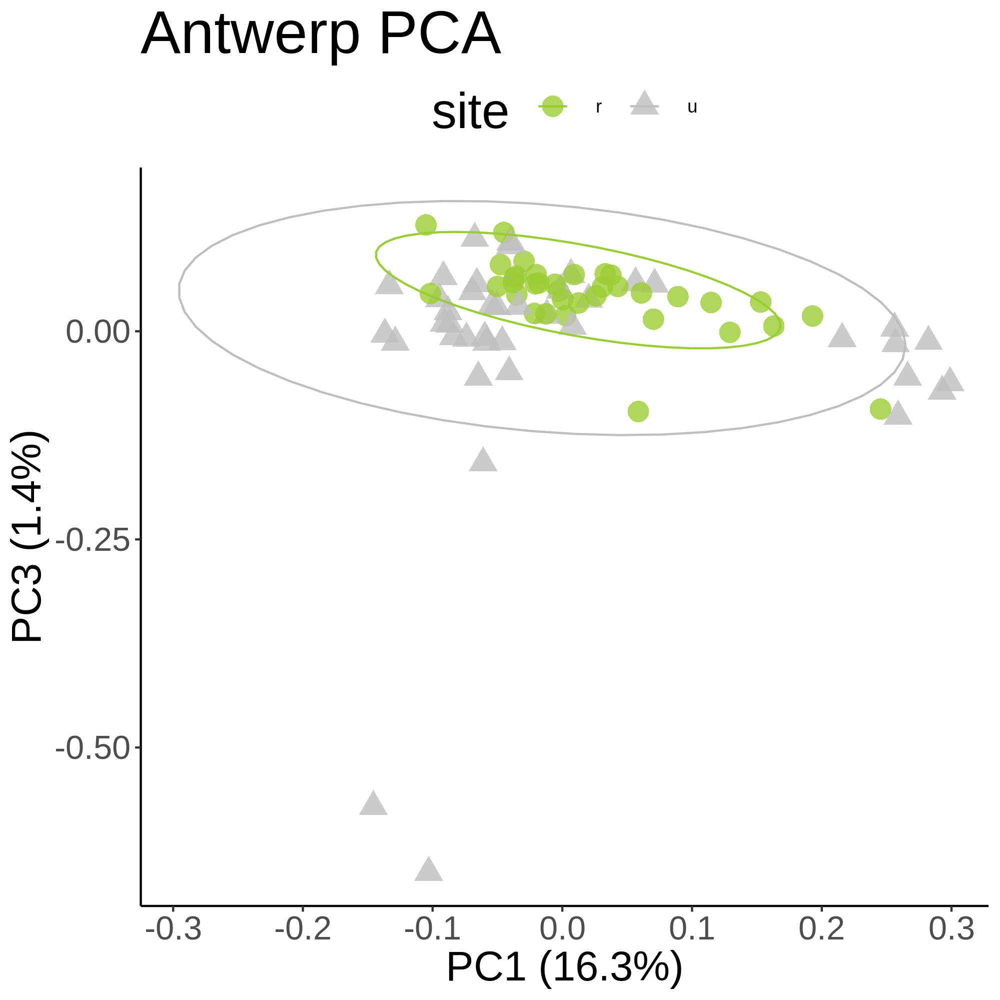

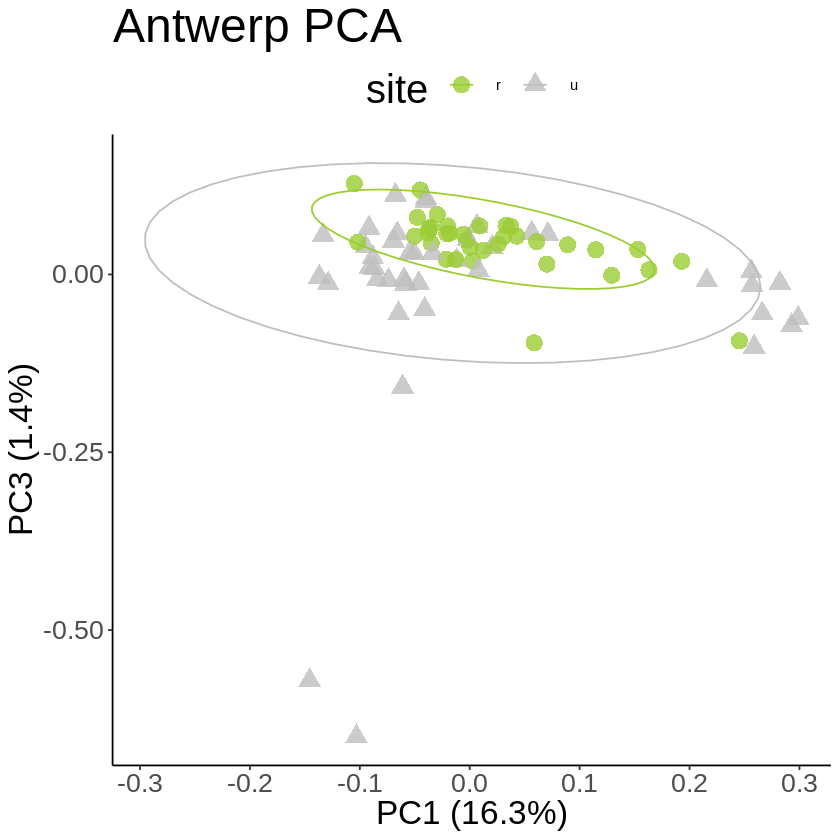

In [203]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        scale_color_manual(values=c("yellowgreen", "grey")) +
        ggtitle('Antwerp PCA')+
        xlab('PC1 (16.3%)') + ylab('PC3 (1.4%)') +
#         scale_x_continuous(breaks = seq(-0.10, 0.10, 0.10)) +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1

ggsave(
  "Antwerp_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Antwerp_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Saving 6.67 x 6.67 in image



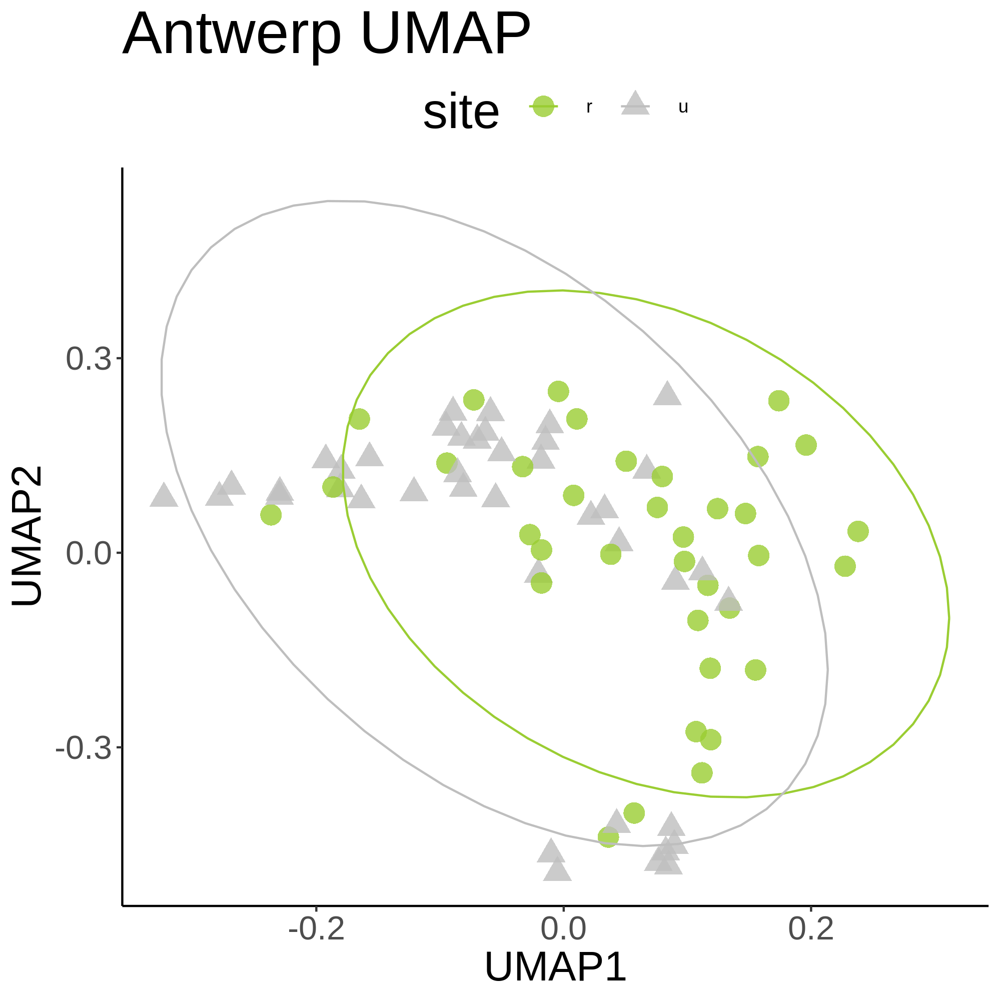

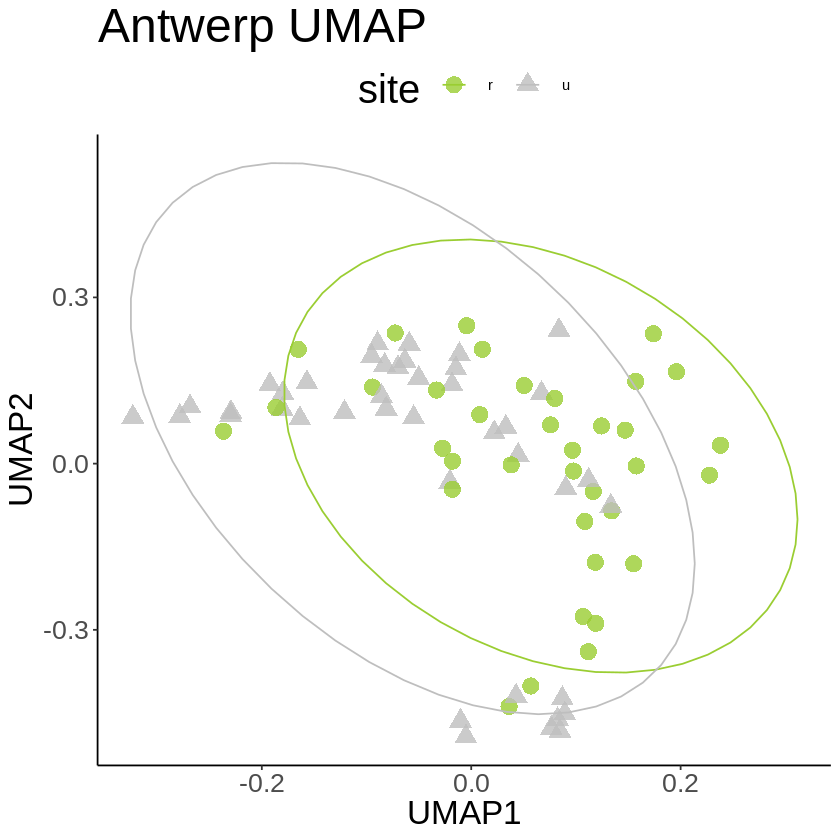

In [204]:
distMat <- as.matrix(dist(covMat))
Antwerp_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Antwerp_umap_layout <- Antwerp_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Antwerp_order_detail)
    
umap_plot <- Antwerp_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Antwerp UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Antwerp_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Antwerp_UMAP.png"
display_png(file=path_to_kplot)

## Armidale

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4539838,0.12751577,0.12485451,0.12127857,0.12055035,0.12031343,0.11908965,0.11896449
Proportion of Variance,0.1811171,0.01428915,0.01369895,0.01292548,0.01277073,0.01272058,0.01246312,0.01243694
Cumulative Proportion,0.1811171,0.19540622,0.20910517,0.22203065,0.23480138,0.24752196,0.25998508,0.27242202


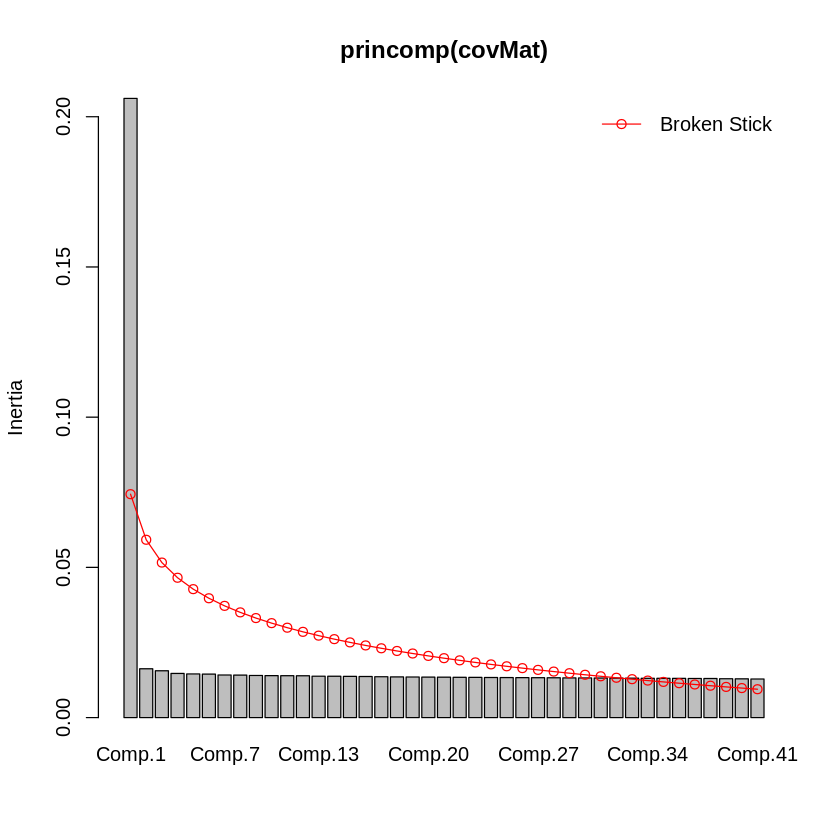

In [205]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Armidale/Armidale_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Armidale_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



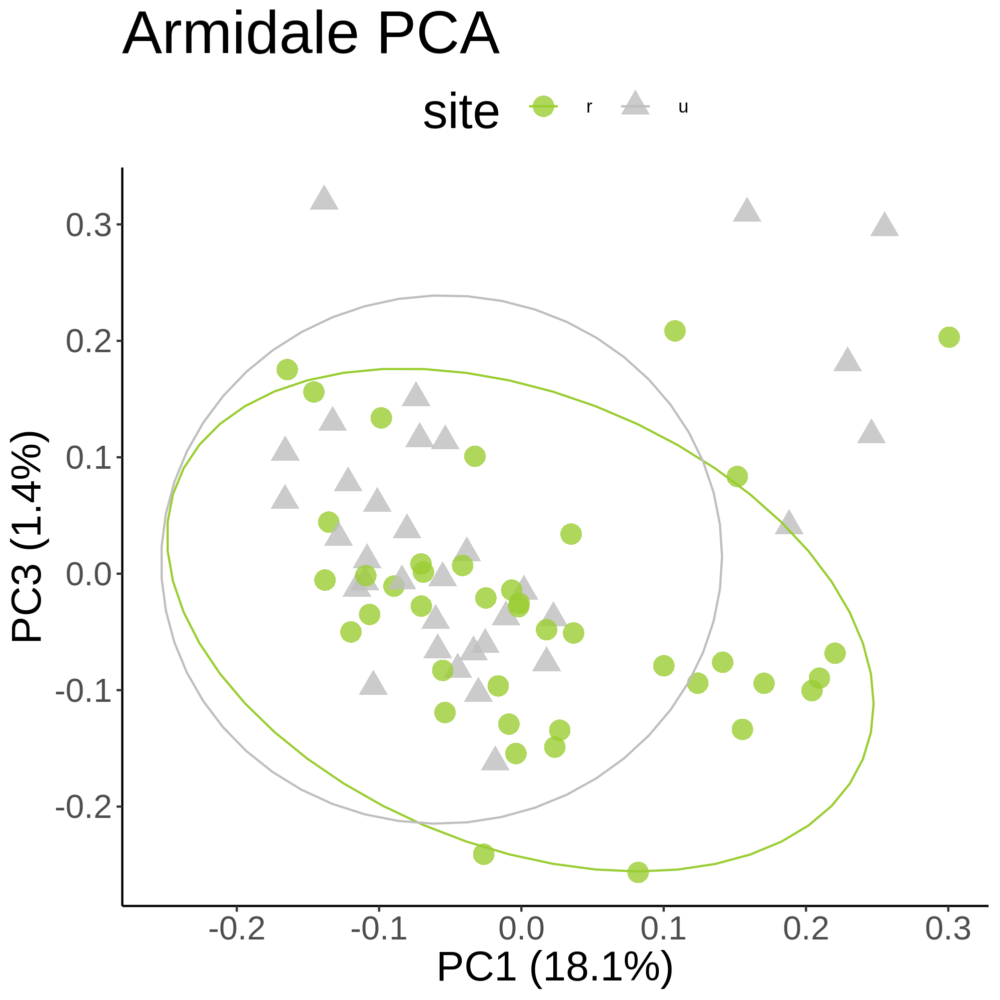

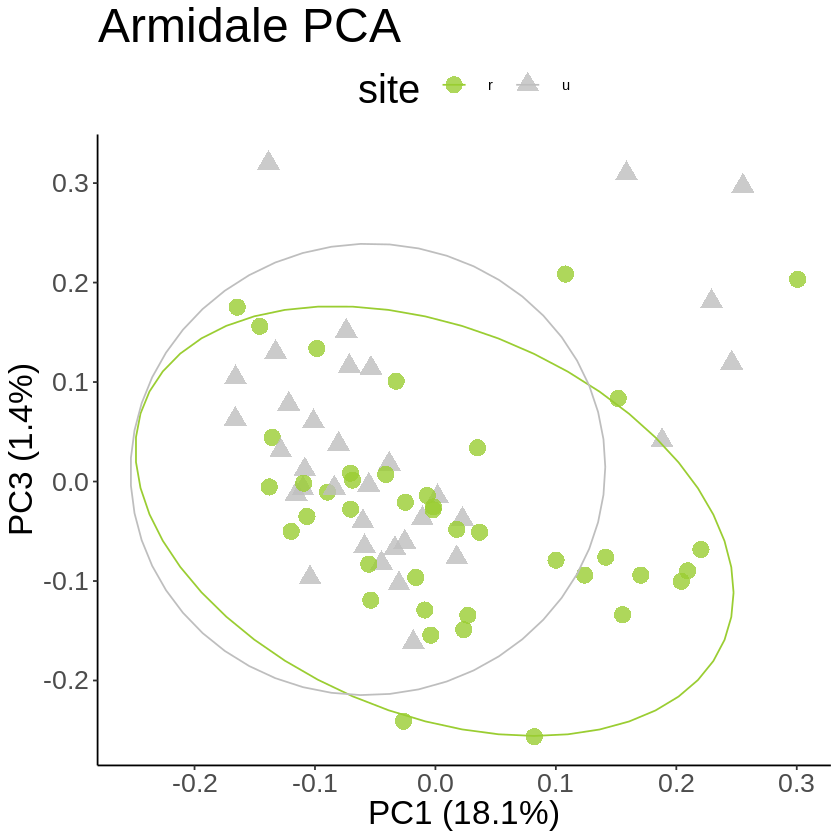

In [206]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Armidale PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (18.1%)') + ylab('PC3 (1.4%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Armidale_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Armidale_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Saving 6.67 x 6.67 in image



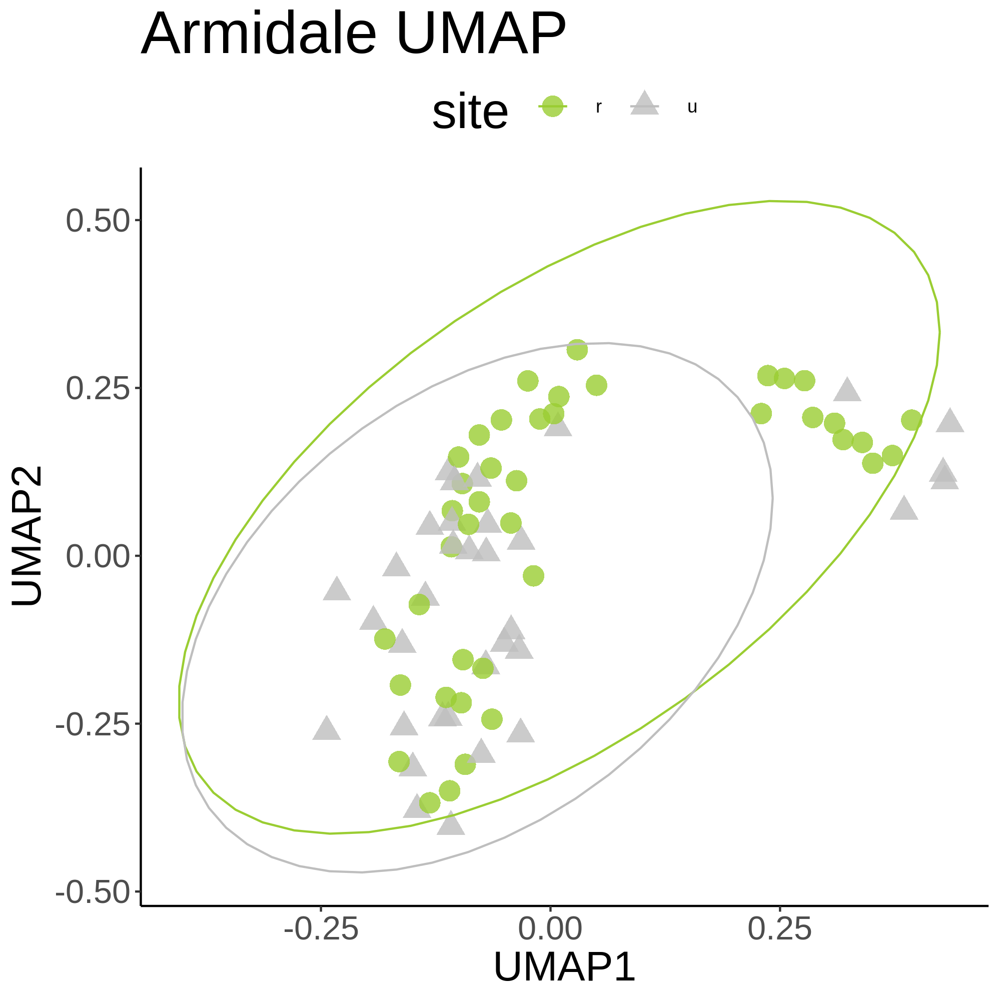

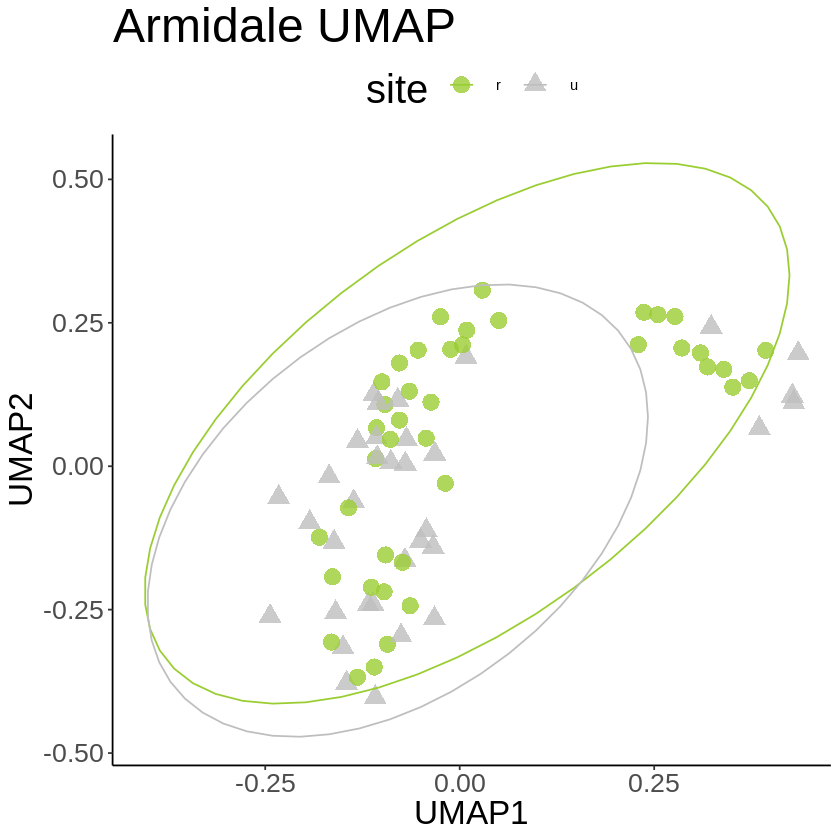

In [207]:
distMat <- as.matrix(dist(covMat))
Armidale_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Armidale_umap_layout <- Armidale_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Armidale_order_detail)
    
umap_plot <- Armidale_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        ggtitle('Armidale UMAP')+
        stat_ellipse() +
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Armidale_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Armidale_UMAP.png"
display_png(file=path_to_kplot)

## Athens

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4139873,0.1301504,0.12809705,0.12573302,0.12437993,0.12306381,0.12096696,0.11942729
Proportion of Variance,0.1525429,0.0150768,0.01460481,0.01407073,0.01376951,0.01347965,0.01302421,0.01269477
Cumulative Proportion,0.1525429,0.1676197,0.18222447,0.19629520,0.21006470,0.22354435,0.23656856,0.24926333


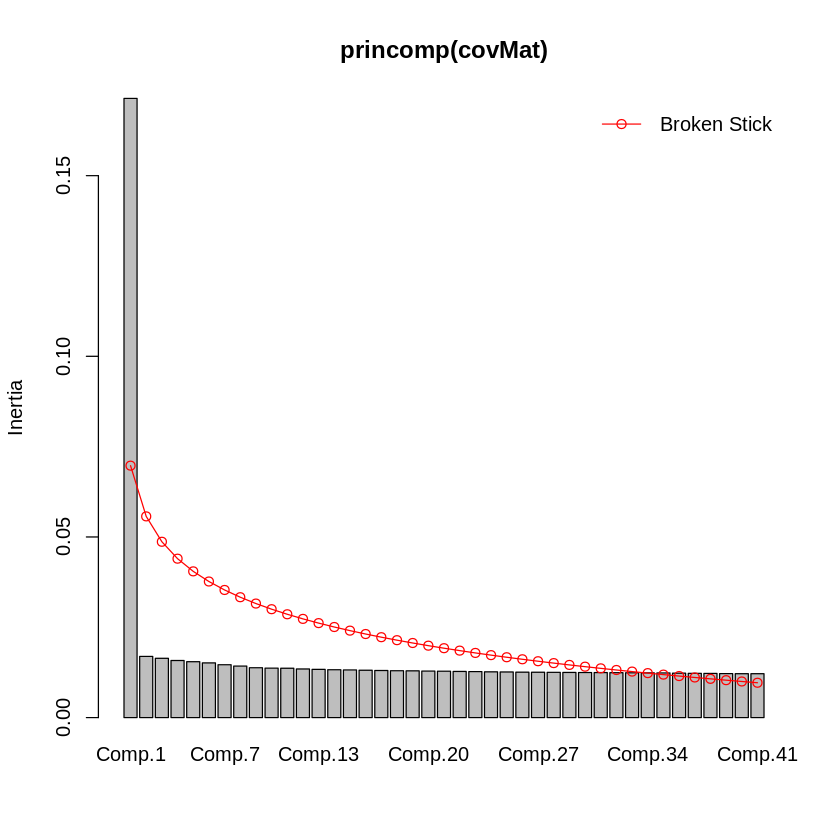

In [208]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Athens/Athens_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Athens_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



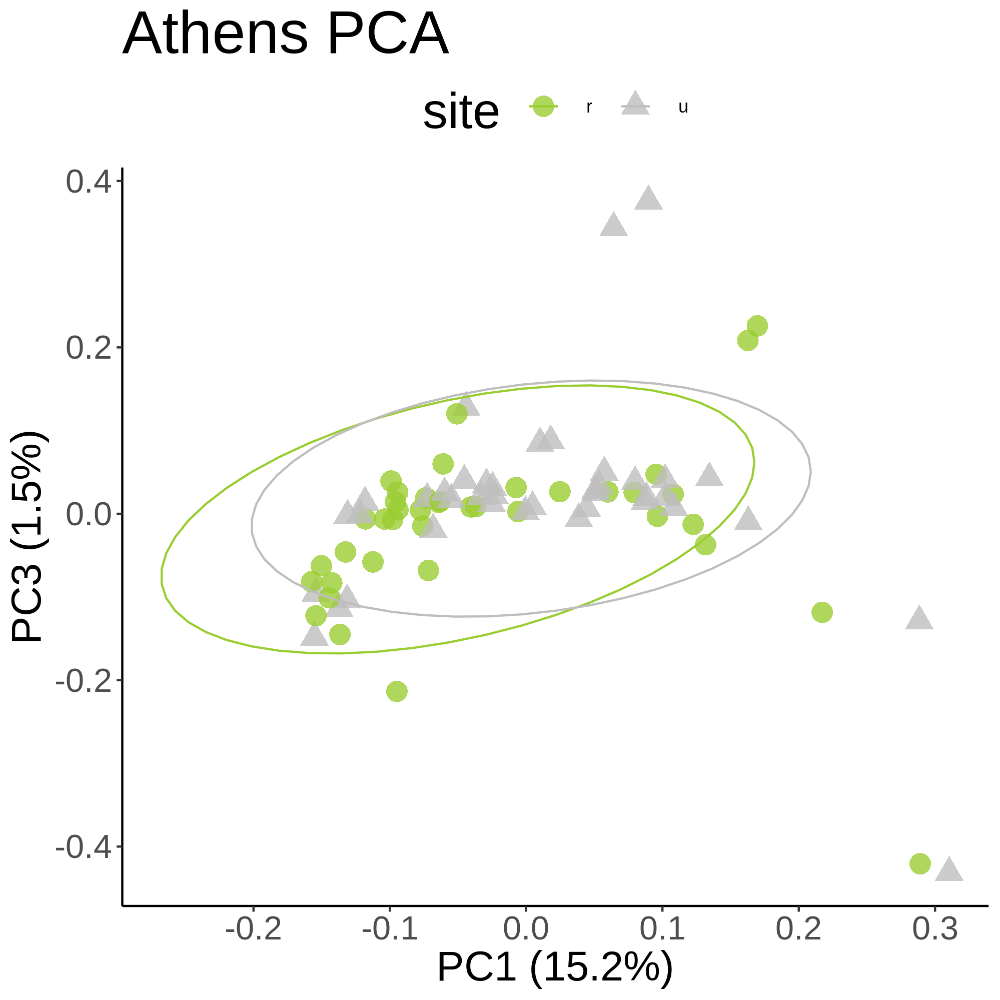

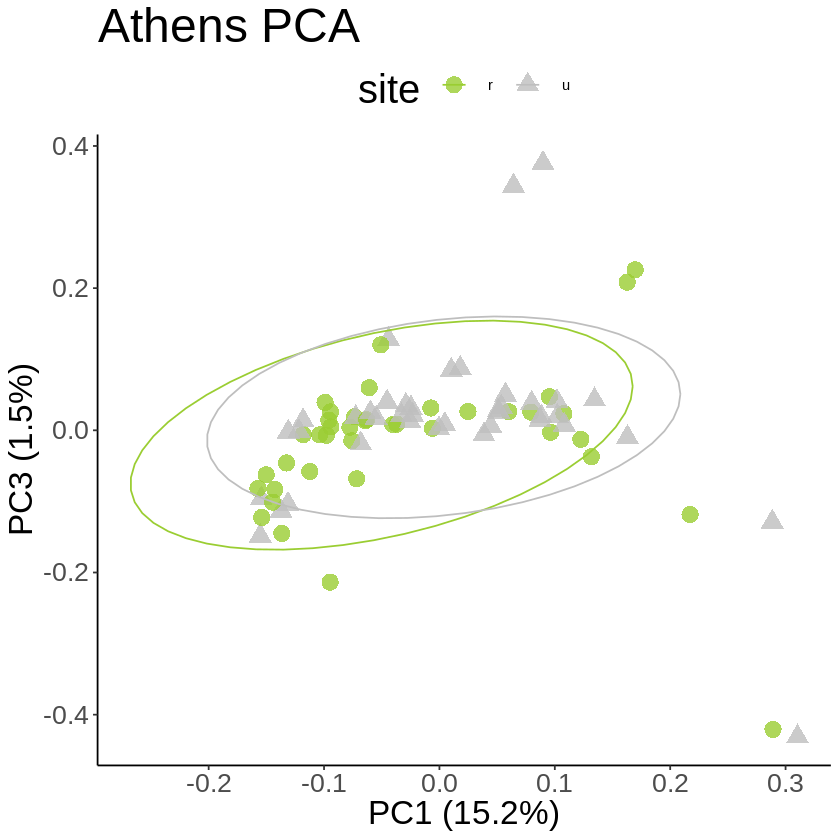

In [209]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Athens PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (15.2%)') + ylab('PC3 (1.5%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Athens_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Athens_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Saving 6.67 x 6.67 in image



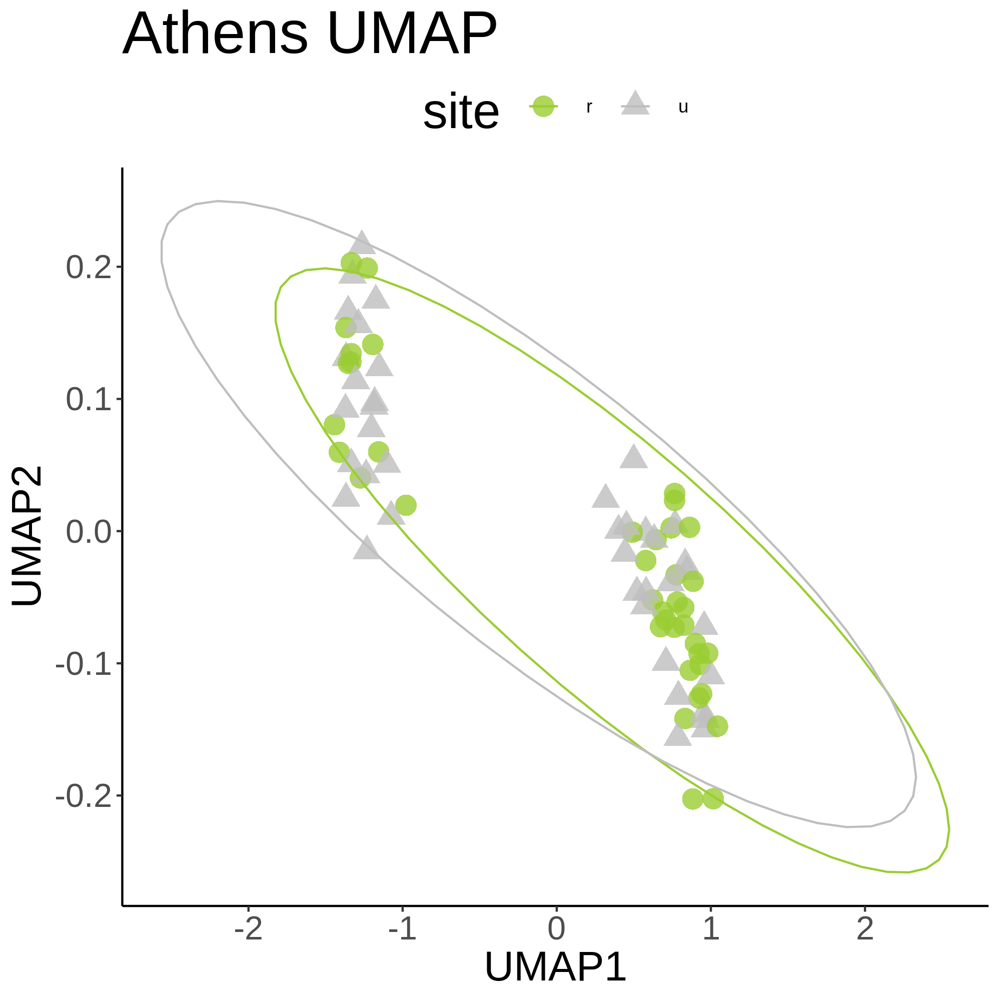

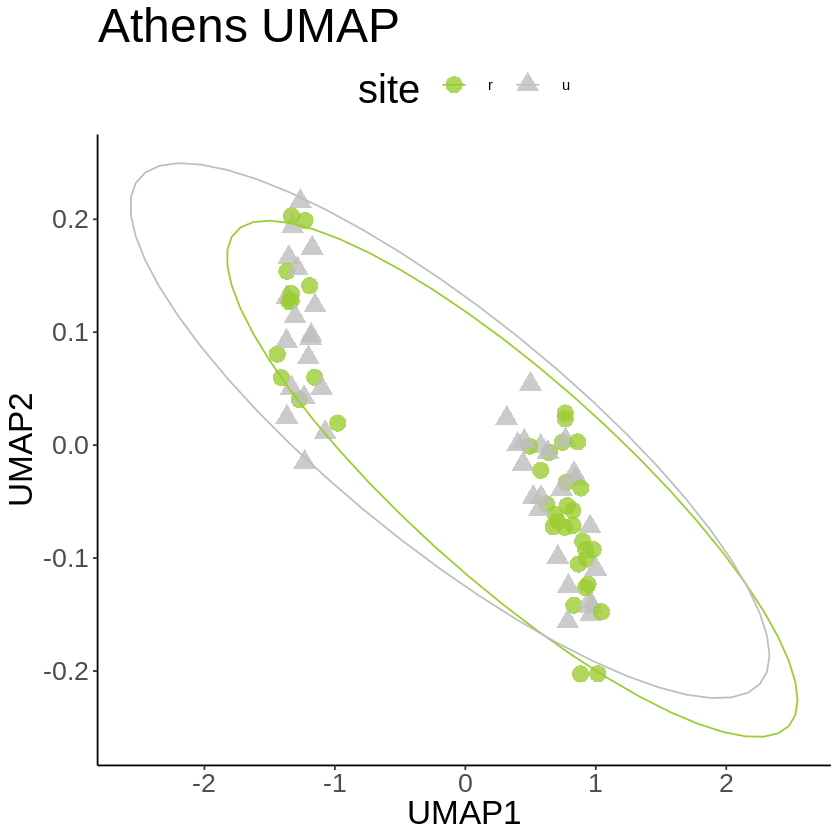

In [210]:
distMat <- as.matrix(dist(covMat))
Athens_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Athens_umap_layout <- Athens_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Athens_order_detail)
    
umap_plot <- Athens_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Athens UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Athens_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Athens_UMAP.png"
display_png(file=path_to_kplot)

## BOGOTA

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.6221021,0.1519038,0.15124458,0.14905240,0.14824089,0.14741005,0.14691687,0.1467412
Proportion of Variance,0.2980828,0.0177726,0.01761868,0.01711164,0.01692582,0.01673662,0.01662482,0.0165851
Cumulative Proportion,0.2980828,0.3158554,0.33347411,0.35058575,0.36751157,0.38424819,0.40087301,0.4174581


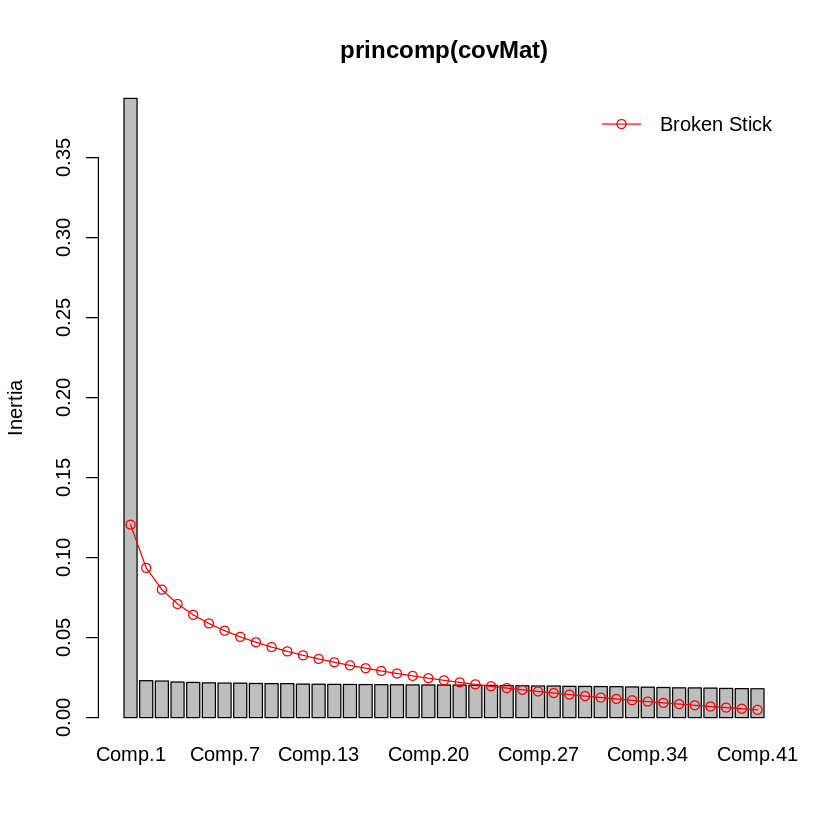

In [211]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Bogota/Bogota_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Bogota_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



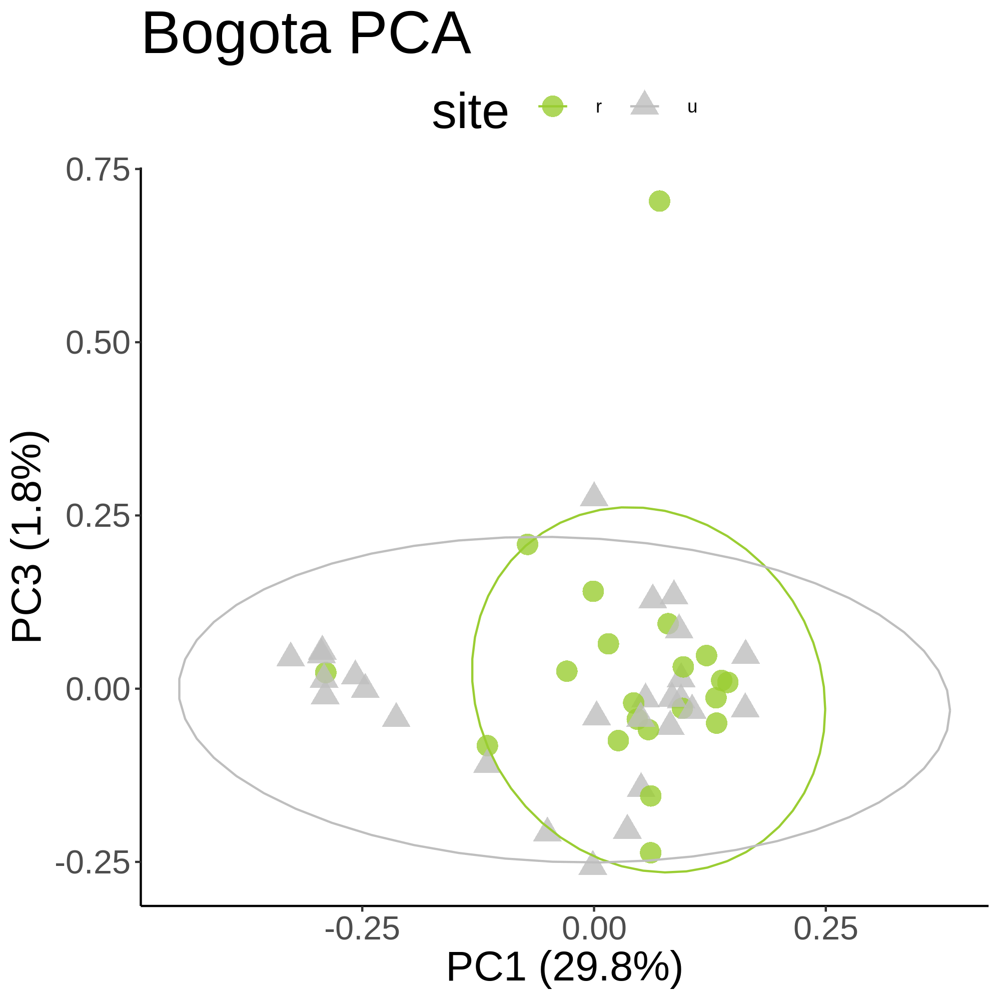

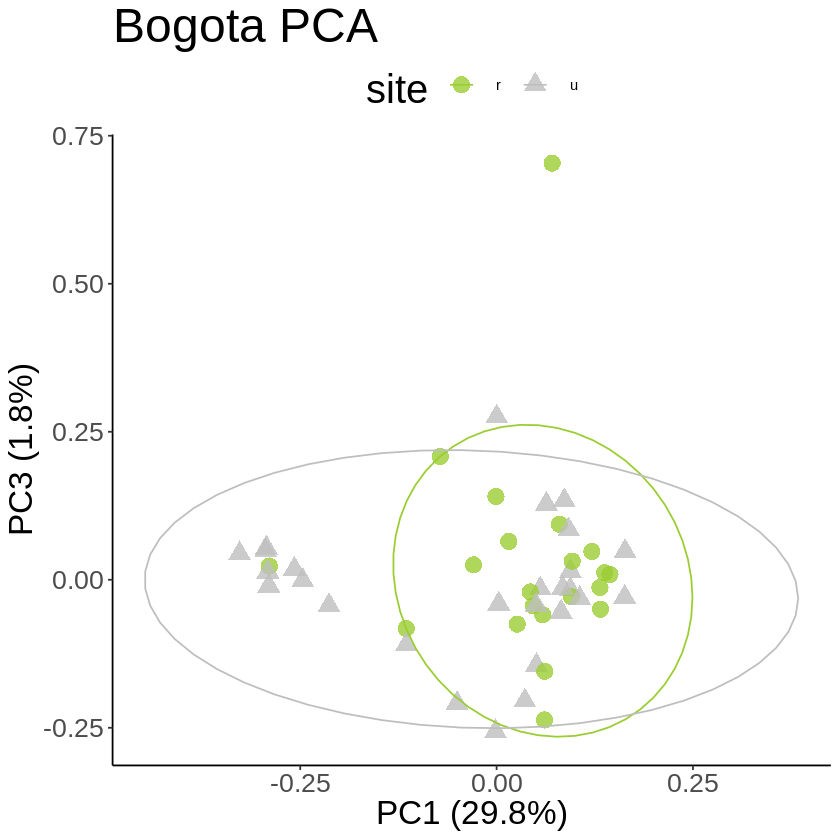

In [212]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Bogota PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (29.8%)') + ylab('PC3 (1.8%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Bogota_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Bogota_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Saving 6.67 x 6.67 in image



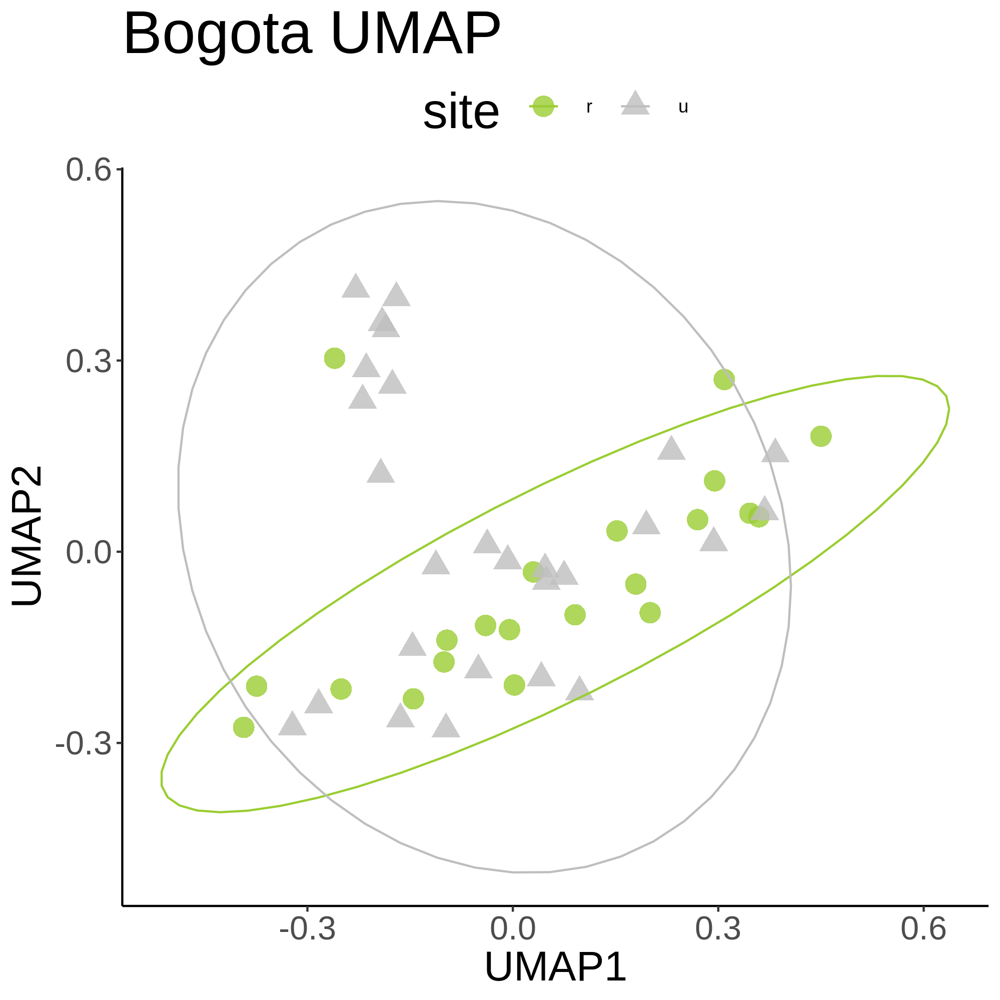

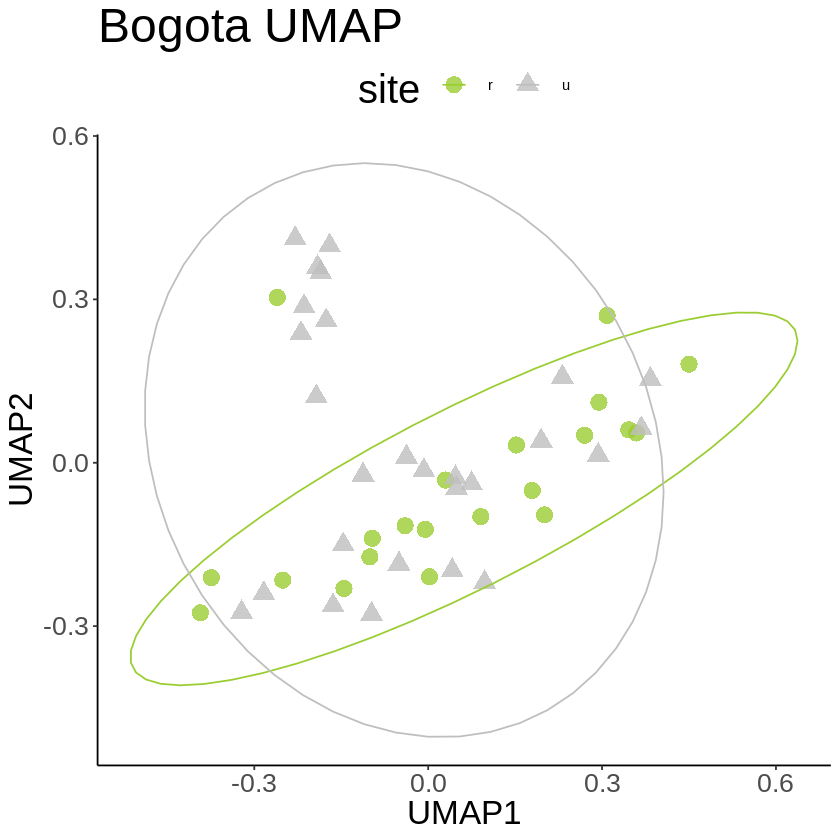

In [213]:
distMat <- as.matrix(dist(covMat))
Bogota_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Bogota_umap_layout <- Bogota_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Bogota_order_detail)
    
umap_plot <- Bogota_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Bogota UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Bogota_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Bogota_UMAP.png"
display_png(file=path_to_kplot)

## Buenos Aires

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4437743,0.12804321,0.12579291,0.12384661,0.12251022,0.1209131,0.12044684,0.12002030
Proportion of Variance,0.1707860,0.01421808,0.01372272,0.01330136,0.01301585,0.0126787,0.01258111,0.01249215
Cumulative Proportion,0.1707860,0.18500406,0.19872678,0.21202815,0.22504400,0.2377227,0.25030381,0.26279596


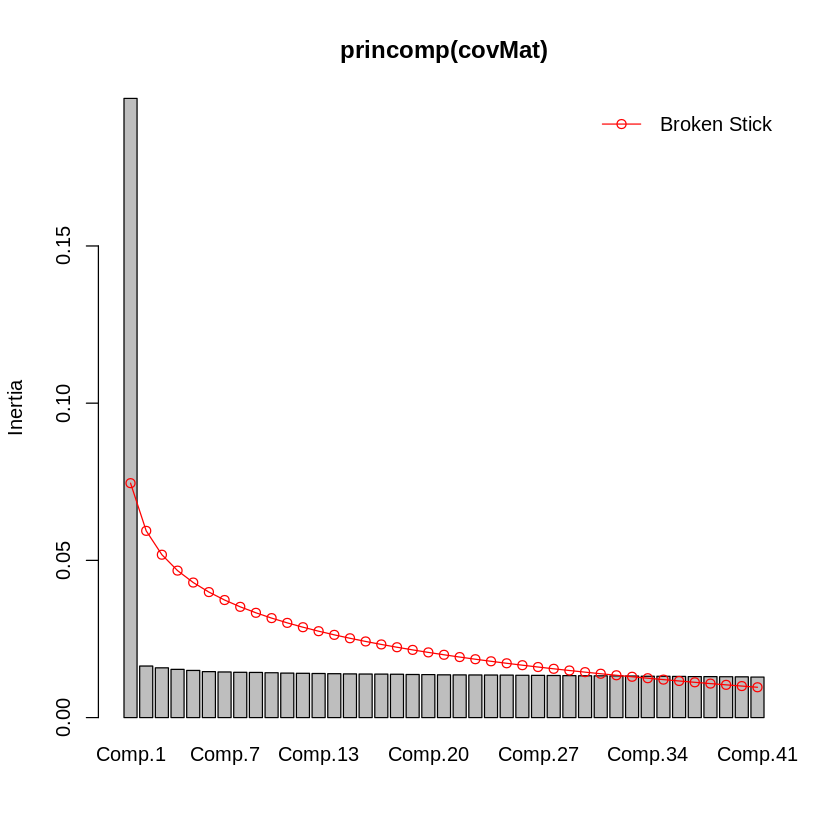

In [214]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Buenos_Aires/Buenos_Aires_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Buenos_Aires_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



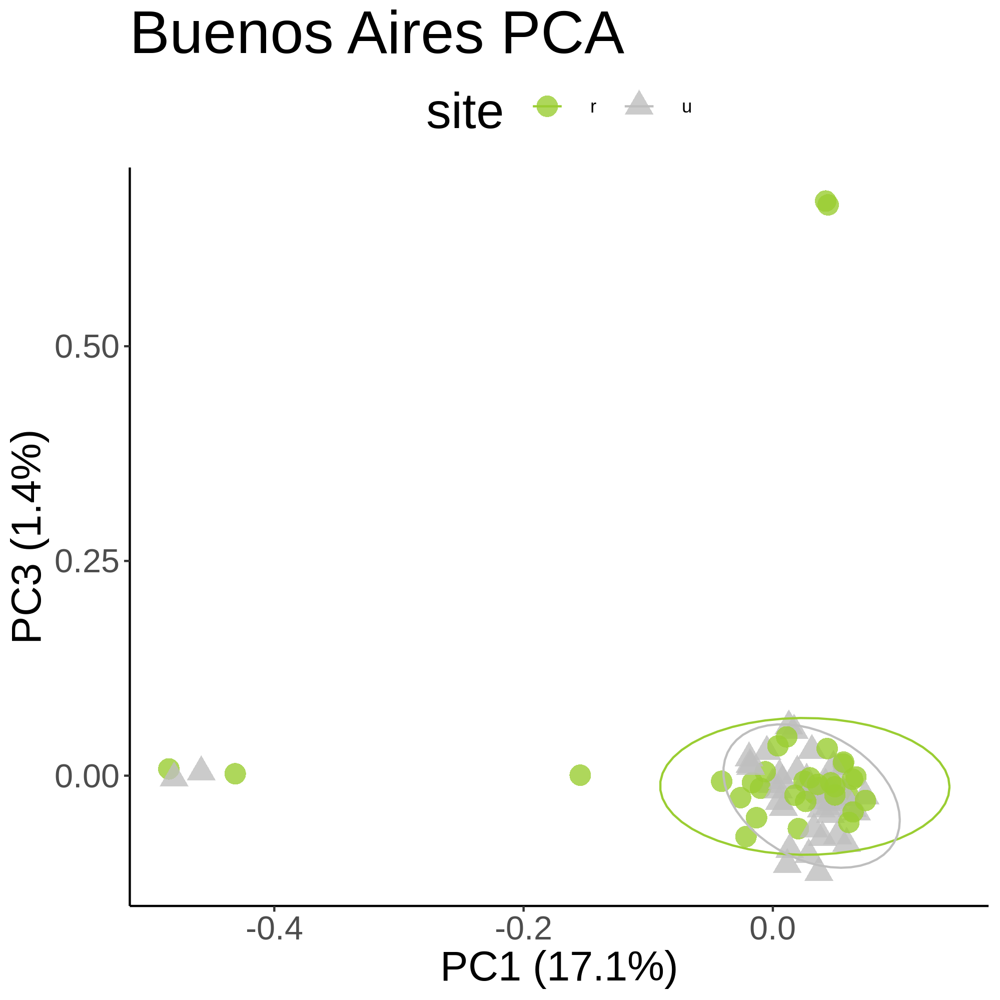

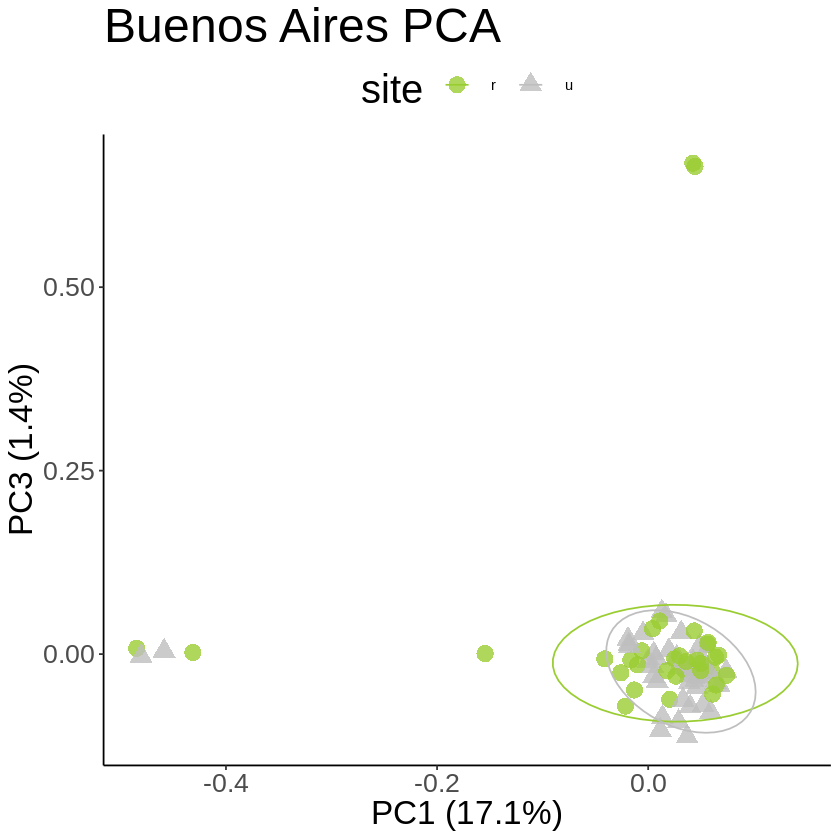

In [215]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Buenos Aires PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (17.1%)') + ylab('PC3 (1.4%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Buenos_Aires_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Buenos_Aires_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Saving 6.67 x 6.67 in image



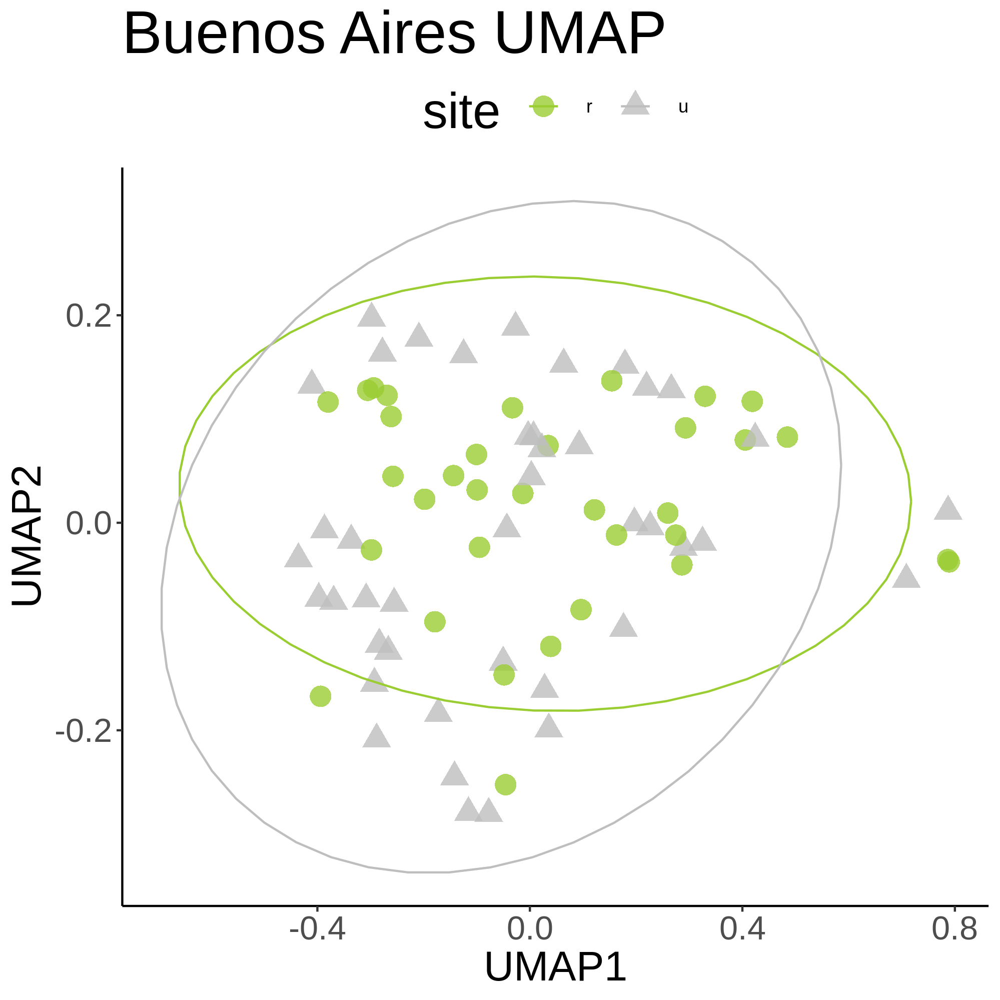

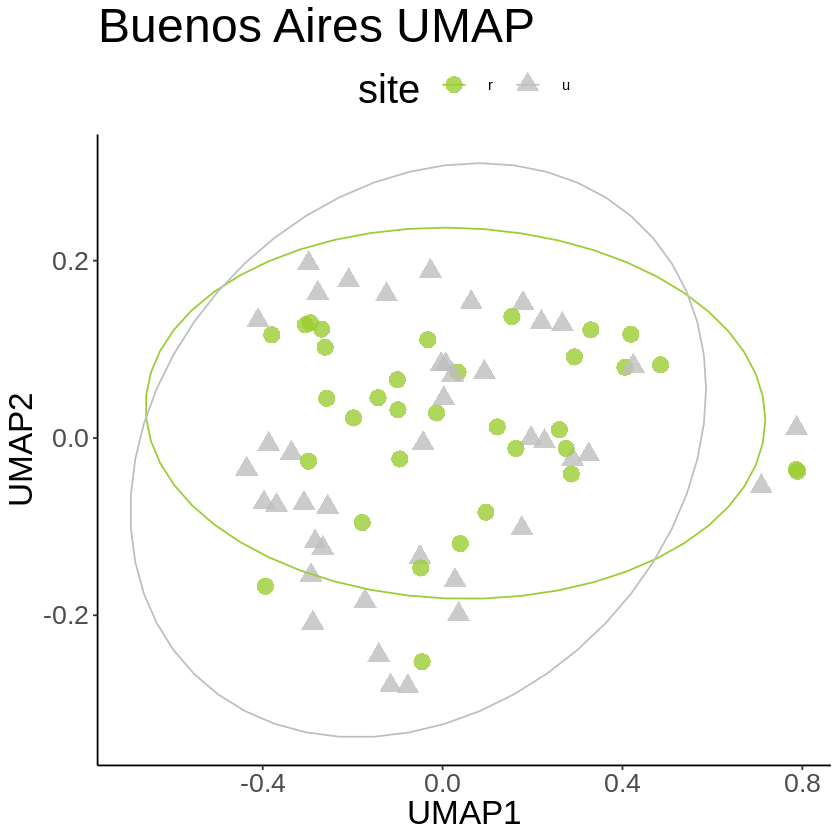

In [216]:
distMat <- as.matrix(dist(covMat))
Buenos_Aires_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Buenos_Aires_umap_layout <- Buenos_Aires_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Buenos_Aires_order_detail)
    
umap_plot <- Buenos_Aires_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Buenos Aires UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Buenos_Aires_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Buenos_Aires_UMAP.png"
display_png(file=path_to_kplot)

## Calgary

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.3664854,0.12798576,0.12574951,0.12141456,0.12016748,0.11682333,0.11622532,0.11412307
Proportion of Variance,0.1257777,0.01533958,0.01480821,0.01380485,0.01352272,0.01278054,0.01265003,0.01219655
Cumulative Proportion,0.1257777,0.14111725,0.15592546,0.16973031,0.18325303,0.19603357,0.20868360,0.22088015


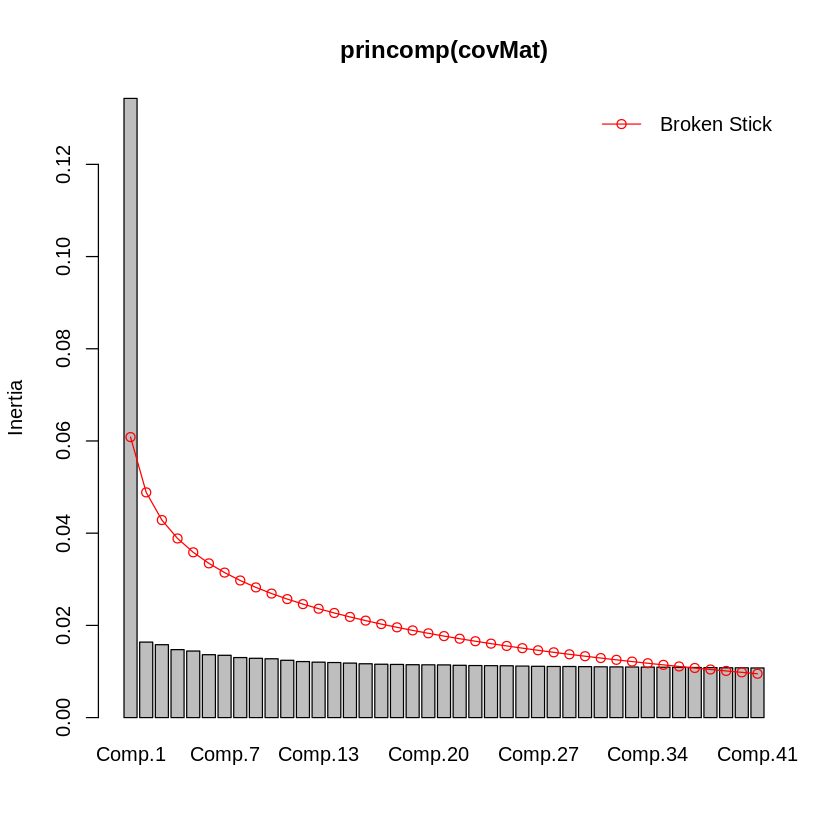

In [217]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Calgary/Calgary_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Calgary_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



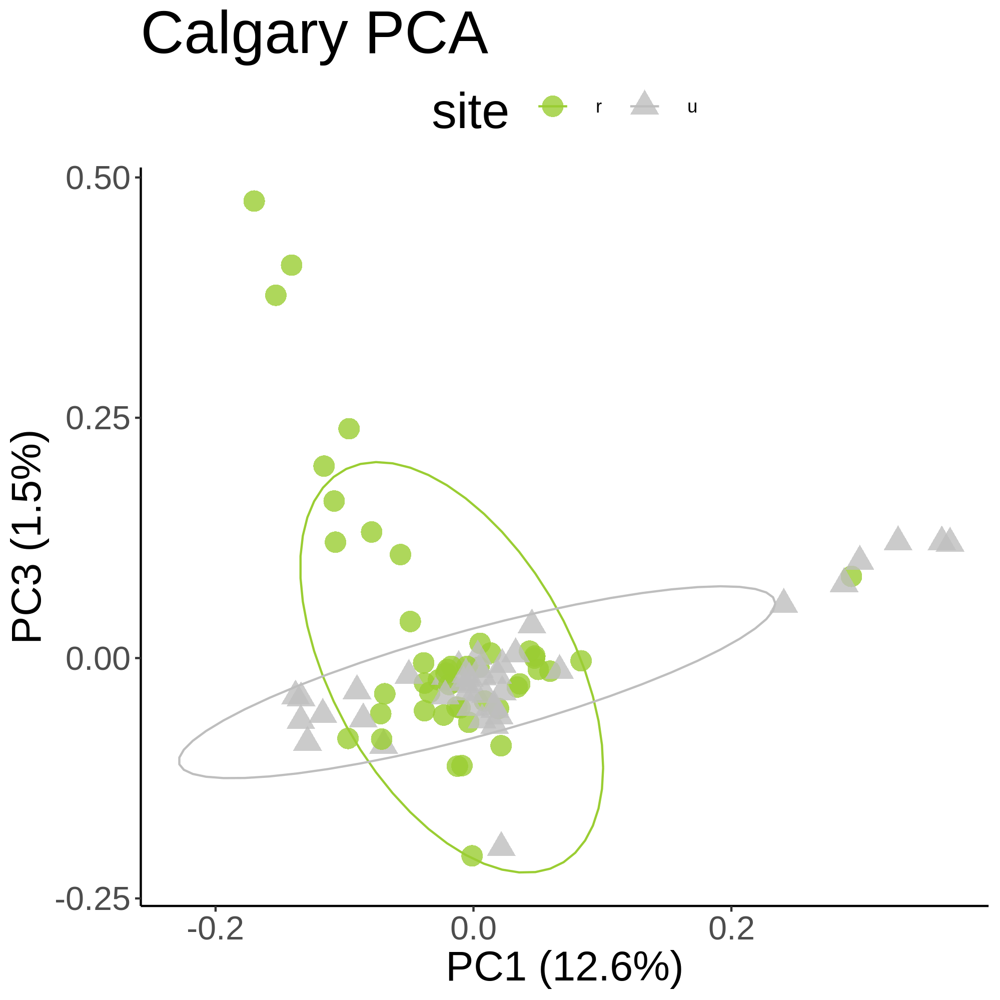

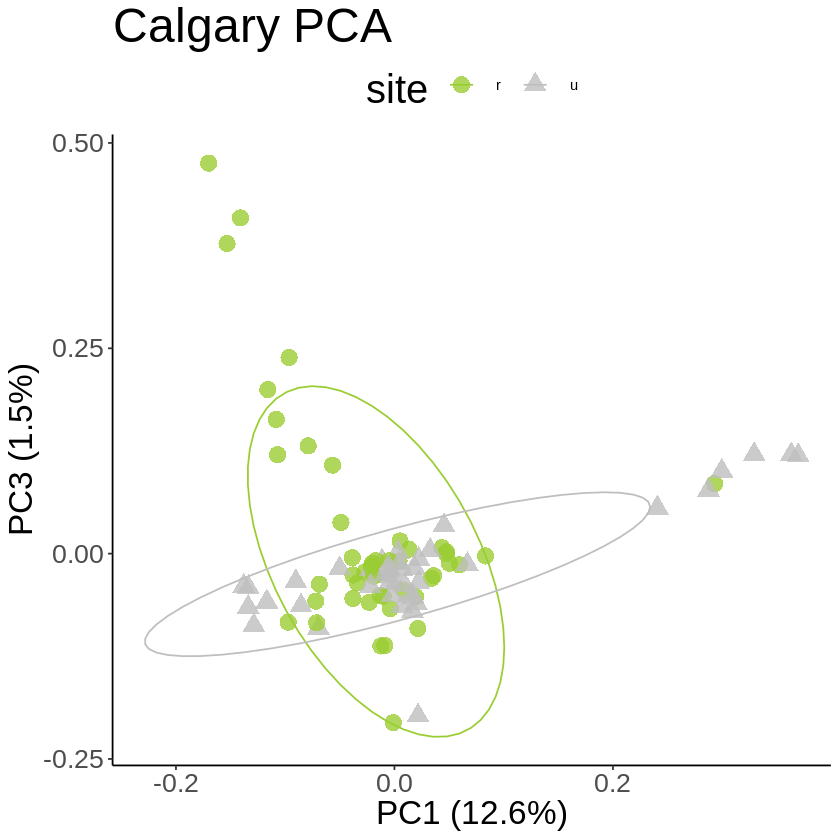

In [218]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        scale_color_manual(values=c("yellowgreen", "grey")) +
        ggtitle('Calgary PCA')+
        xlab('PC1 (12.6%)') + ylab('PC3 (1.5%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Calgary_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Calgary_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”
Saving 6.67 x 6.67 in image

Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”


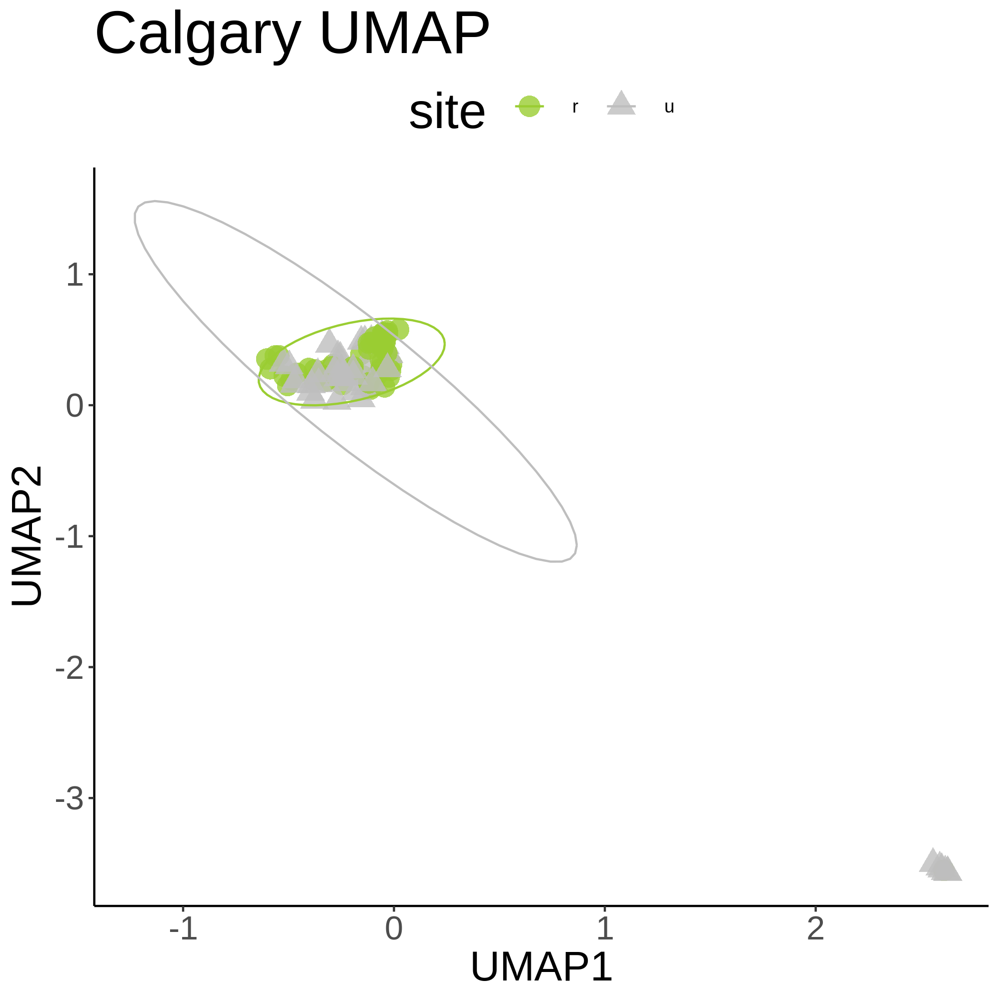

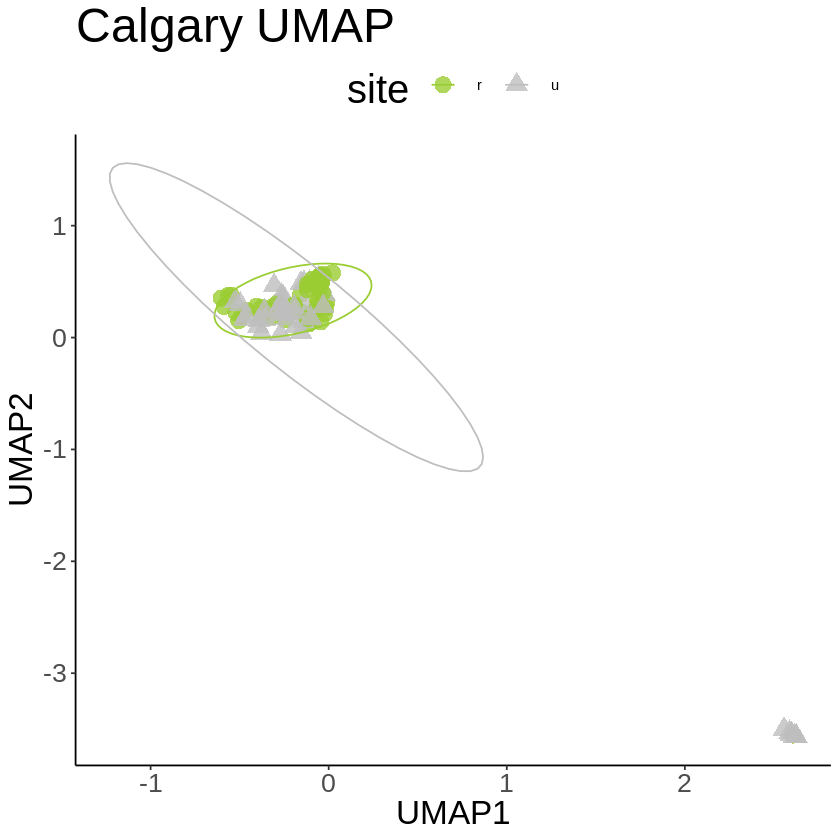

In [219]:
distMat <- as.matrix(dist(covMat))
Calgary_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Calgary_umap_layout <- Calgary_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Calgary_order_detail)
    
umap_plot <- Calgary_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Calgary UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Calgary_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Calgary_UMAP.png"
display_png(file=path_to_kplot)

## Canberra

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.7456408,0.16475427,0.16424226,0.16322159,0.16192811,0.16124707,0.1600892,0.15948707
Proportion of Variance,0.3759574,0.01835493,0.01824102,0.01801501,0.01773062,0.01758179,0.0173302,0.01720007
Cumulative Proportion,0.3759574,0.39431236,0.41255338,0.43056839,0.44829901,0.46588079,0.4832110,0.50041107


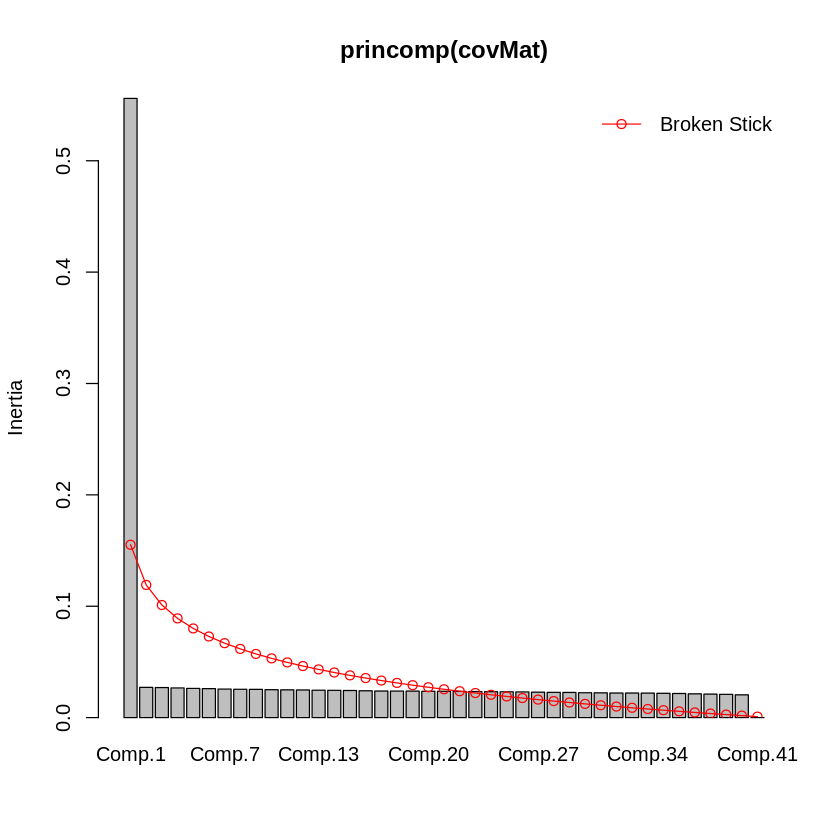

In [220]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Canberra/Canberra_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Canberra_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



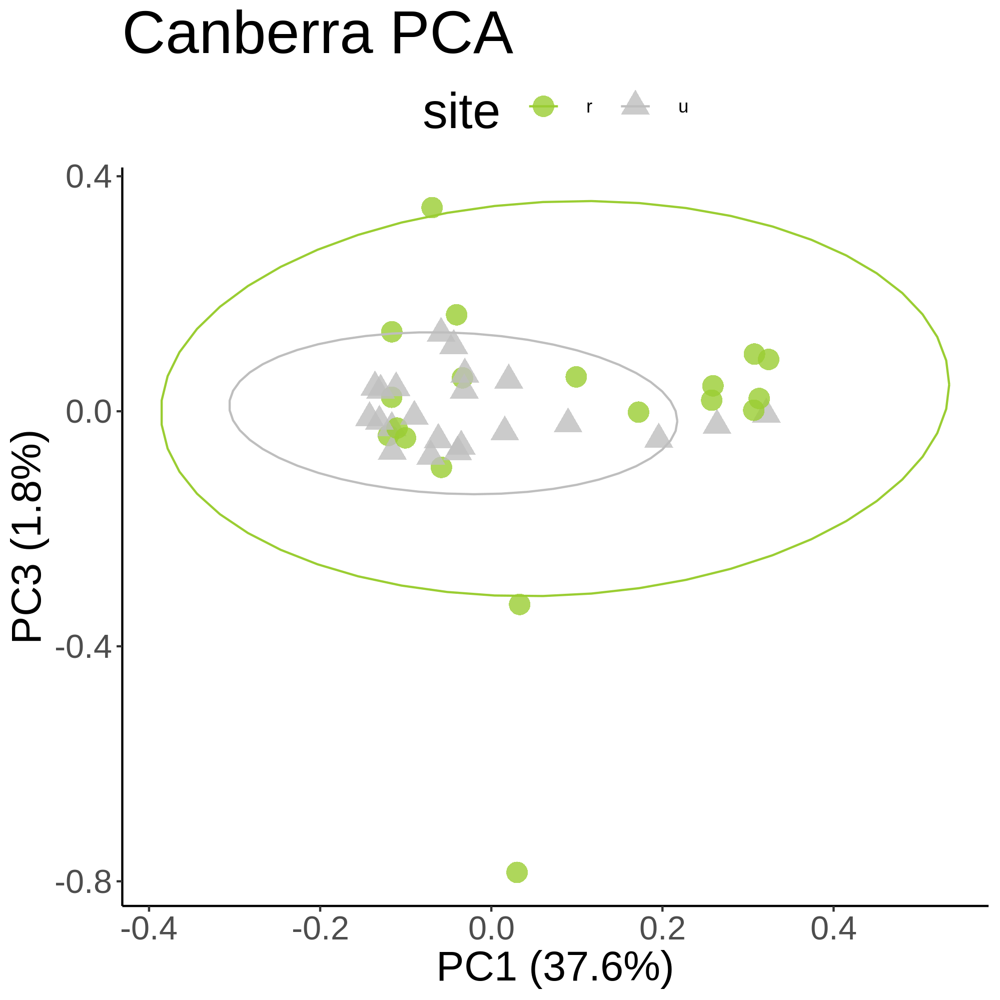

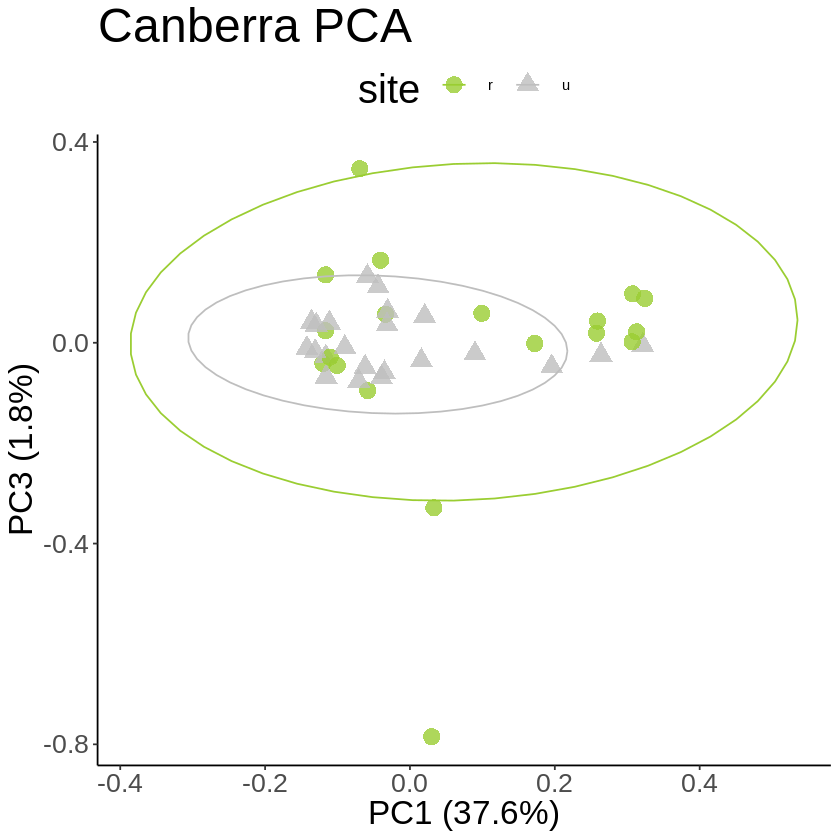

In [221]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Canberra PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (37.6%)') + ylab('PC3 (1.8%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Canberra_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Canberra_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Warning message:
“failed creating initial embedding; using random embedding instead”
Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”
Saving 6.67 x 6.67 in image

Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”


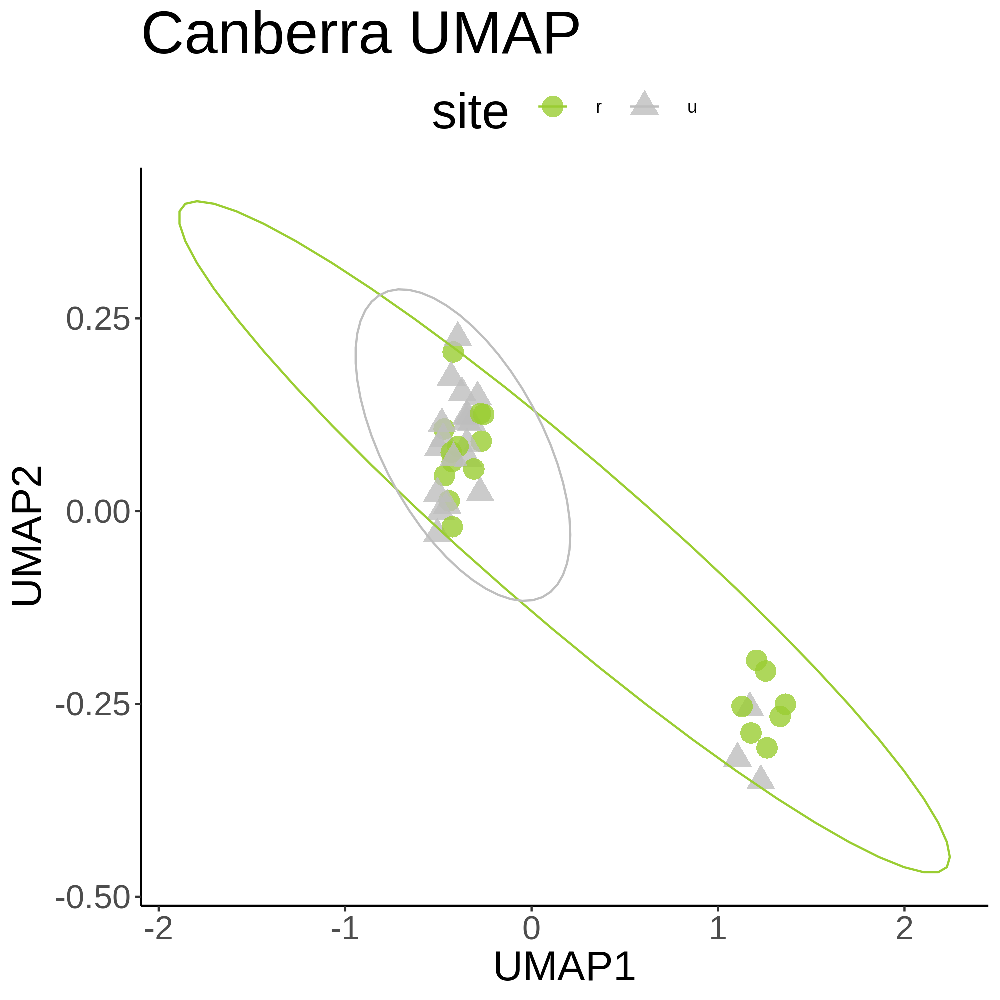

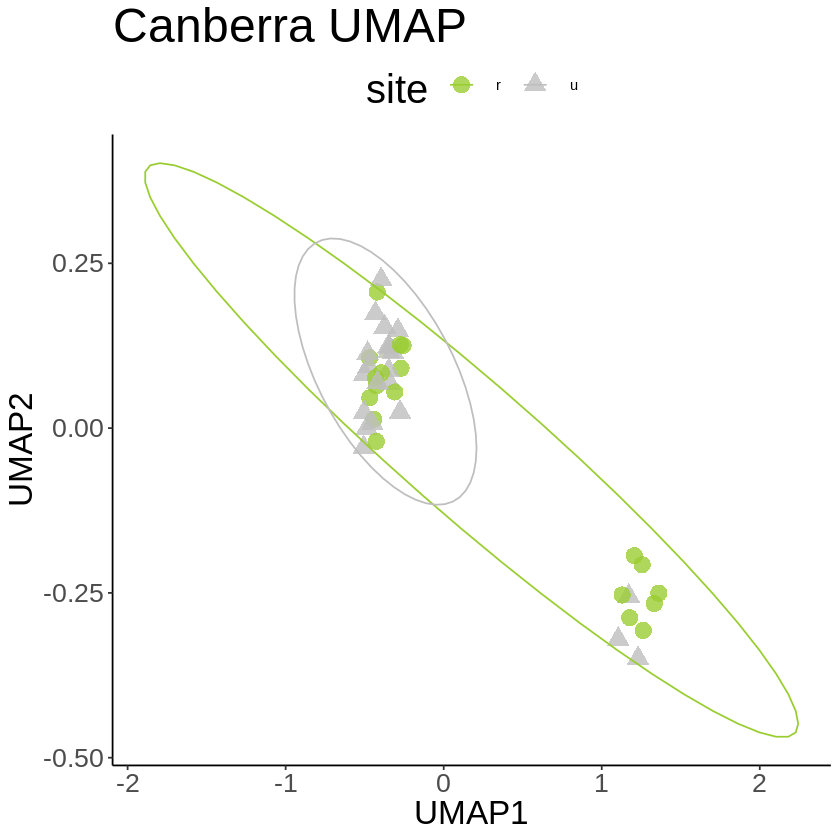

In [222]:
distMat <- as.matrix(dist(covMat))
Canberra_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Canberra_umap_layout <- Canberra_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Canberra_order_detail)
    
umap_plot <- Canberra_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Canberra UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Canberra_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Canberra_UMAP.png"
display_png(file=path_to_kplot)

## Cape Town

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4905389,0.1372419,0.13097104,0.12490445,0.12035582,0.11821838,0.11772020,0.11546038
Proportion of Variance,0.2092873,0.0163821,0.01491923,0.01356912,0.01259883,0.01215531,0.01205307,0.01159476
Cumulative Proportion,0.2092873,0.2256694,0.24058859,0.25415771,0.26675654,0.27891185,0.29096492,0.30255968


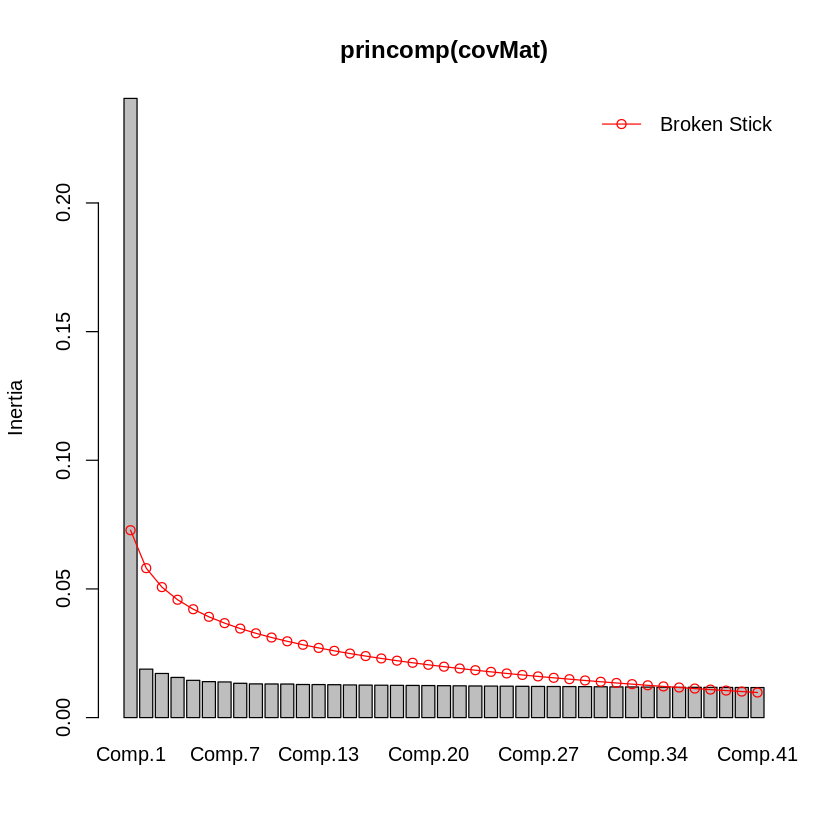

In [223]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Cape_Town/Cape_Town_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Cape_Town_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



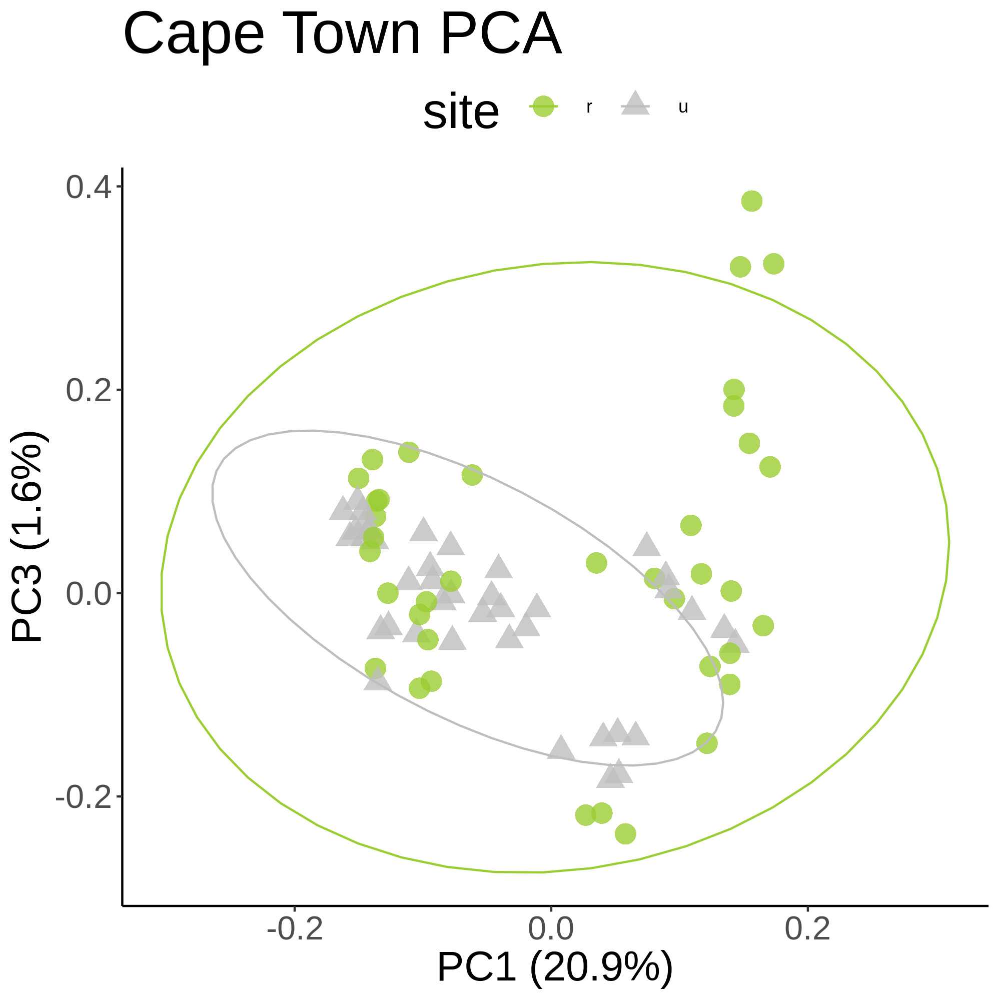

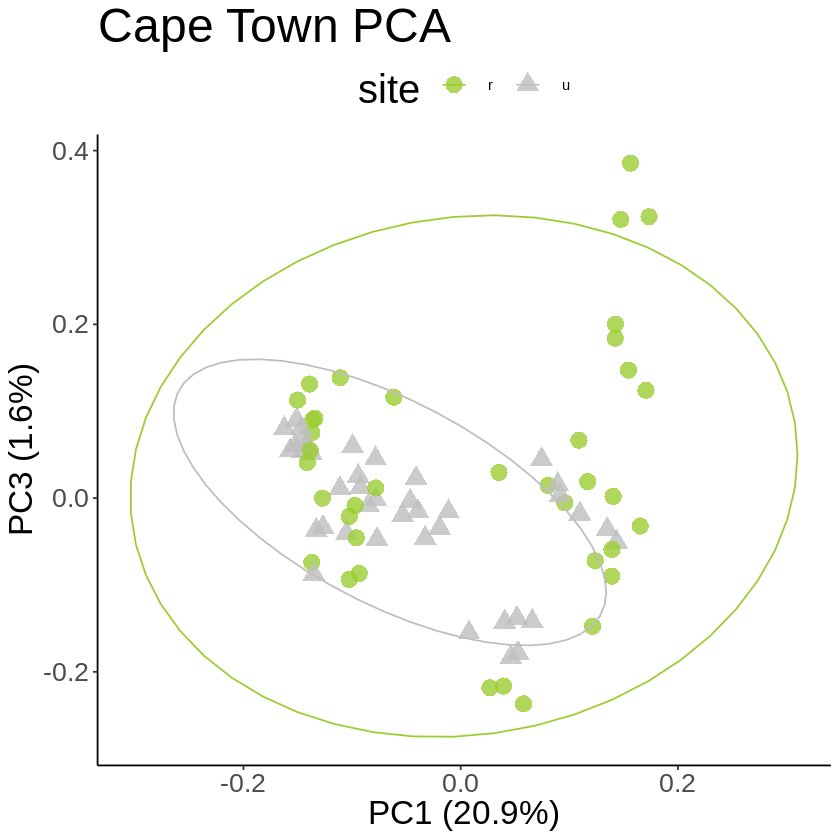

In [224]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Cape Town PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (20.9%)') + ylab('PC3 (1.6%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Cape_Town_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Cape_Town_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Saving 6.67 x 6.67 in image



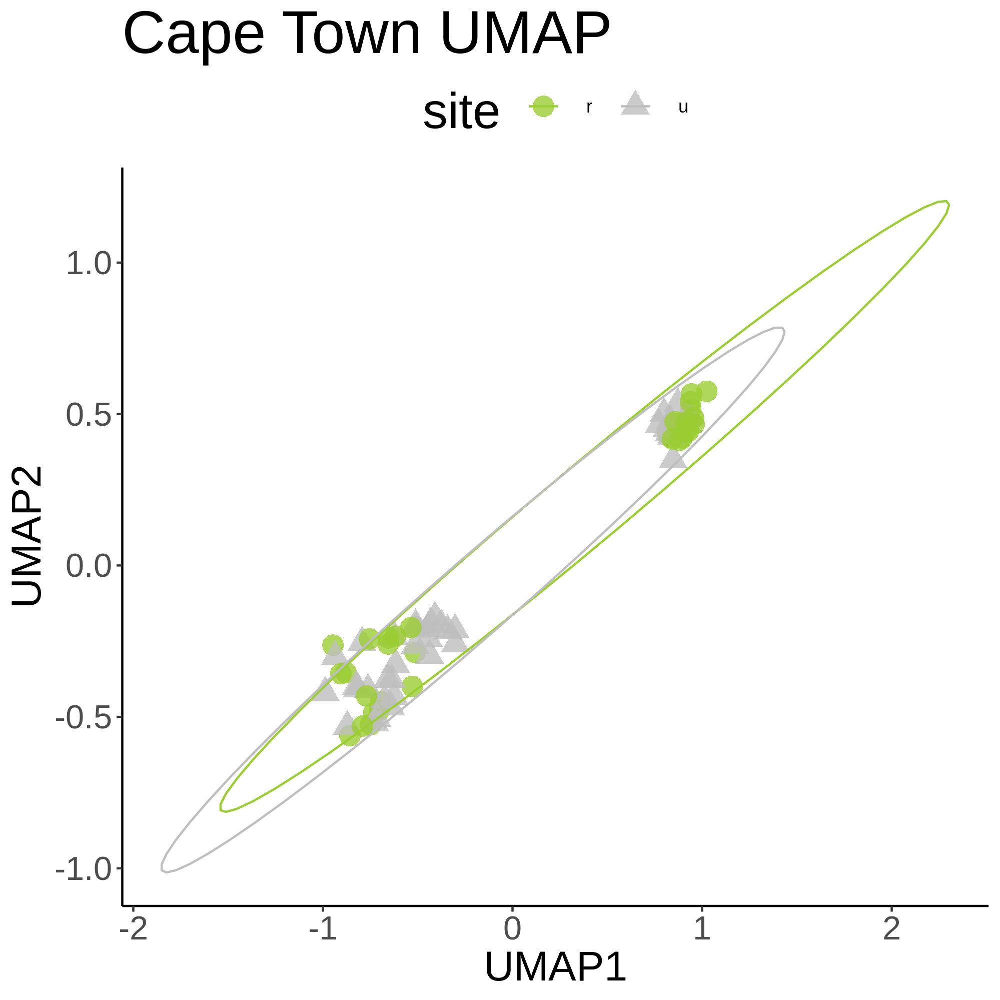

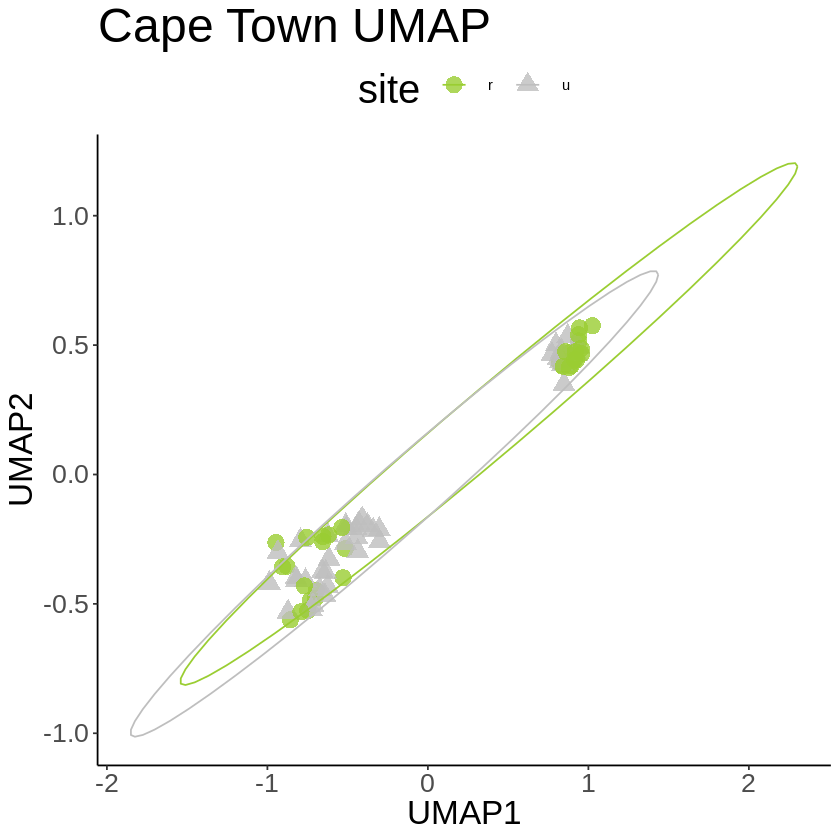

In [225]:
distMat <- as.matrix(dist(covMat))
Cape_Town_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Cape_Town_umap_layout <- Cape_Town_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Cape_Town_order_detail)
    
umap_plot <- Cape_Town_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Cape Town UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Cape_Town_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Cape_Town_UMAP.png"
display_png(file=path_to_kplot)

## Christchurch

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.3657587,0.11825739,0.11630711,0.11346920,0.11263699,0.11161390,0.11116745,0.11087583
Proportion of Variance,0.1216897,0.01272099,0.01230487,0.01171171,0.01154055,0.01133186,0.01124138,0.01118248
Cumulative Proportion,0.1216897,0.13441067,0.14671554,0.15842725,0.16996780,0.18129965,0.19254104,0.20372352


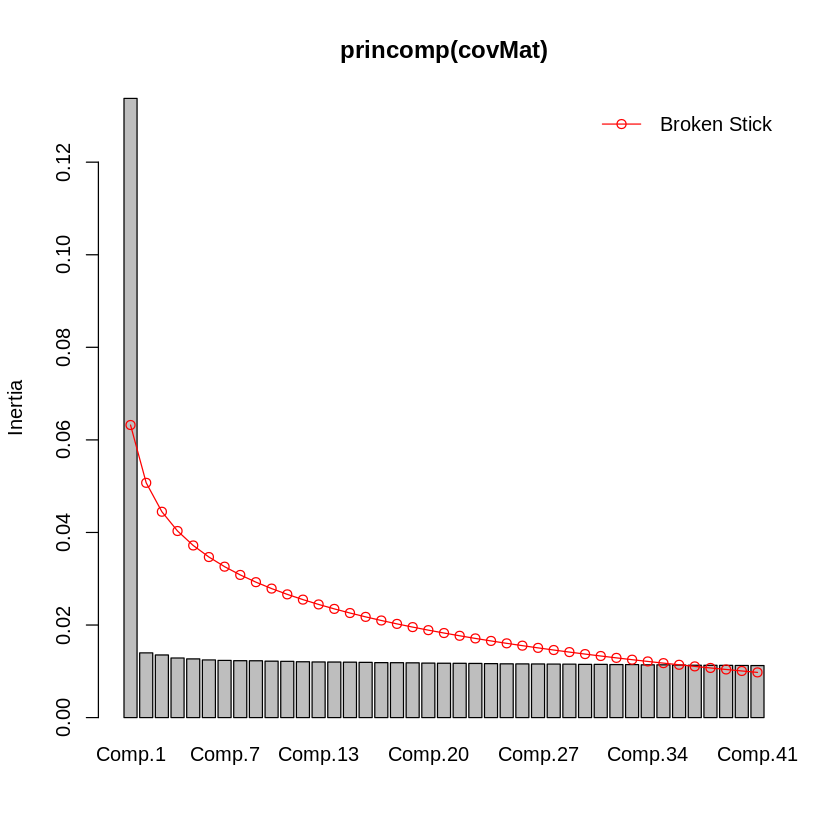

In [226]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Christchurch/Christchurch_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Christchurch_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



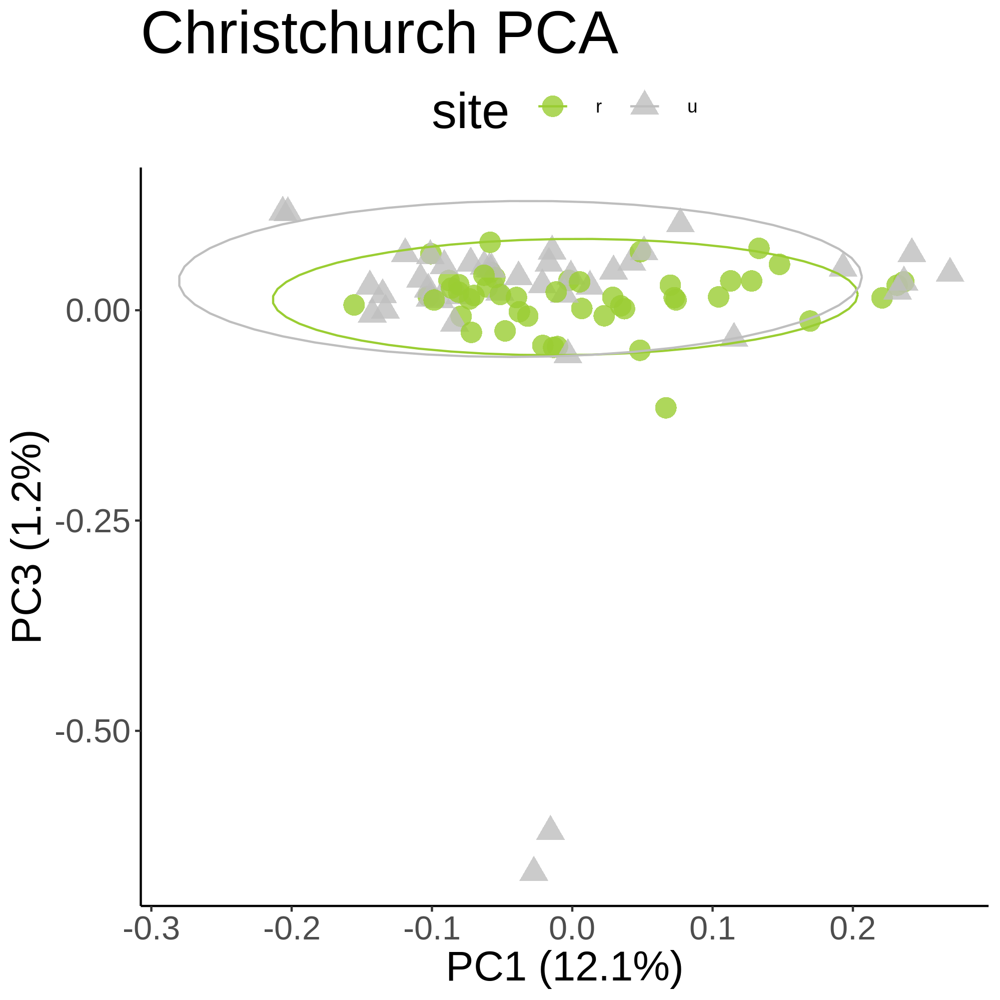

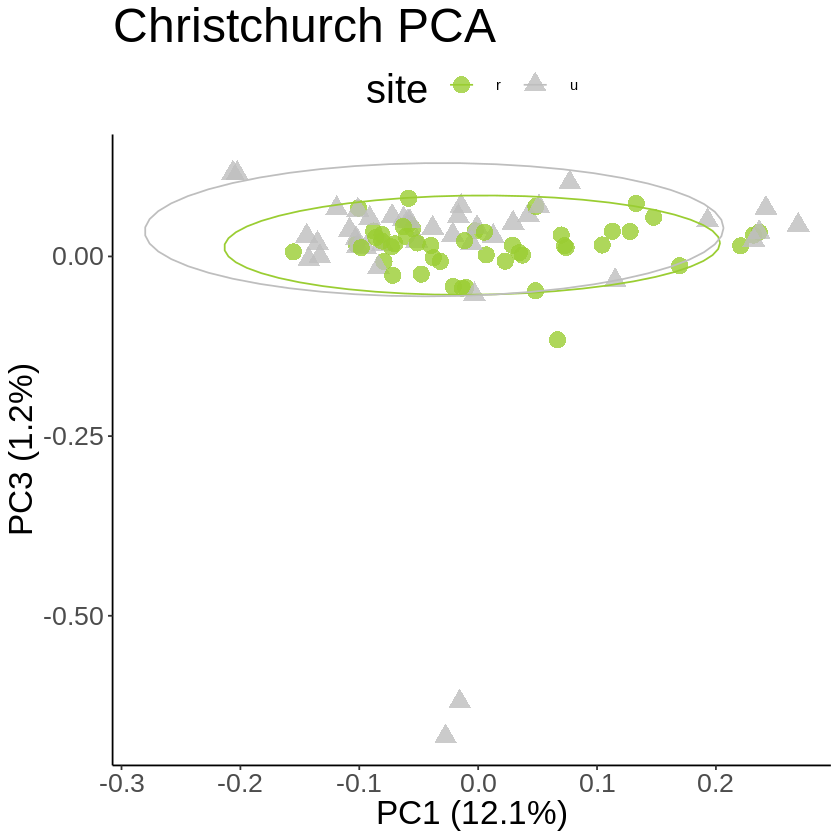

In [227]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Christchurch PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (12.1%)') + ylab('PC3 (1.2%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Christchurch_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Christchurch_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Saving 6.67 x 6.67 in image



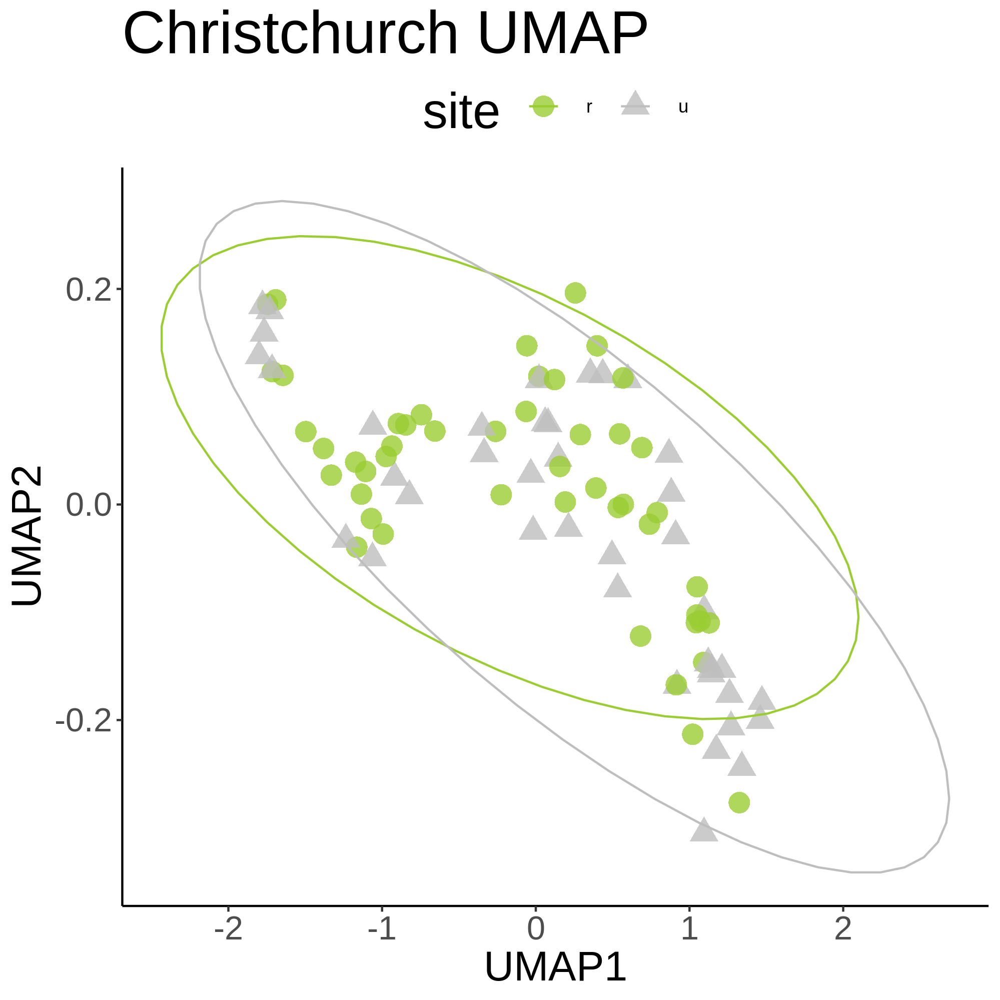

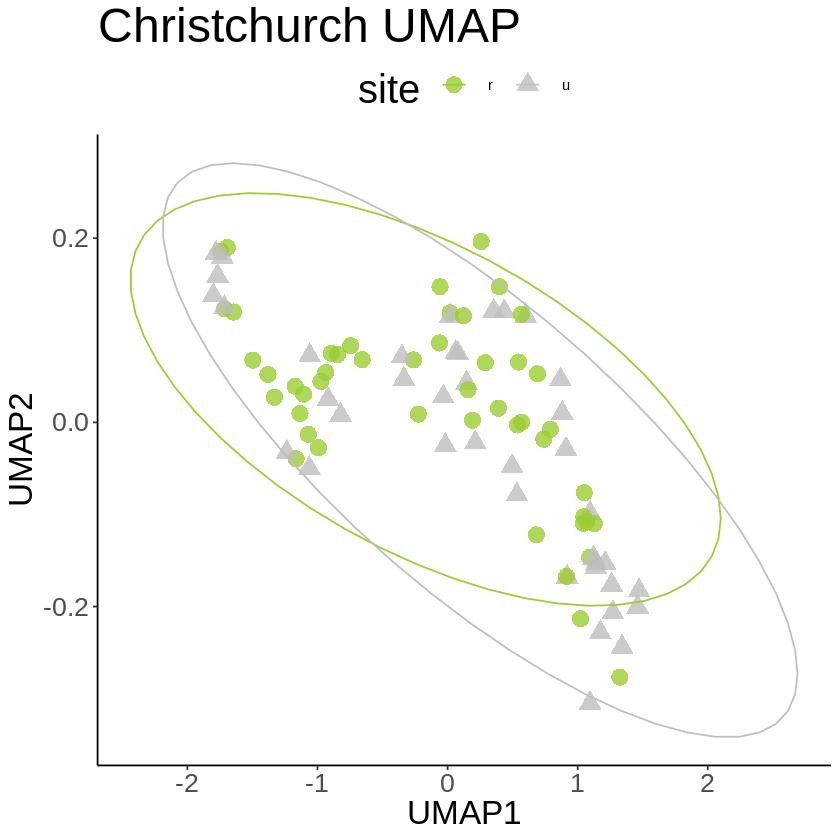

In [228]:
distMat <- as.matrix(dist(covMat))
Christchurch_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Christchurch_umap_layout <- Christchurch_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Christchurch_order_detail)
    
umap_plot <- Christchurch_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Christchurch UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Christchurch_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Christchurch_UMAP.png"
display_png(file=path_to_kplot)

## Hiroshima

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.7848568,0.21592946,0.2139483,0.21196571,0.2071458,0.20580241,0.20413018,0.20366636
Proportion of Variance,0.3935998,0.02979187,0.0292477,0.02870815,0.0274174,0.02706293,0.02662492,0.02650407
Cumulative Proportion,0.3935998,0.42339164,0.4526393,0.48134748,0.5087649,0.53582781,0.56245274,0.58895681


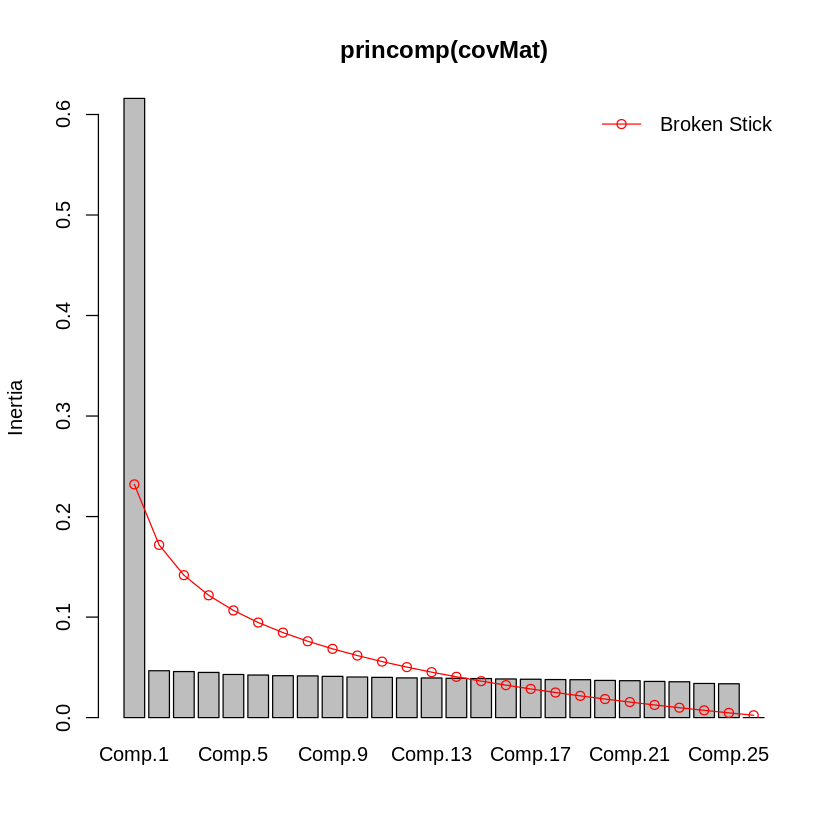

In [229]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Hiroshima/Hiroshima_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Hiroshima_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



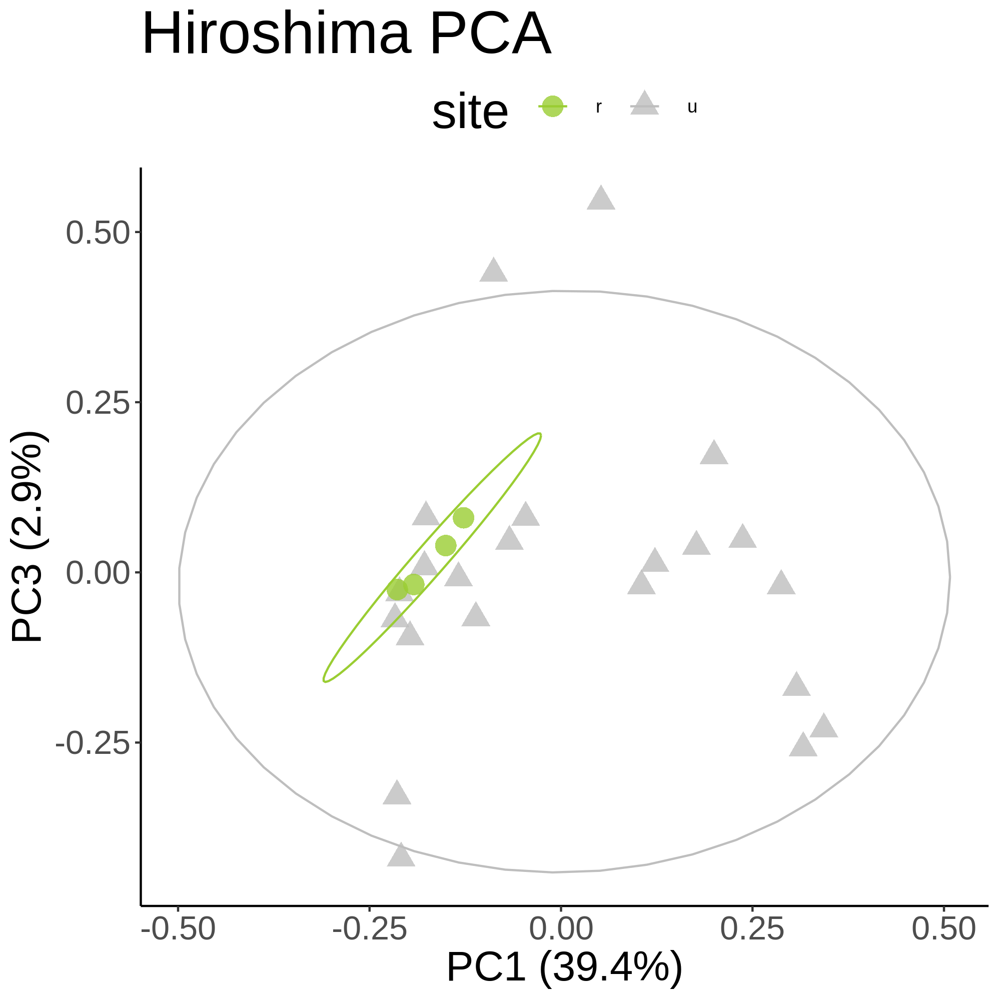

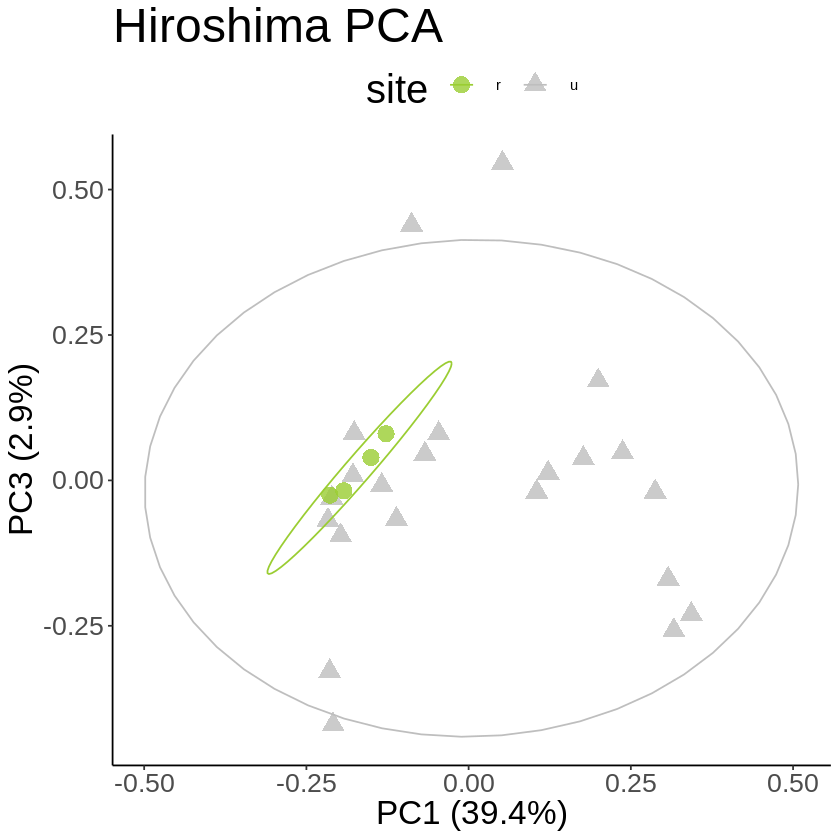

In [230]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Hiroshima PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (39.4%)') + ylab('PC3 (2.9%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Hiroshima_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Hiroshima_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Warning message:
“failed creating initial embedding; using random embedding instead”
Saving 6.67 x 6.67 in image



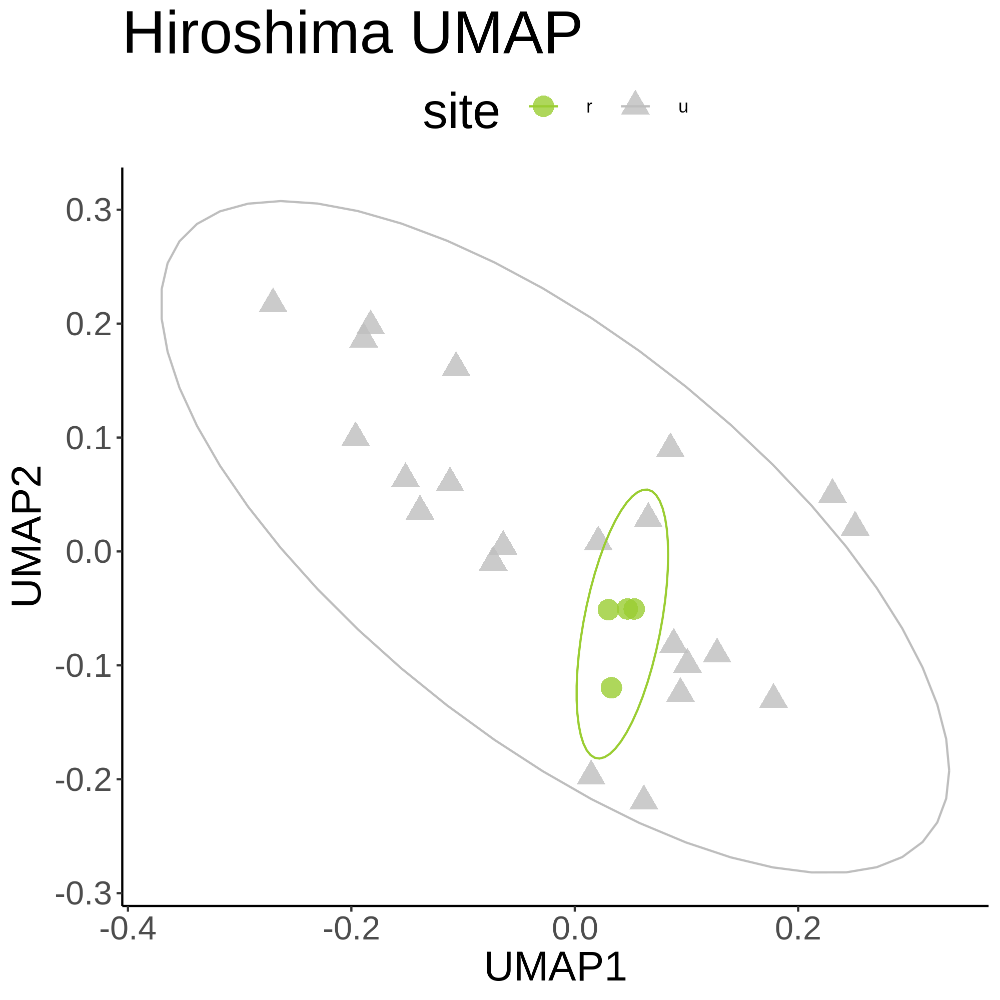

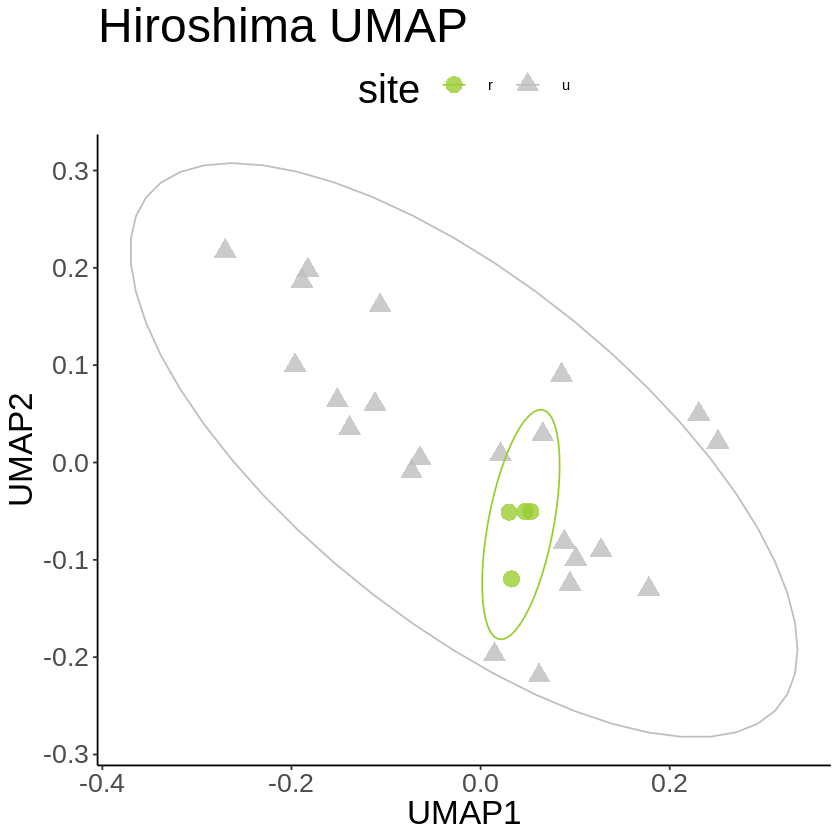

In [231]:
distMat <- as.matrix(dist(covMat))
Hiroshima_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Hiroshima_umap_layout <- Hiroshima_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Hiroshima_order_detail)
    
umap_plot <- Hiroshima_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Hiroshima UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Hiroshima_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Hiroshima_UMAP.png"
display_png(file=path_to_kplot)

## Kunming

### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.5034519,0.15503371,0.14934560,0.14422516,0.14276796,0.1418551,0.13756872,0.1357393
Proportion of Variance,0.2180460,0.02067685,0.01918744,0.01789428,0.01753451,0.0173110,0.01628064,0.0158505
Cumulative Proportion,0.2180460,0.23872282,0.25791026,0.27580454,0.29333905,0.3106501,0.32693070,0.3427812


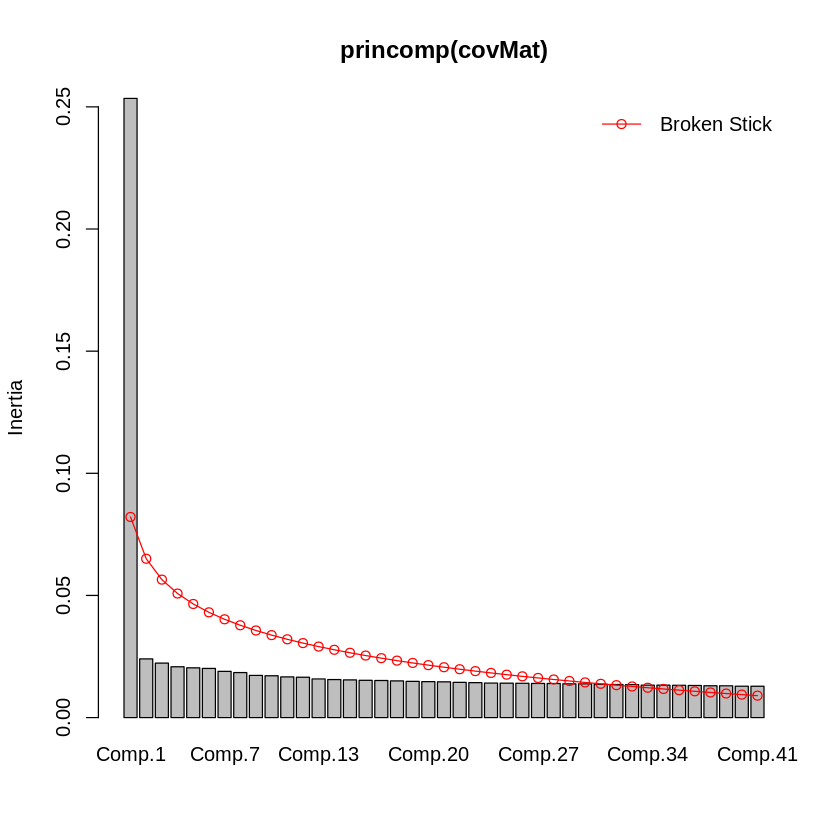

In [232]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Kunming/Kunming_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Kunming_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



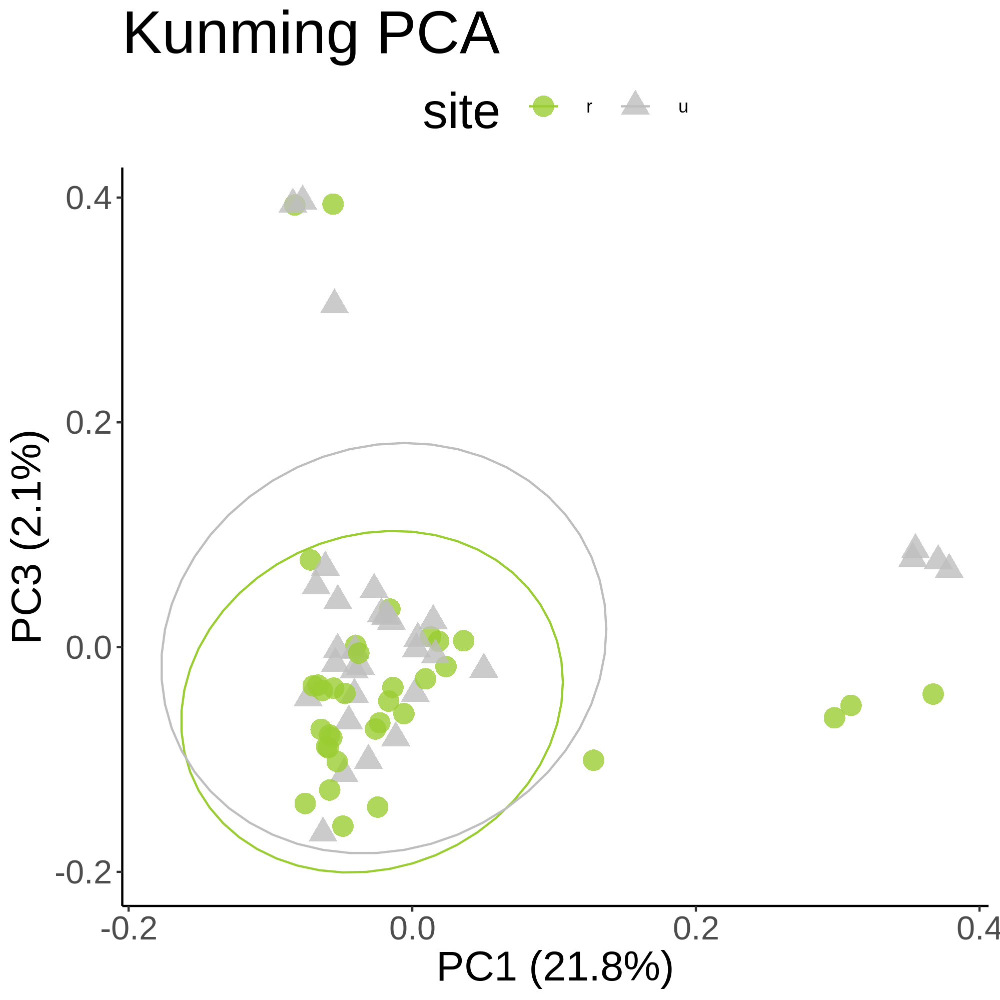

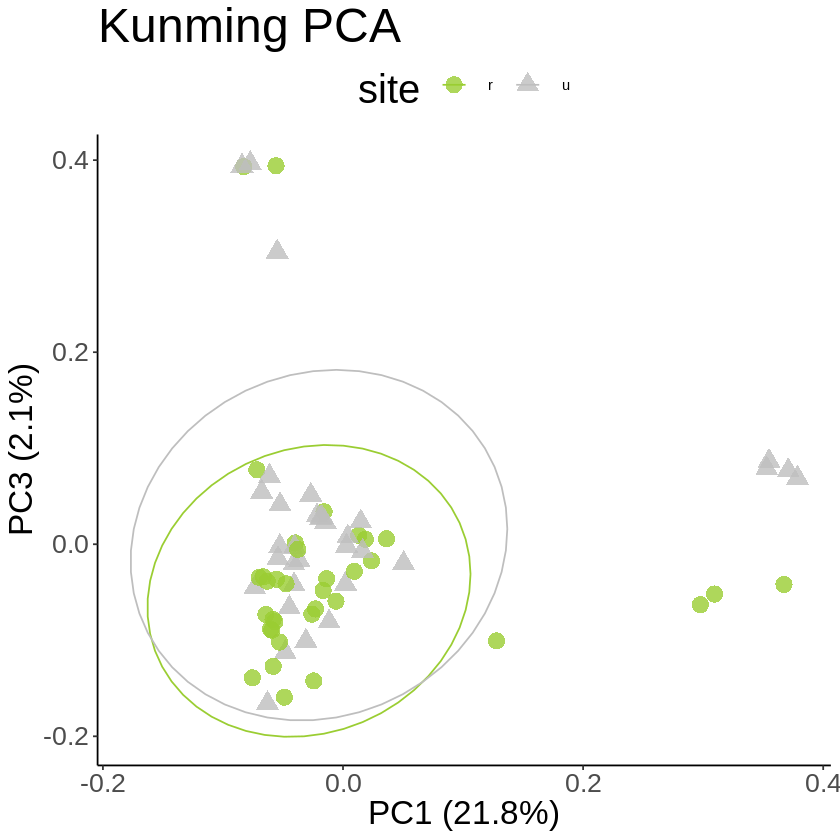

In [233]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Kunming PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (21.8%)') + ylab('PC3 (2.1%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Kunming_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Kunming_PCA.png"
display_png(file=path_to_kplot)

In [234]:
### UMAP

Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”
Saving 6.67 x 6.67 in image

Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”


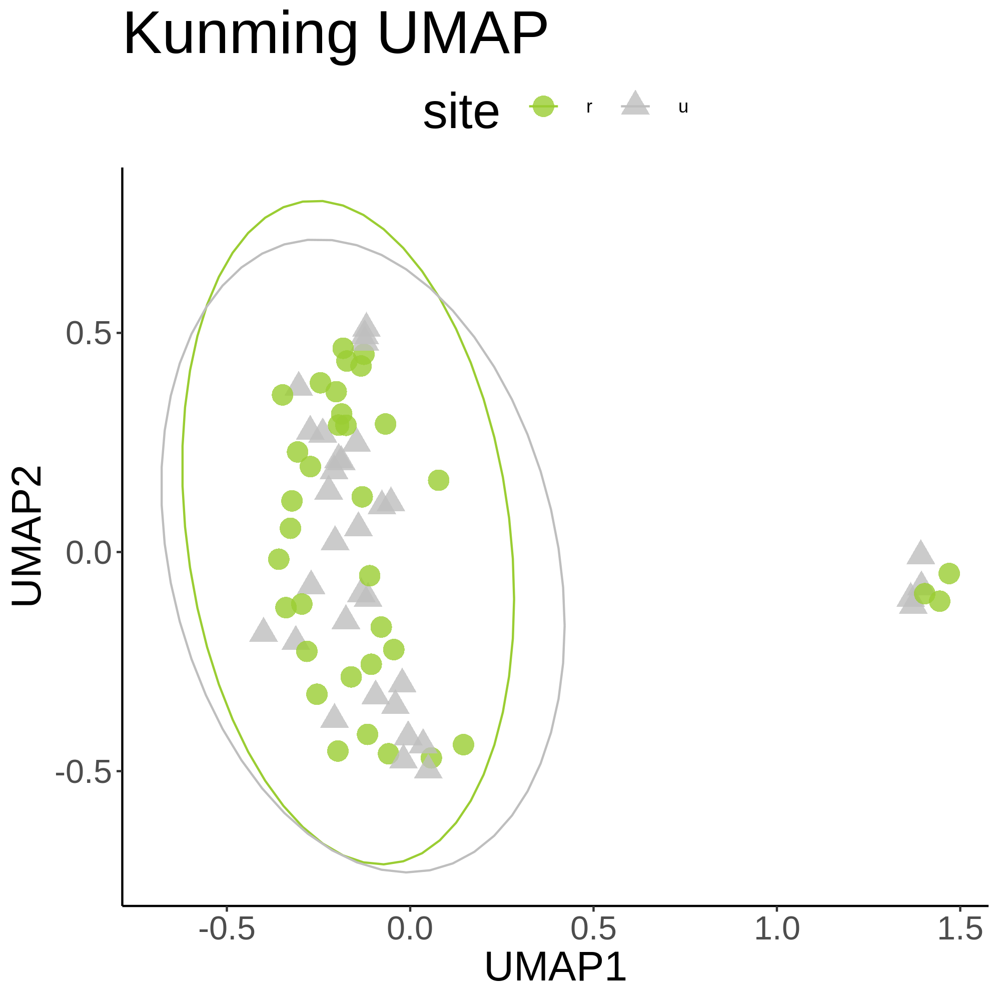

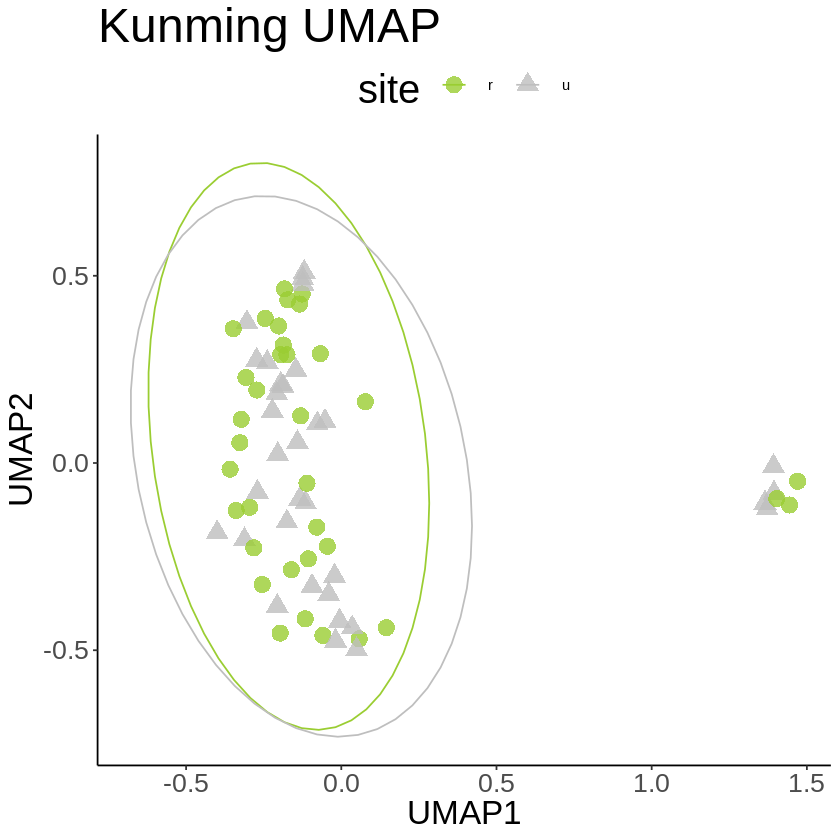

In [235]:
distMat <- as.matrix(dist(covMat))
Kunming_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Kunming_umap_layout <- Kunming_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Kunming_order_detail)
    
umap_plot <- Kunming_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Kunming UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot

ggsave(
  "Kunming_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Kunming_UMAP.png"
display_png(file=path_to_kplot)

In [236]:
## Kyoto

In [237]:
### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.9236316,0.28117794,0.27141509,0.26851835,0.26733420,0.26342990,0.26129620,0.2586626
Proportion of Variance,0.5153545,0.04776074,0.04450169,0.04355685,0.04317354,0.04192168,0.04124533,0.0404181
Cumulative Proportion,0.5153545,0.56311527,0.60761696,0.65117381,0.69434735,0.73626903,0.77751436,0.8179325


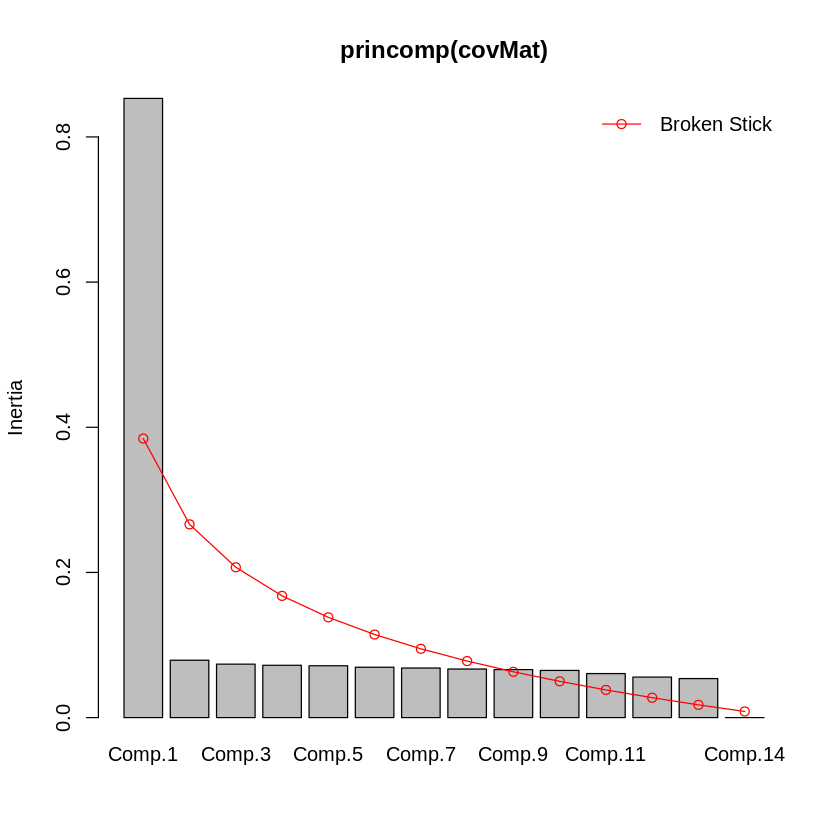

In [238]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Kyoto/Kyoto_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Kyoto_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”
Saving 6.67 x 6.67 in image

Warning message in MASS::cov.trob(data[, vars]):
“Probable convergence failure”


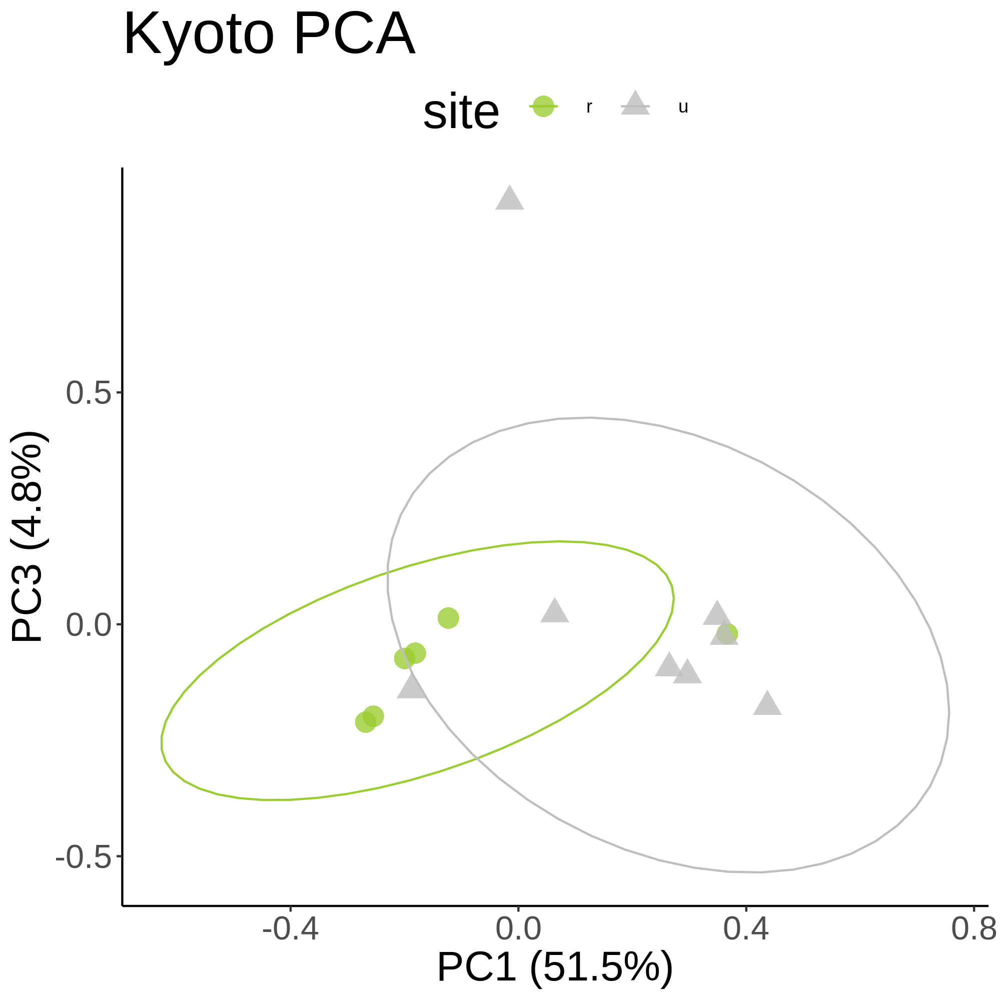

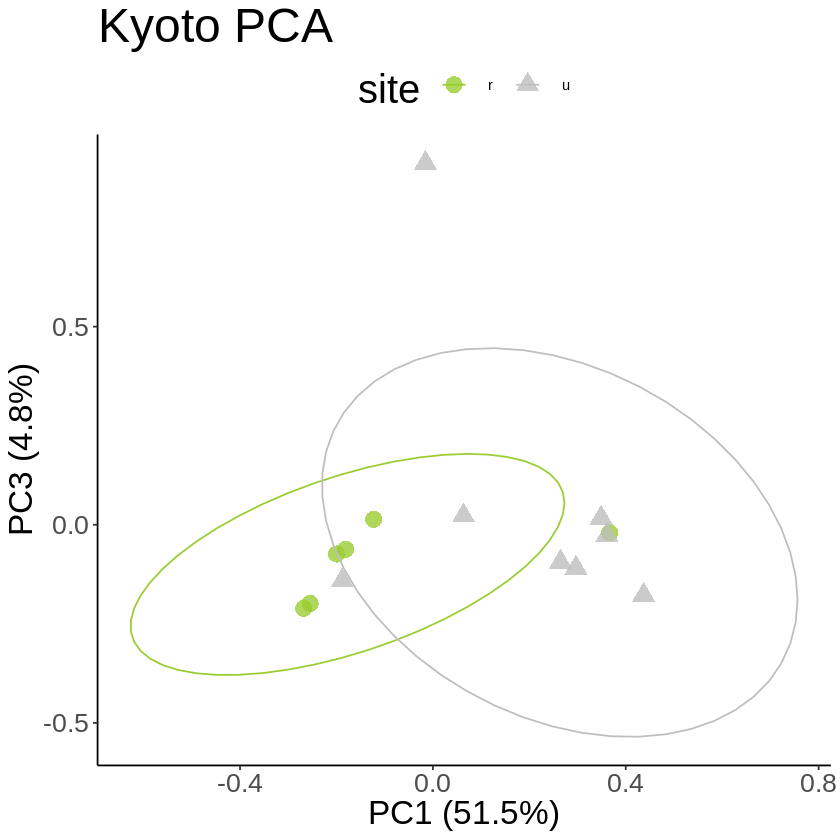

In [239]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Kyoto PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (51.5%)') + ylab('PC3 (4.8%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Kyoto_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Kyoto_PCA.png"
display_png(file=path_to_kplot)

In [240]:
### UMAP

Warning message:
“failed creating initial embedding; using random embedding instead”
Saving 6.67 x 6.67 in image



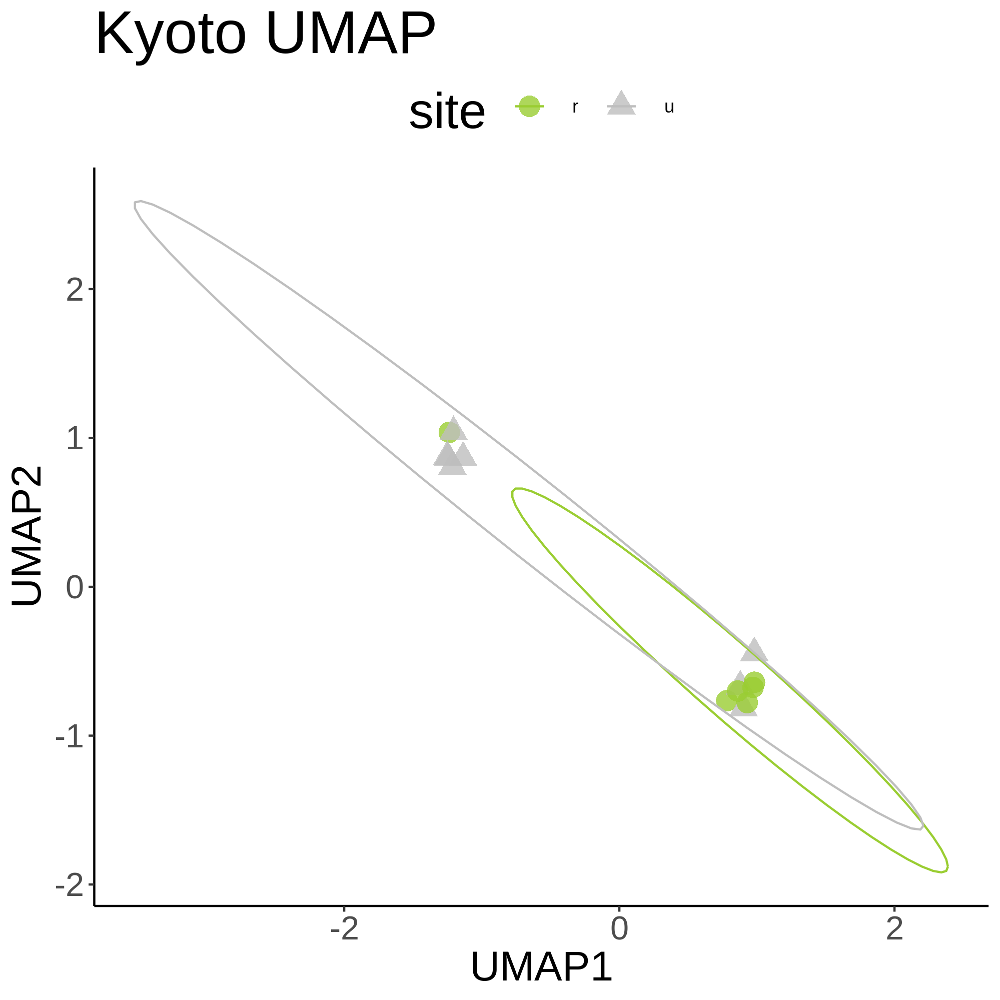

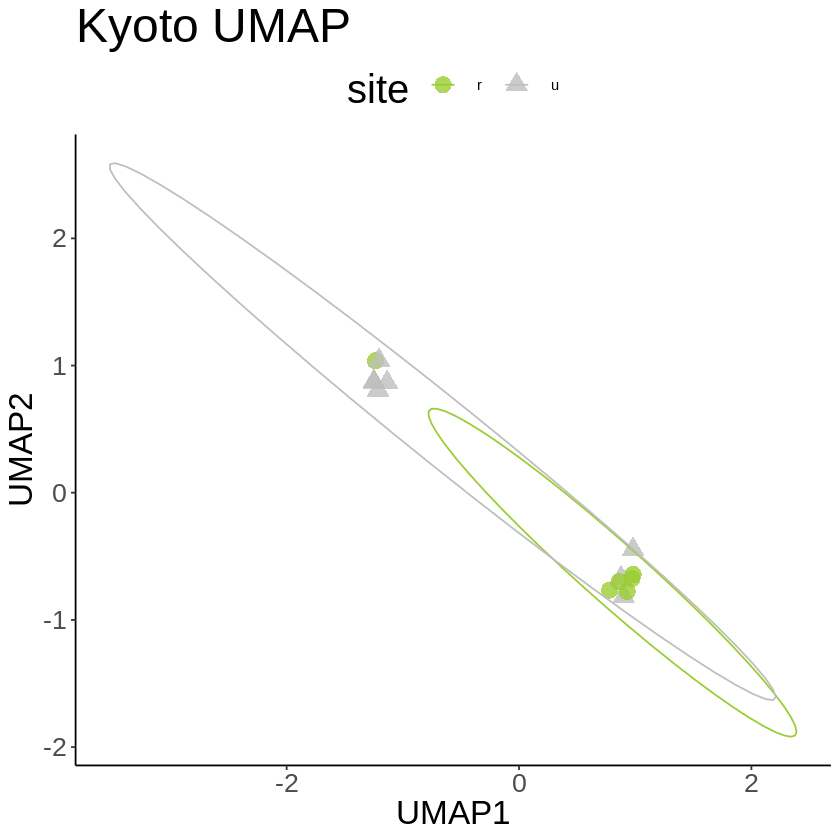

In [241]:
distMat <- as.matrix(dist(covMat))
Kyoto_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors =14, min_dist = 0.1, n_components = 40)
Kyoto_umap_layout <- Kyoto_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Kyoto_order_detail)
    
umap_plot <- Kyoto_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Kyoto UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot

ggsave(
  "Kyoto_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Kyoto_UMAP.png"
display_png(file=path_to_kplot)

In [242]:
## Landshut

In [243]:
### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4036267,0.12612712,0.12335495,0.12216364,0.11982396,0.11708905,0.11652723,0.11502058
Proportion of Variance,0.1467604,0.01433066,0.01370763,0.01344414,0.01293411,0.01235042,0.01223218,0.01191791
Cumulative Proportion,0.1467604,0.16109106,0.17479869,0.18824283,0.20117694,0.21352735,0.22575953,0.23767745


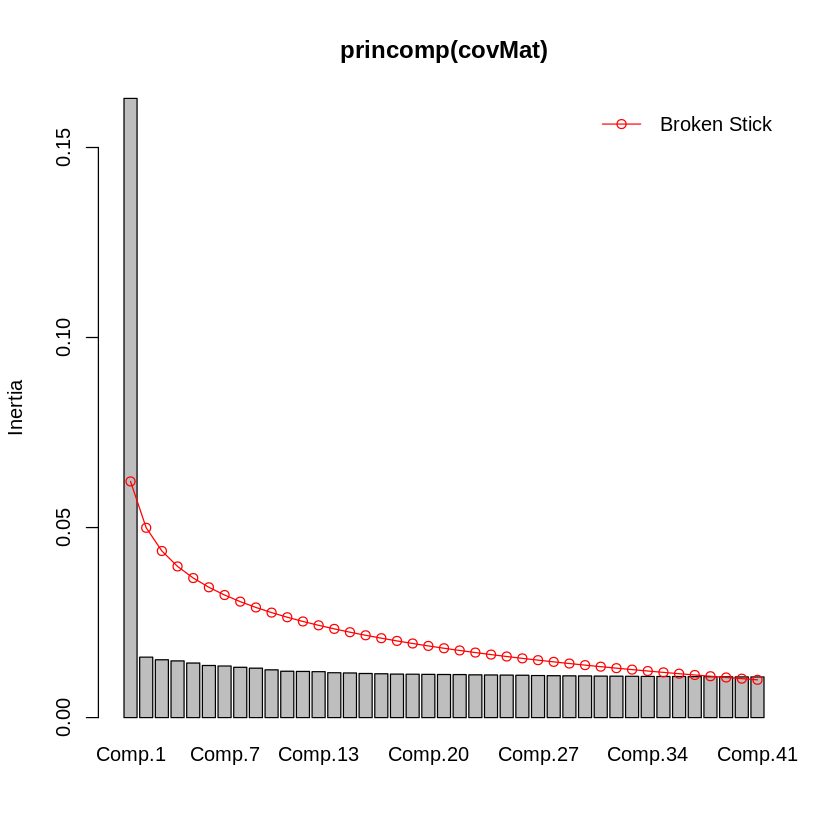

In [244]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Landshut/Landshut_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Landshut_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



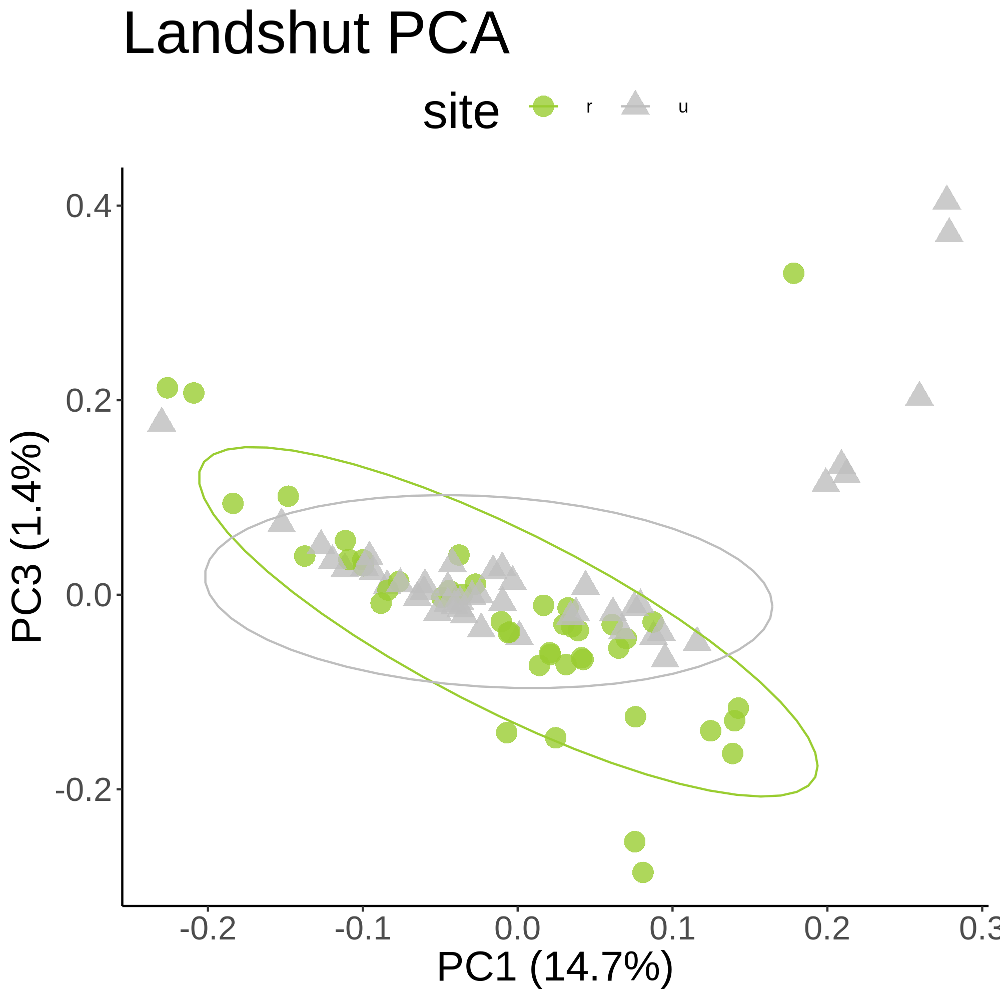

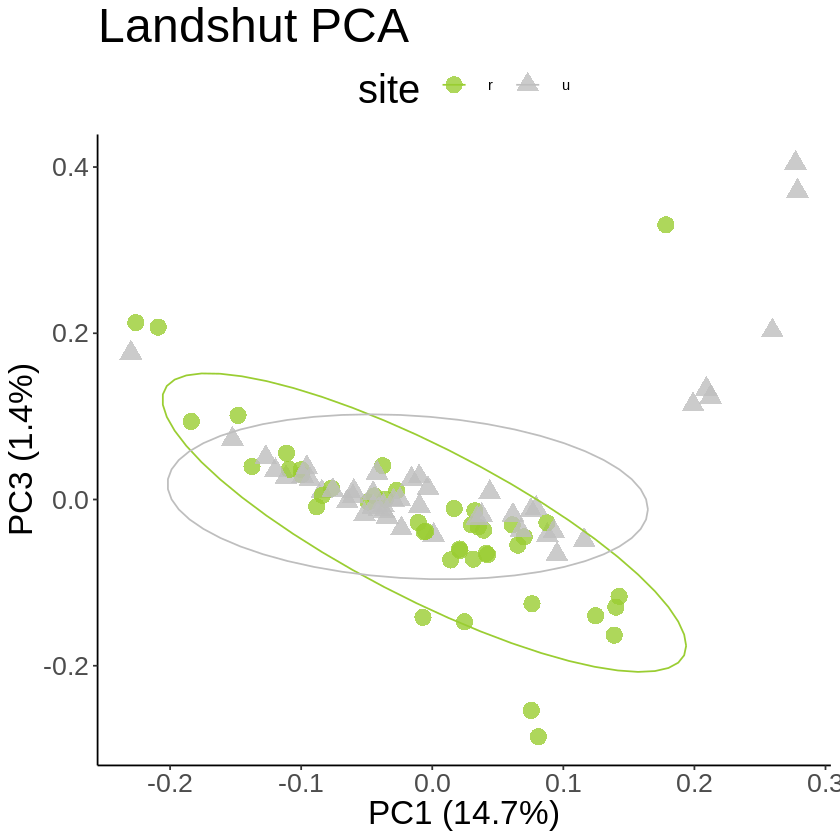

In [245]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Landshut PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (14.7%)') + ylab('PC3 (1.4%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Landshut_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Landshut_PCA.png"
display_png(file=path_to_kplot)

In [246]:
### UMAP

Saving 6.67 x 6.67 in image



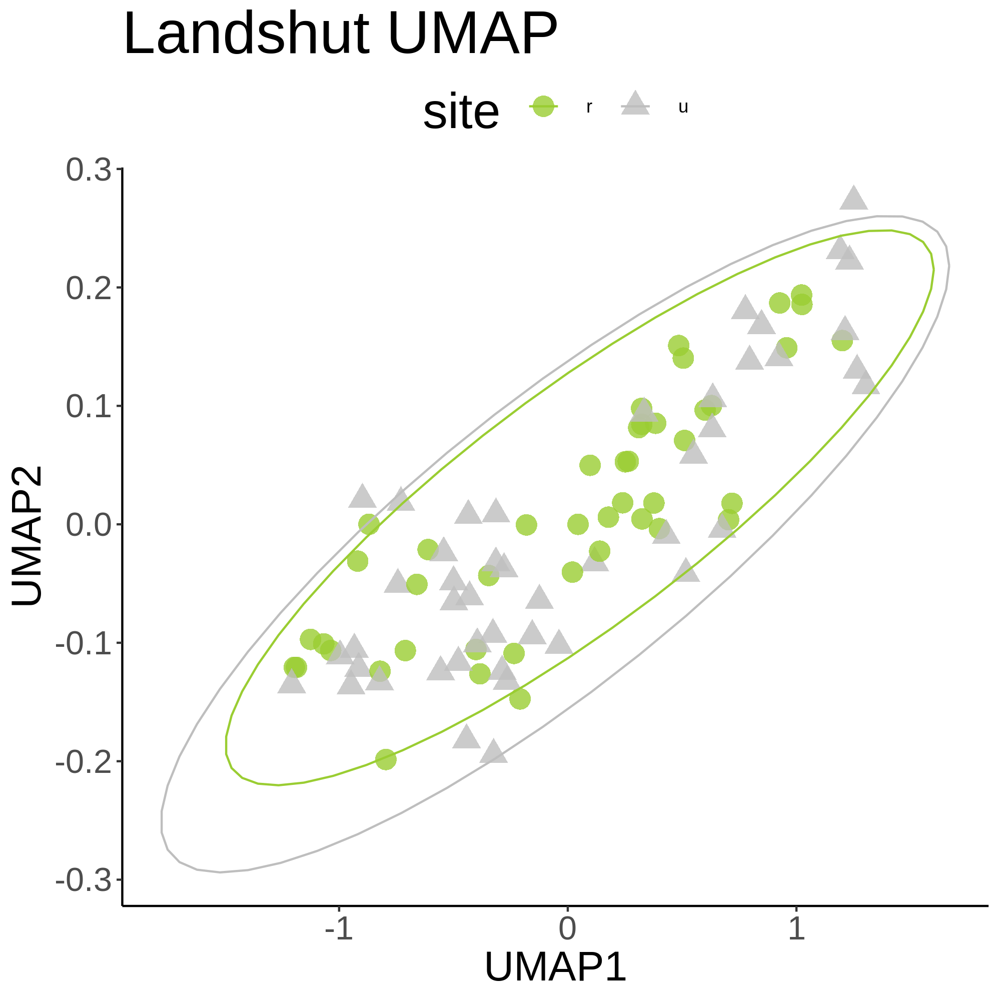

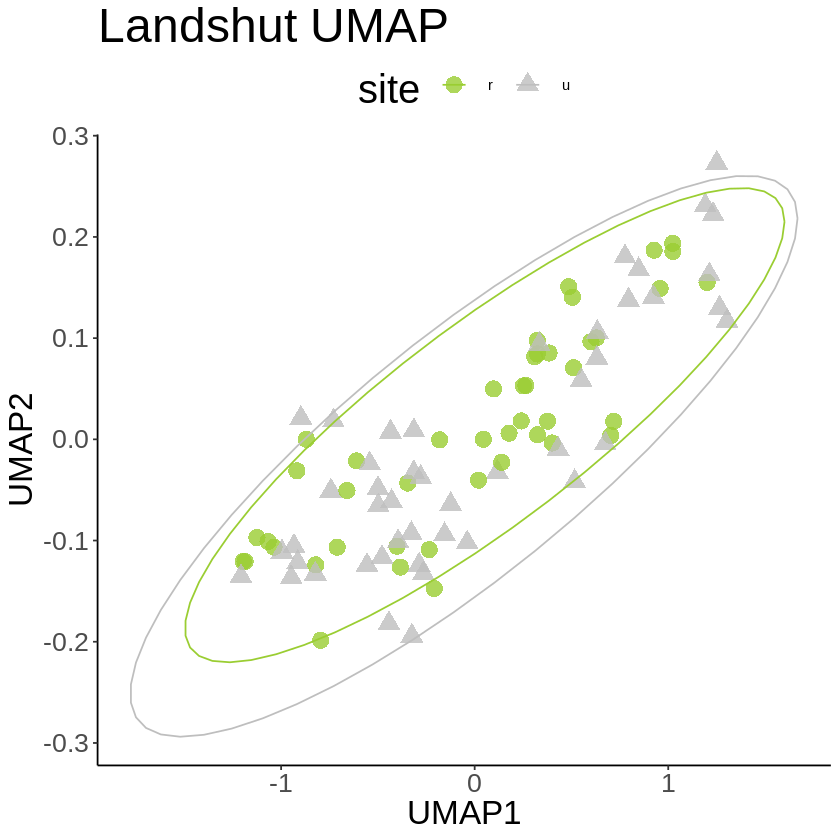

In [247]:
distMat <- as.matrix(dist(covMat))
Landshut_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Landshut_umap_layout <- Landshut_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Landshut_order_detail)
    
umap_plot <- Landshut_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Landshut UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot

ggsave(
  "Landshut_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Landshut_UMAP.png"
display_png(file=path_to_kplot)

In [248]:
## Linkoping

In [249]:
### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.3994325,0.13830277,0.12791055,0.12620496,0.12453836,0.12310661,0.12200207,0.12124534
Proportion of Variance,0.1434109,0.01719322,0.01470646,0.01431688,0.01394125,0.01362255,0.01337919,0.01321374
Cumulative Proportion,0.1434109,0.16060416,0.17531062,0.18962751,0.20356876,0.21719131,0.23057050,0.24378424


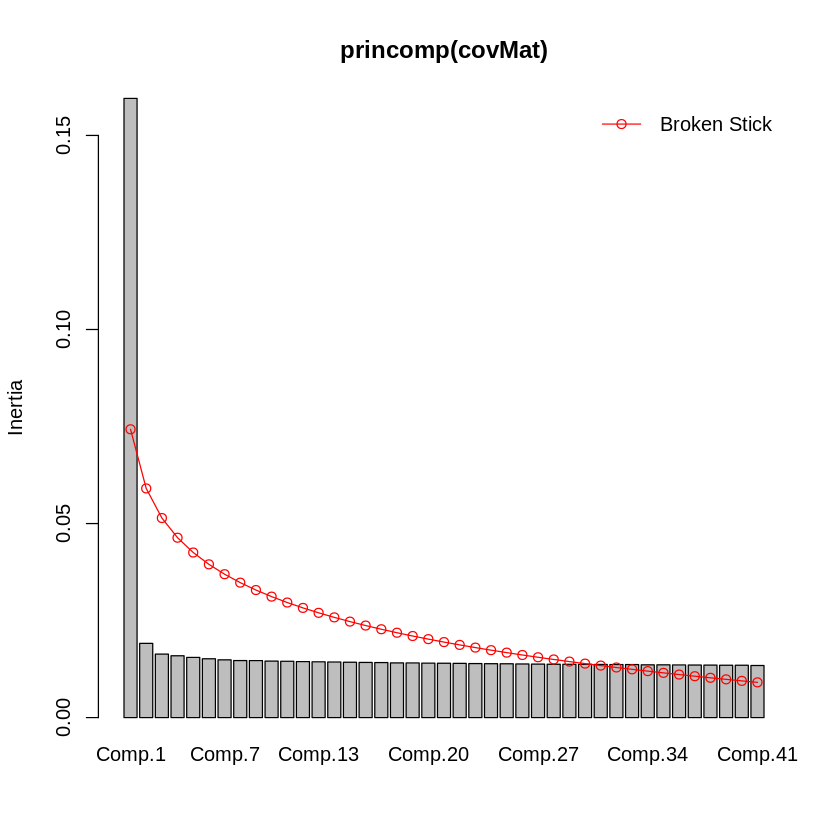

In [250]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Linkoping/Linkoping_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Linkoping_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



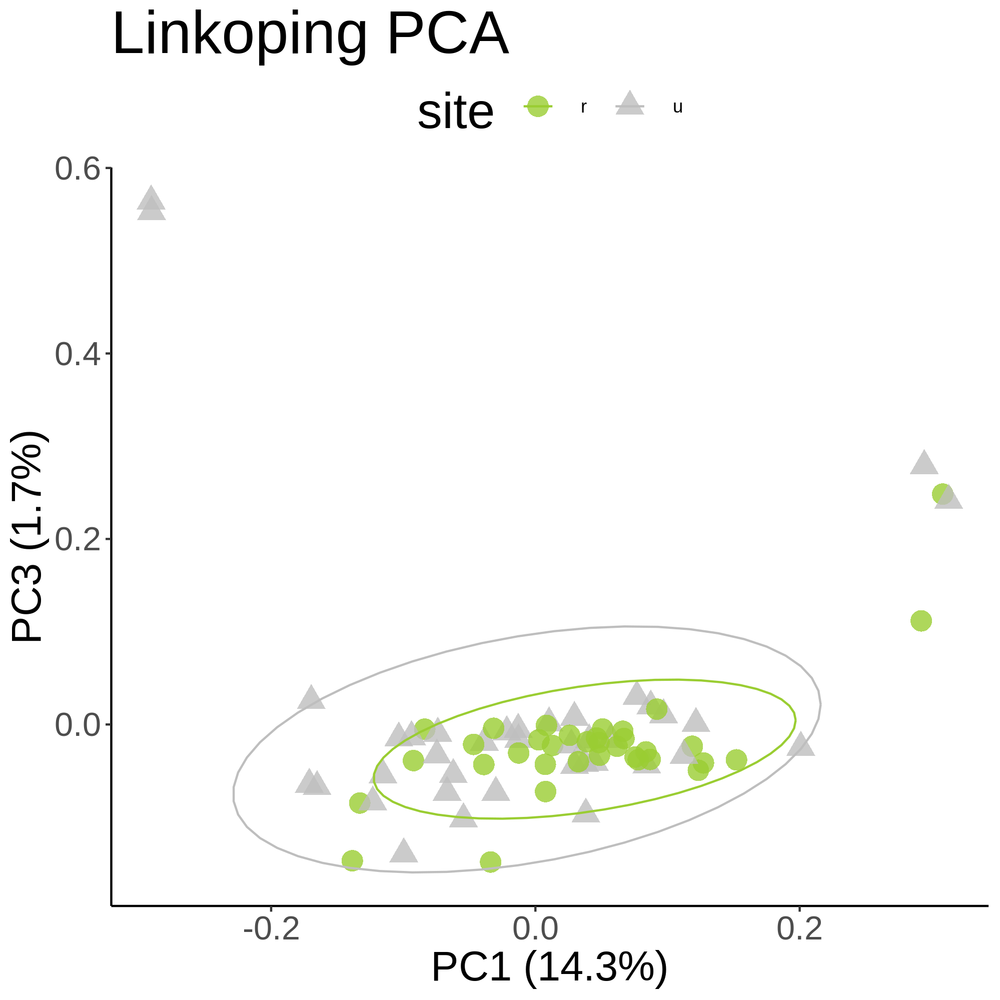

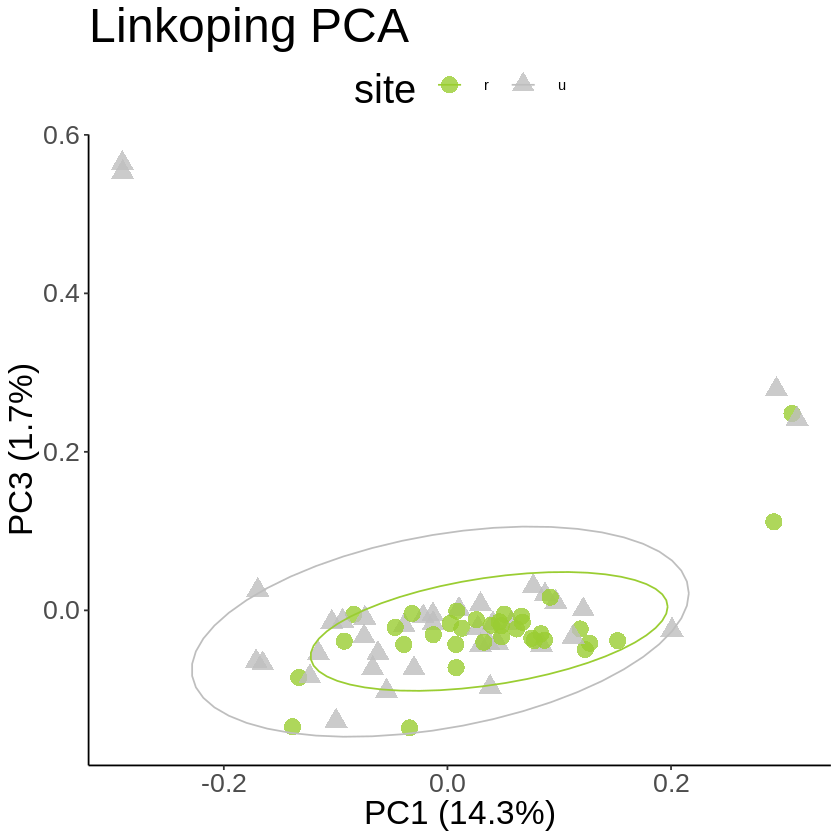

In [251]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Linkoping PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (14.3%)') + ylab('PC3 (1.7%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Linkoping_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Linkoping_PCA.png"
display_png(file=path_to_kplot)

In [252]:
### UMAP

Saving 6.67 x 6.67 in image



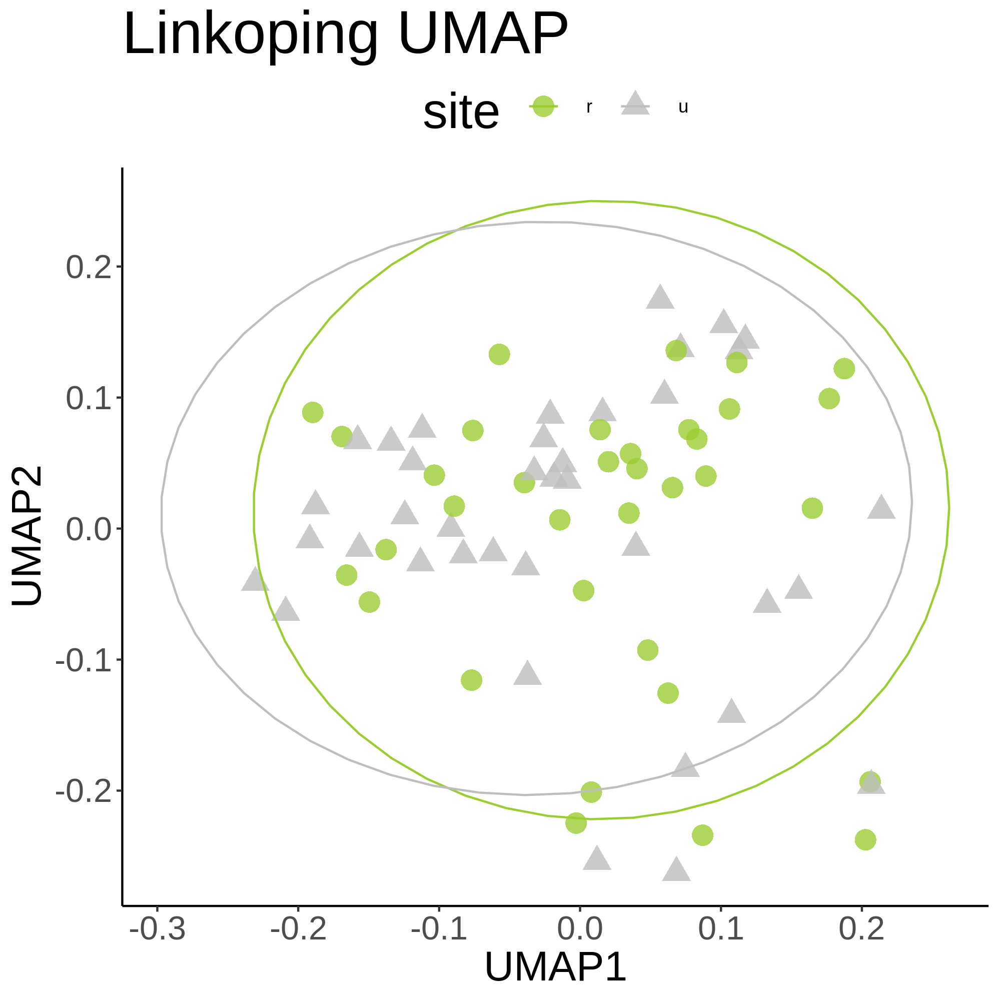

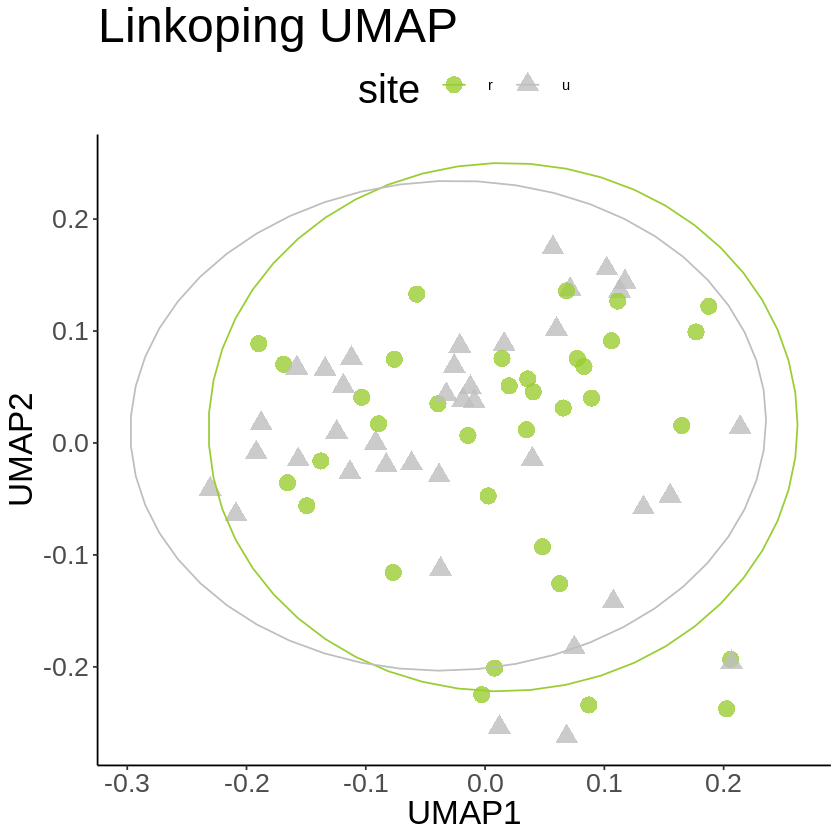

In [253]:
distMat <- as.matrix(dist(covMat))
Linkoping_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Linkoping_umap_layout <- Linkoping_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Linkoping_order_detail)
    
umap_plot <- Linkoping_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Linkoping UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Linkoping_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Linkoping_UMAP.png"
display_png(file=path_to_kplot)

In [254]:
## Loja

In [255]:
### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4499007,0.15102720,0.14604346,0.14441172,0.14196933,0.14087282,0.14015495,0.13859235
Proportion of Variance,0.1805337,0.02034395,0.01902344,0.01860072,0.01797686,0.01770024,0.01752031,0.01713182
Cumulative Proportion,0.1805337,0.20087764,0.21990108,0.23850180,0.25647867,0.27417891,0.29169922,0.30883103


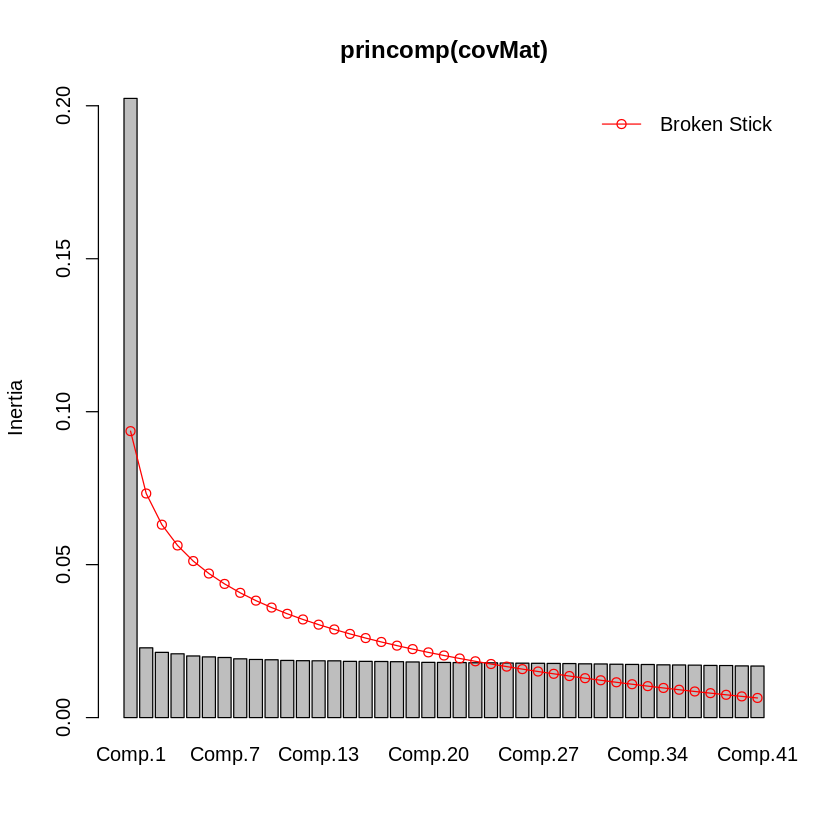

In [256]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Loja/Loja_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Loja_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



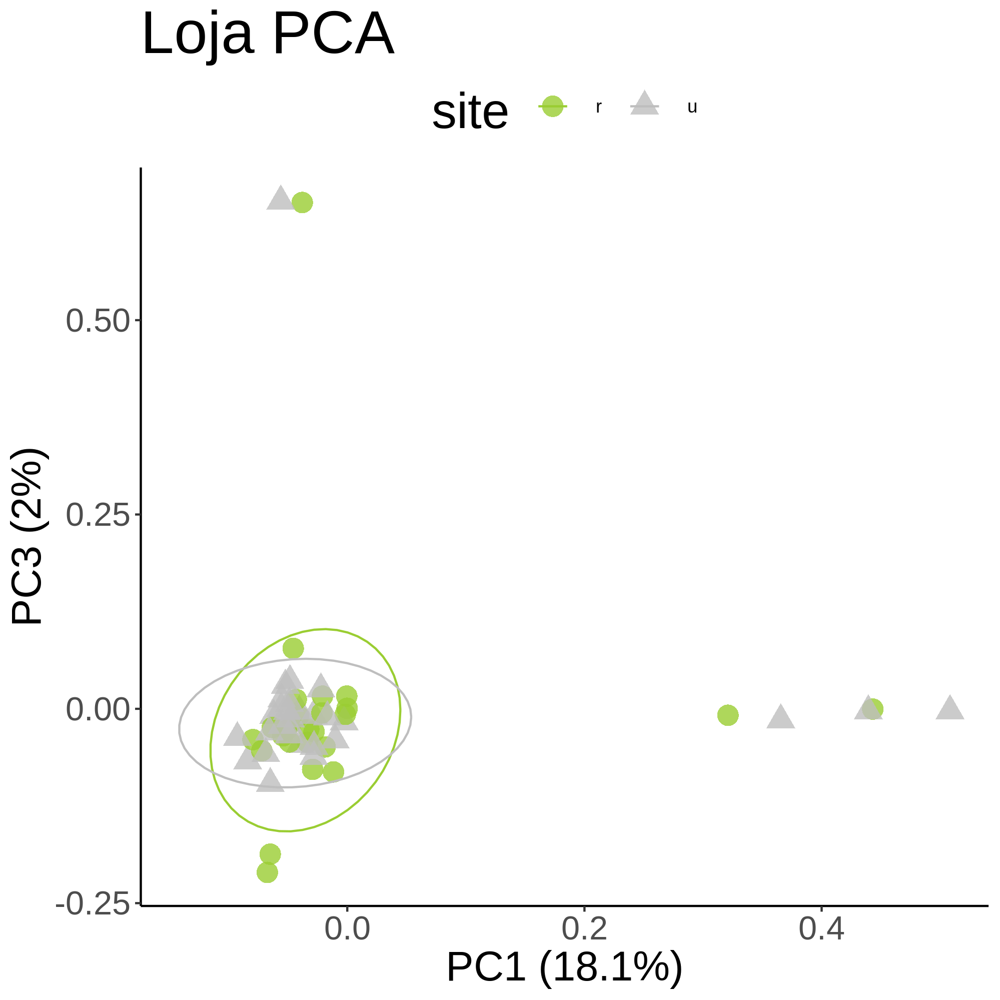

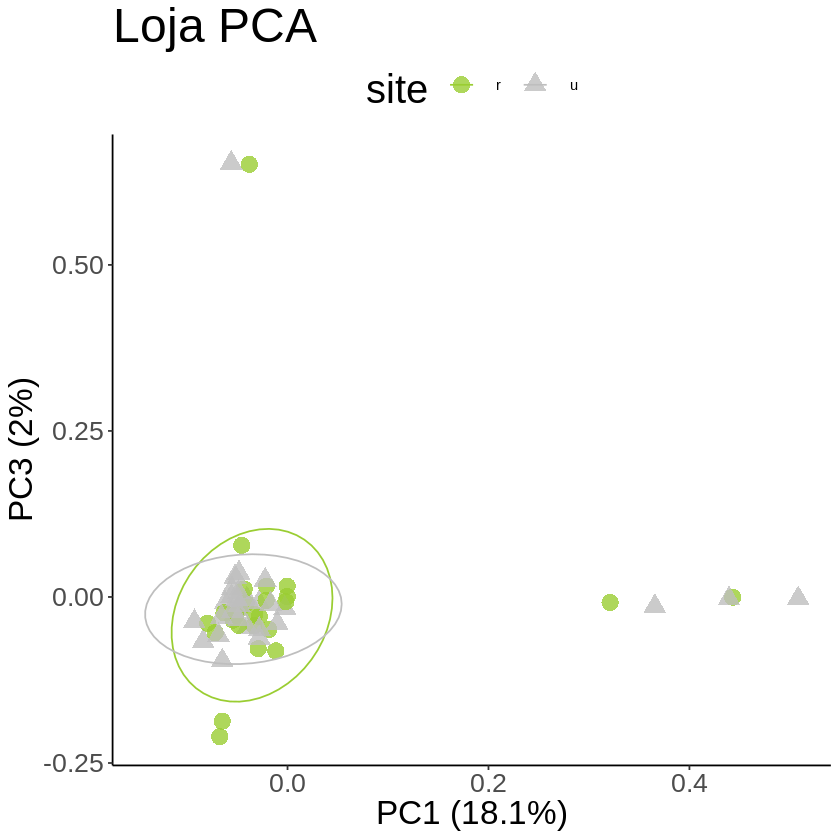

In [257]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Loja PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (18.1%)') + ylab('PC3 (2%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Loja_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Loja_PCA.png"
display_png(file=path_to_kplot)

In [258]:
### UMAP

Saving 6.67 x 6.67 in image



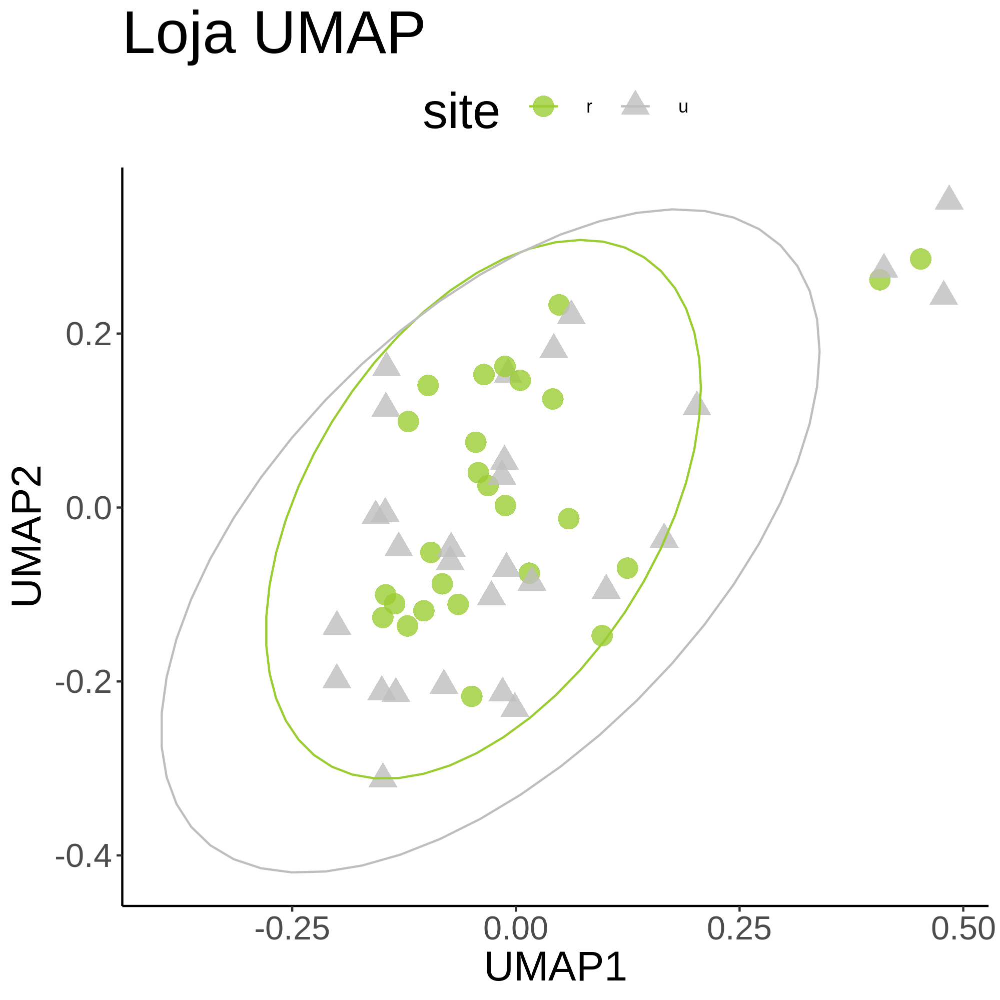

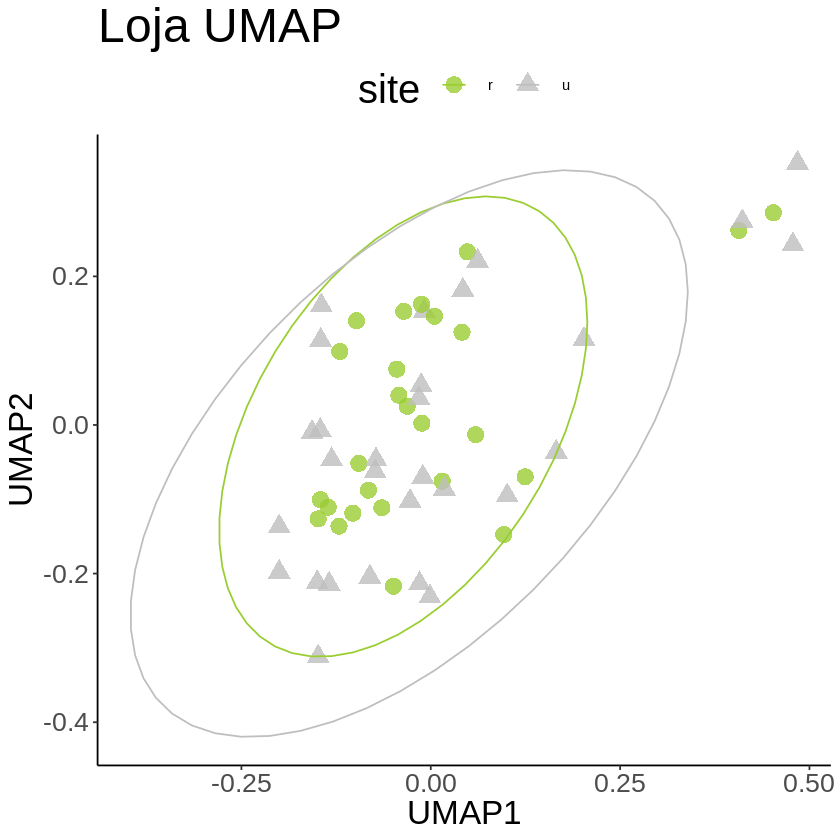

In [259]:
distMat <- as.matrix(dist(covMat))
Loja_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Loja_umap_layout <- Loja_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Loja_order_detail)
    
umap_plot <- Loja_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Loja UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Loja_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Loja_UMAP.png"
display_png(file=path_to_kplot)

In [260]:
## Medellin

In [261]:
### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.5777302,0.18030251,0.17900358,0.17716963,0.17419713,0.17327952,0.17259495,0.17115147
Proportion of Variance,0.2734817,0.02663677,0.02625436,0.02571915,0.02486337,0.02460212,0.02440811,0.02400155
Cumulative Proportion,0.2734817,0.30011845,0.32637281,0.35209196,0.37695533,0.40155745,0.42596556,0.44996711


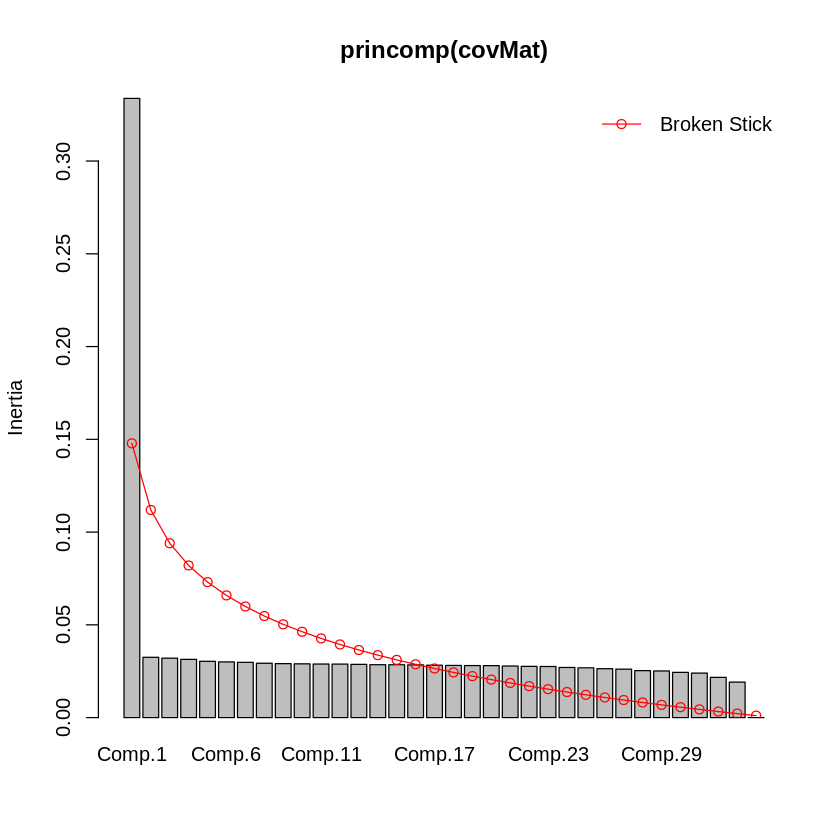

In [262]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Medellin/Medellin_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Medellin_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



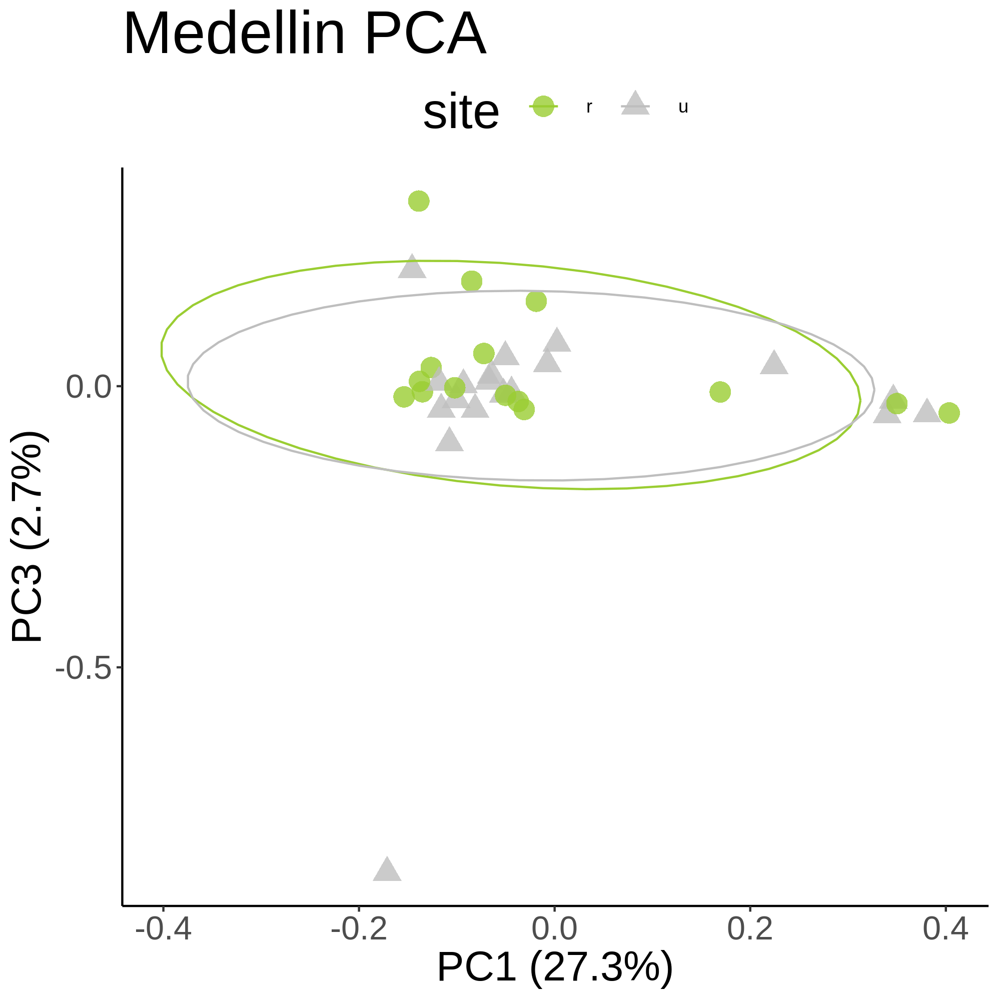

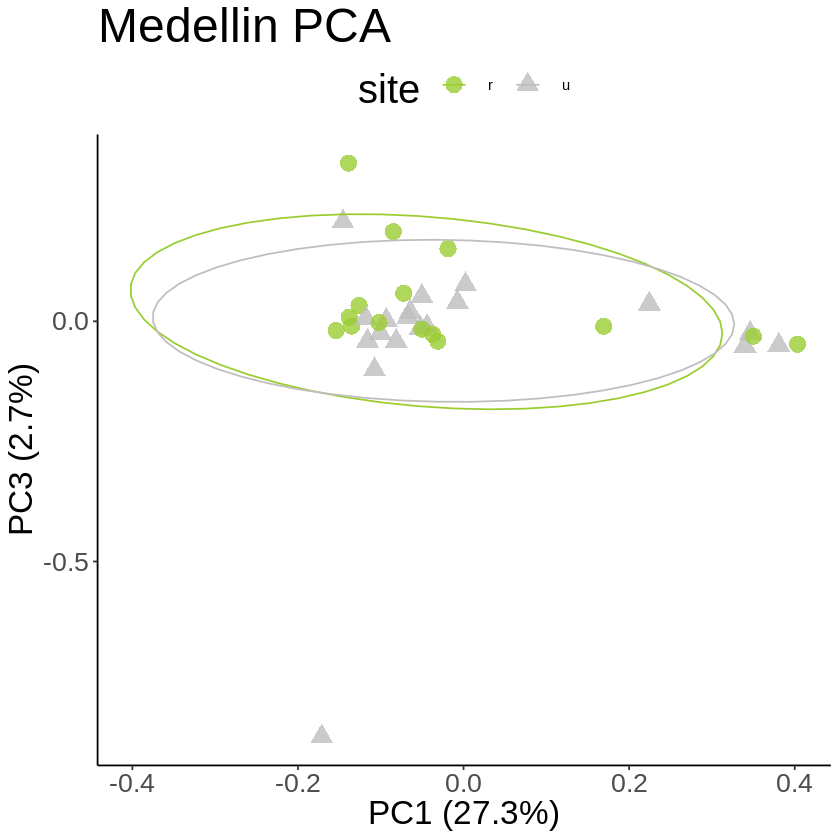

In [263]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Medellin PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (27.3%)') + ylab('PC3 (2.7%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Medellin_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Medellin_PCA.png"
display_png(file=path_to_kplot)

In [264]:
### UMAP

Warning message:
“failed creating initial embedding; using random embedding instead”
Saving 6.67 x 6.67 in image



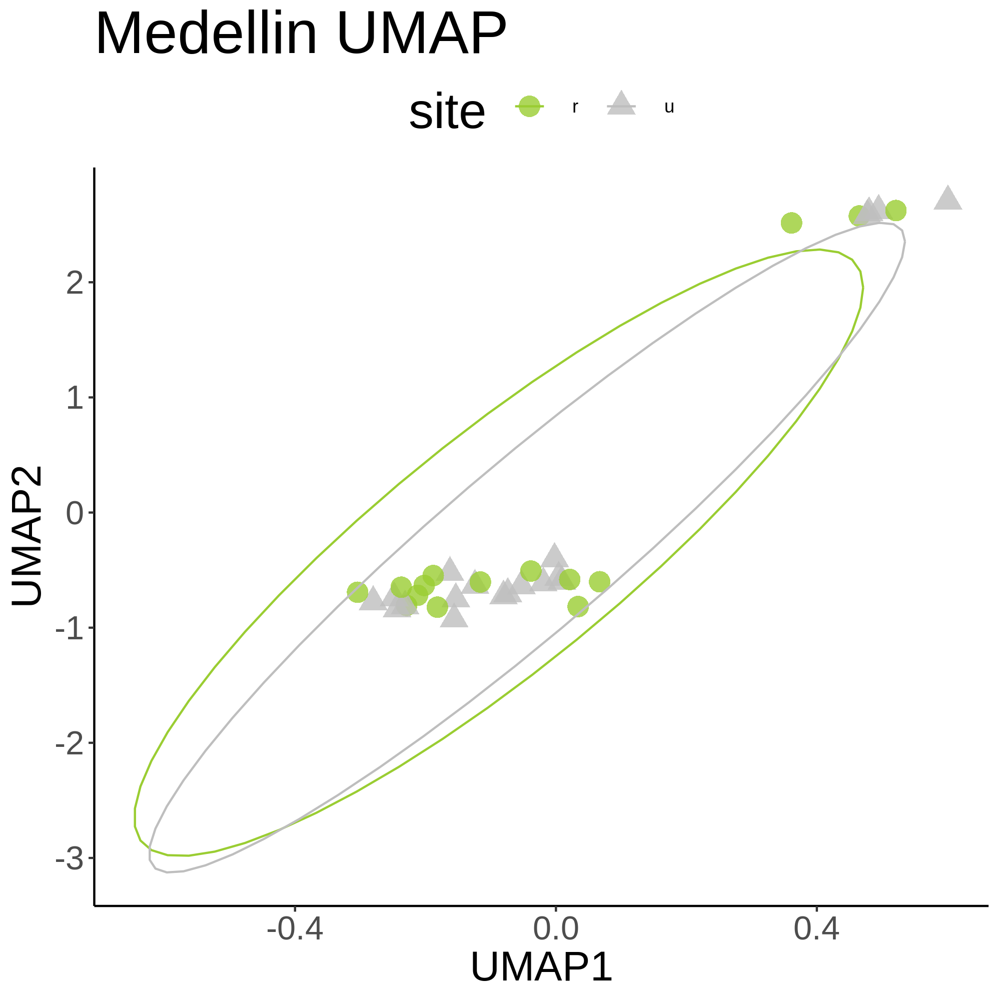

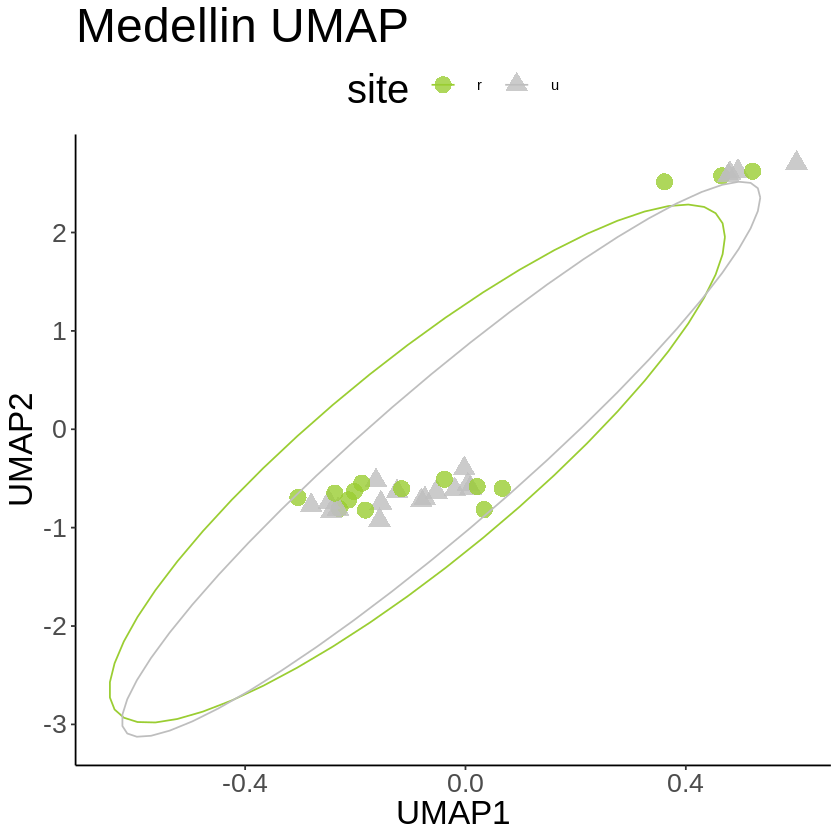

In [265]:
distMat <- as.matrix(dist(covMat))
Medellin_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Medellin_umap_layout <- Medellin_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Medellin_order_detail)
    
umap_plot <- Medellin_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Medellin UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Medellin_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Medellin_UMAP.png"
display_png(file=path_to_kplot)

In [266]:
## Melbourne

In [267]:
### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4612925,0.17403591,0.17230753,0.17051674,0.16921504,0.1681513,0.16728295,0.1665171
Proportion of Variance,0.1893987,0.02695889,0.02642608,0.02587964,0.02548603,0.0251666,0.02490736,0.0246798
Cumulative Proportion,0.1893987,0.21635757,0.24278365,0.26866330,0.29414933,0.3193159,0.34422328,0.3689031


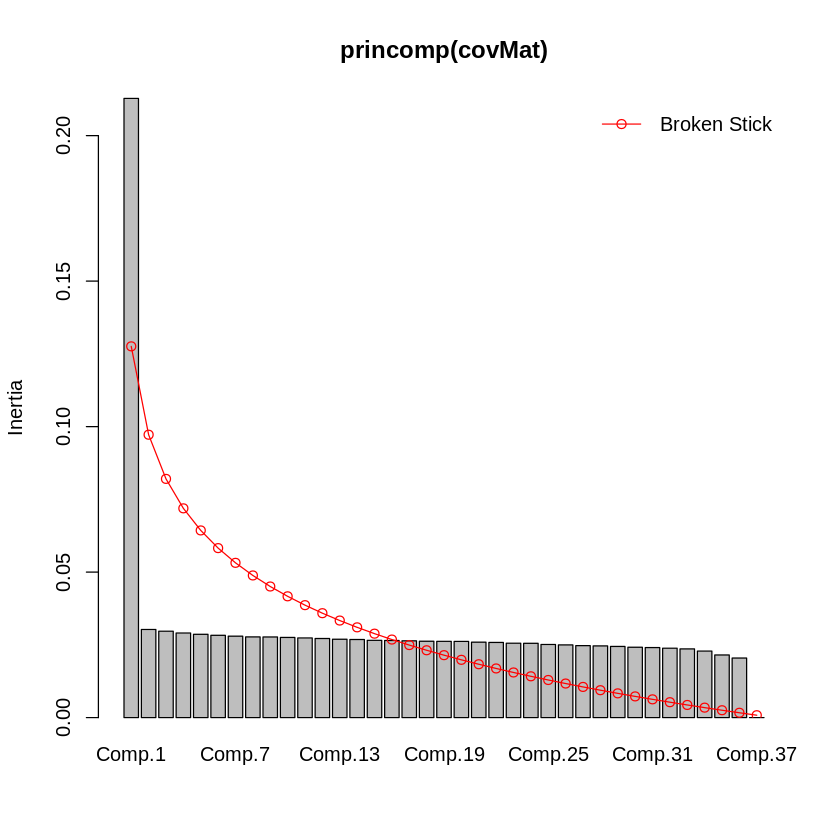

In [268]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Melbourne/Melbourne_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Melbourne_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



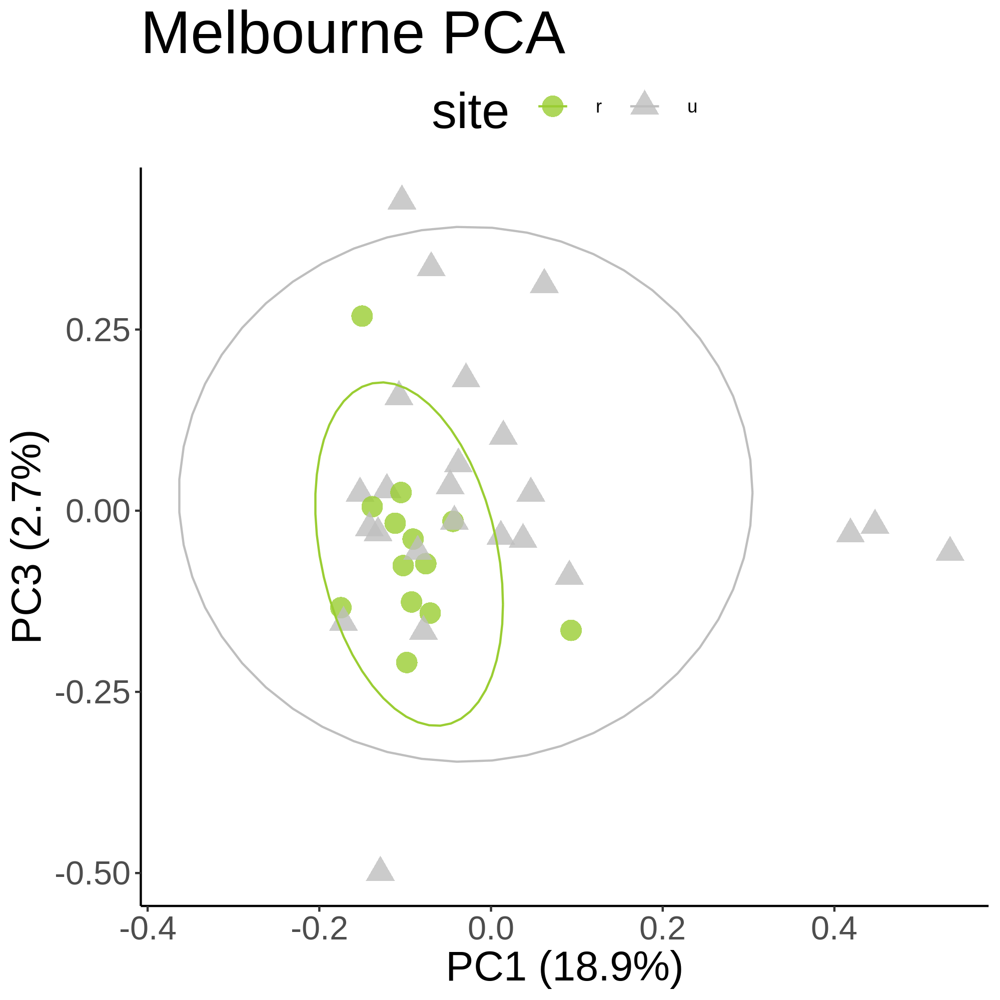

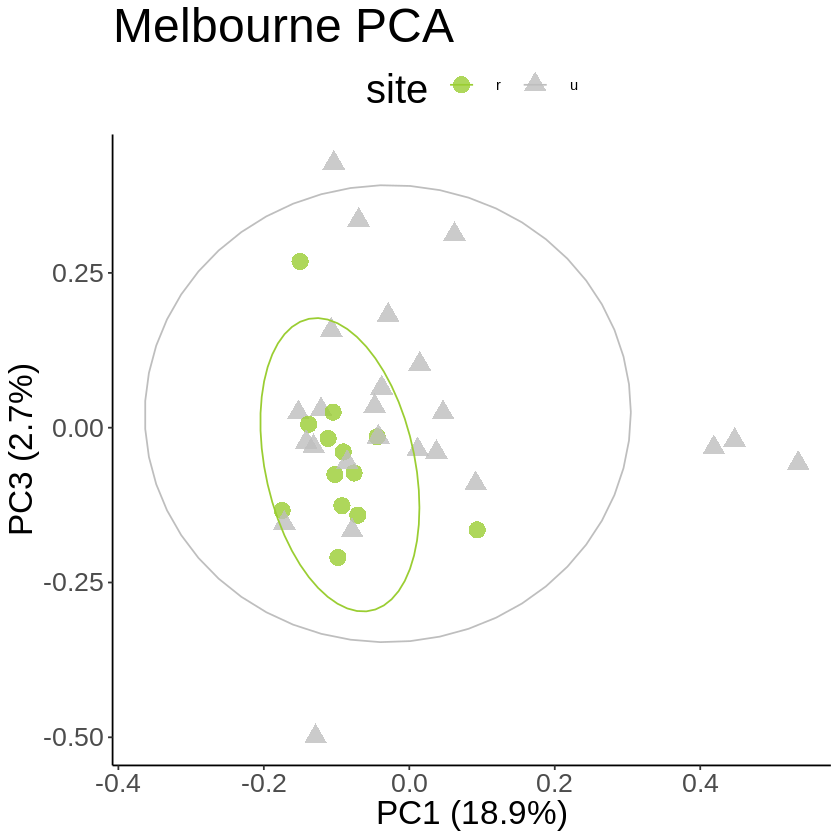

In [269]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +       
        ggtitle('Melbourne PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (18.9%)') + ylab('PC3 (2.7%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Melbourne_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Melbourne_PCA.png"
display_png(file=path_to_kplot)

In [270]:
### UMAP

Warning message:
“failed creating initial embedding; using random embedding instead”
Saving 6.67 x 6.67 in image



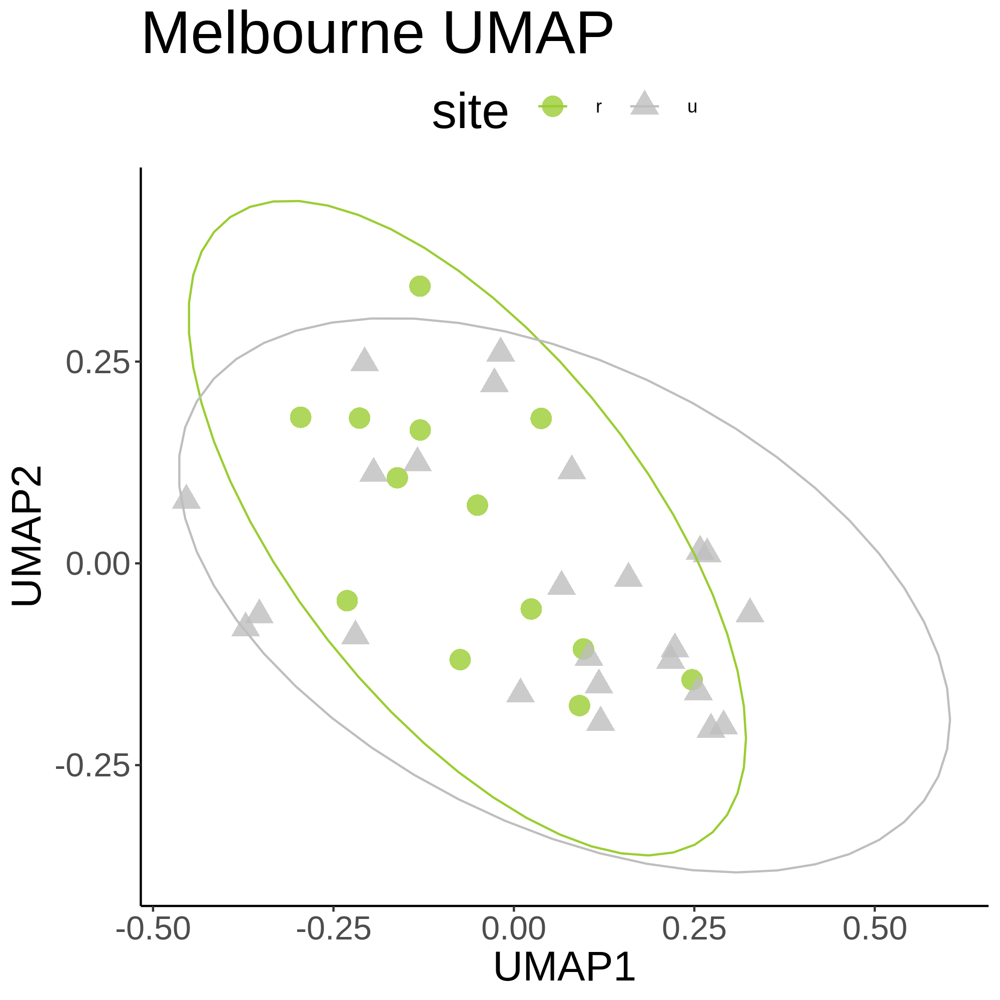

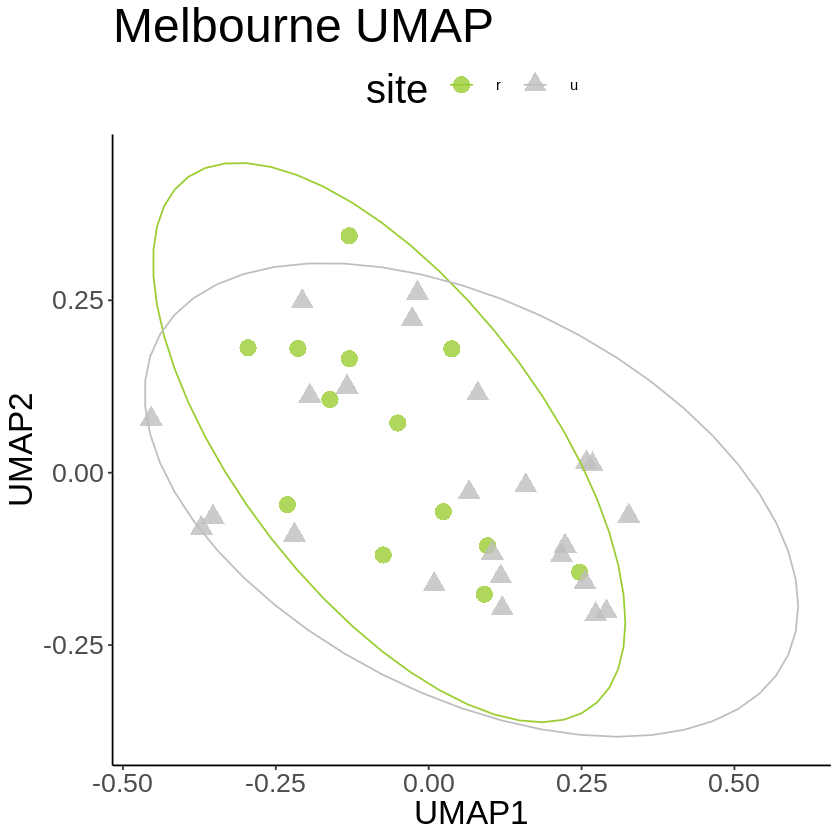

In [271]:
distMat <- as.matrix(dist(covMat))
Melbourne_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Melbourne_umap_layout <- Melbourne_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Melbourne_order_detail)
    
umap_plot <- Melbourne_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Melbourne UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Melbourne_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Melbourne_UMAP.png"
display_png(file=path_to_kplot)

In [272]:
## Memphis

In [273]:
### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.3915324,0.14055726,0.13805022,0.13459467,0.13236010,0.13076505,0.13020783,0.12901877
Proportion of Variance,0.1454258,0.01874186,0.01807925,0.01718549,0.01661959,0.01622144,0.01608349,0.01579108
Cumulative Proportion,0.1454258,0.16416768,0.18224693,0.19943242,0.21605201,0.23227346,0.24835695,0.26414803


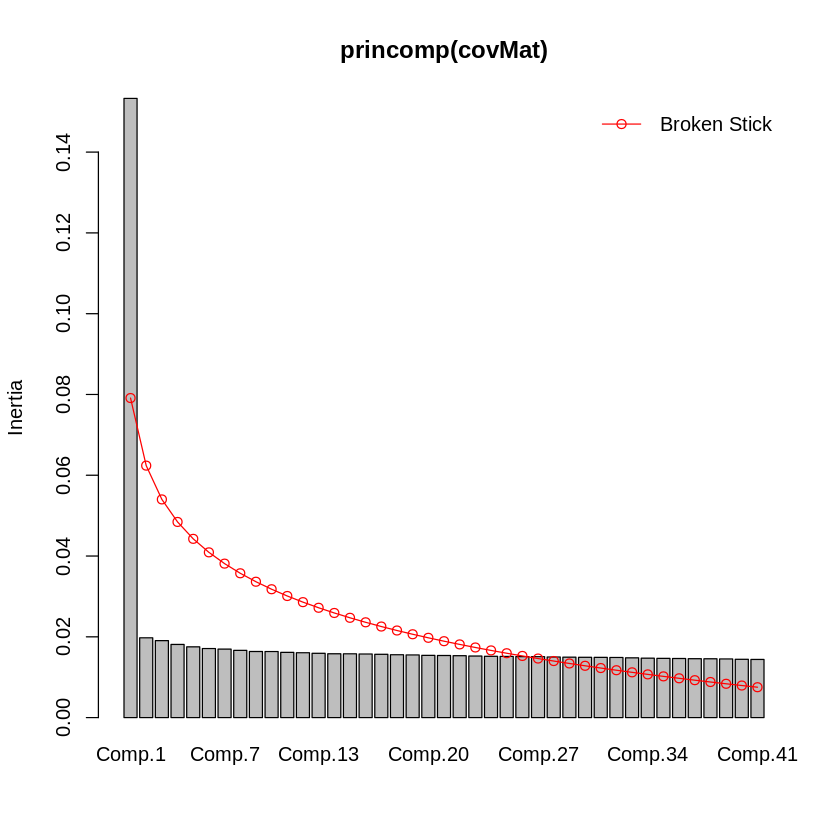

In [274]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Memphis/Memphis_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Memphis_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



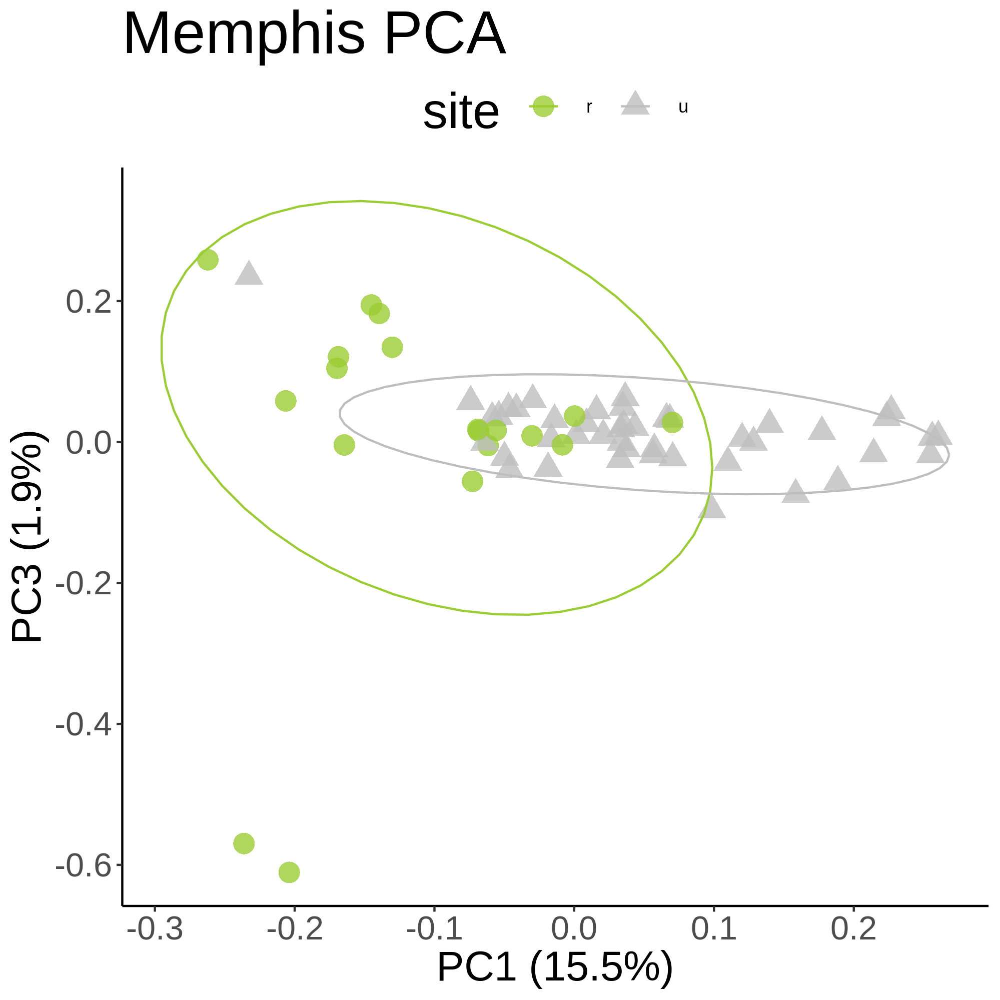

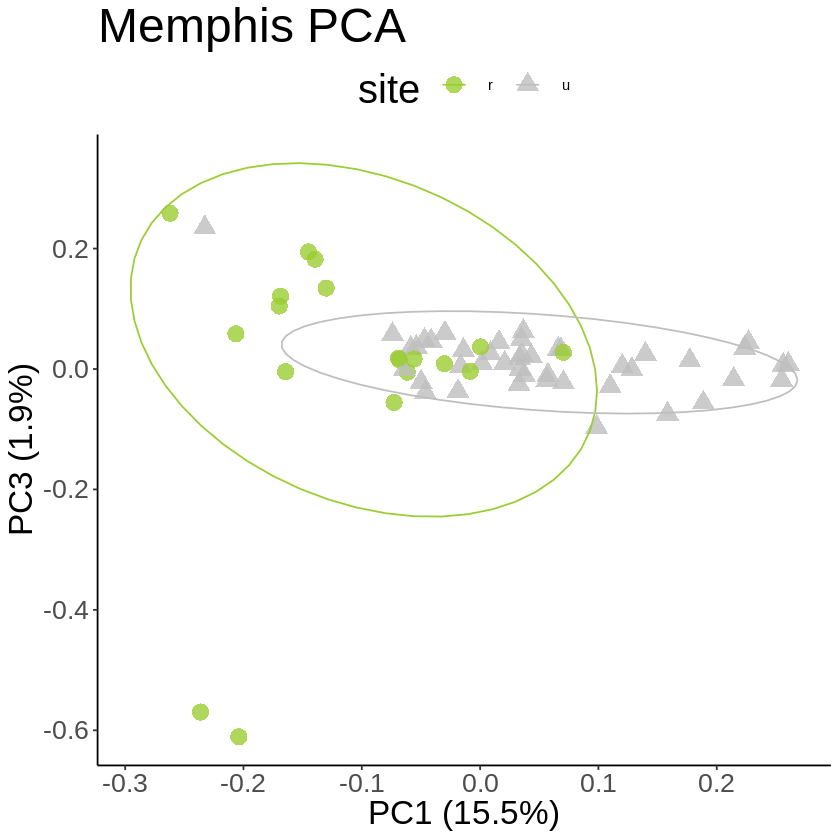

In [275]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        scale_color_manual(values=c("yellowgreen", "grey")) +
        ggtitle('Memphis PCA')+
        xlab('PC1 (15.5%)') + ylab('PC3 (1.9%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Memphis_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Memphis_PCA.png"
display_png(file=path_to_kplot)

### UMAP

Saving 6.67 x 6.67 in image



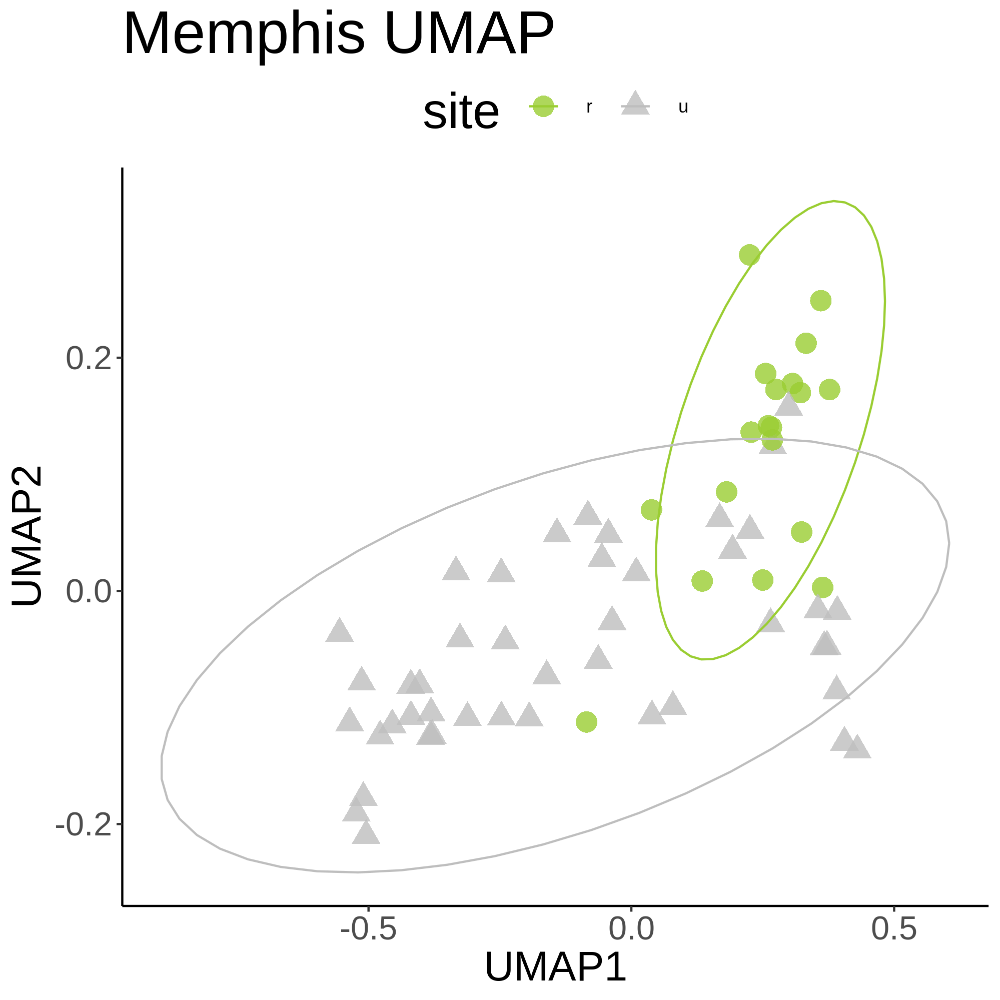

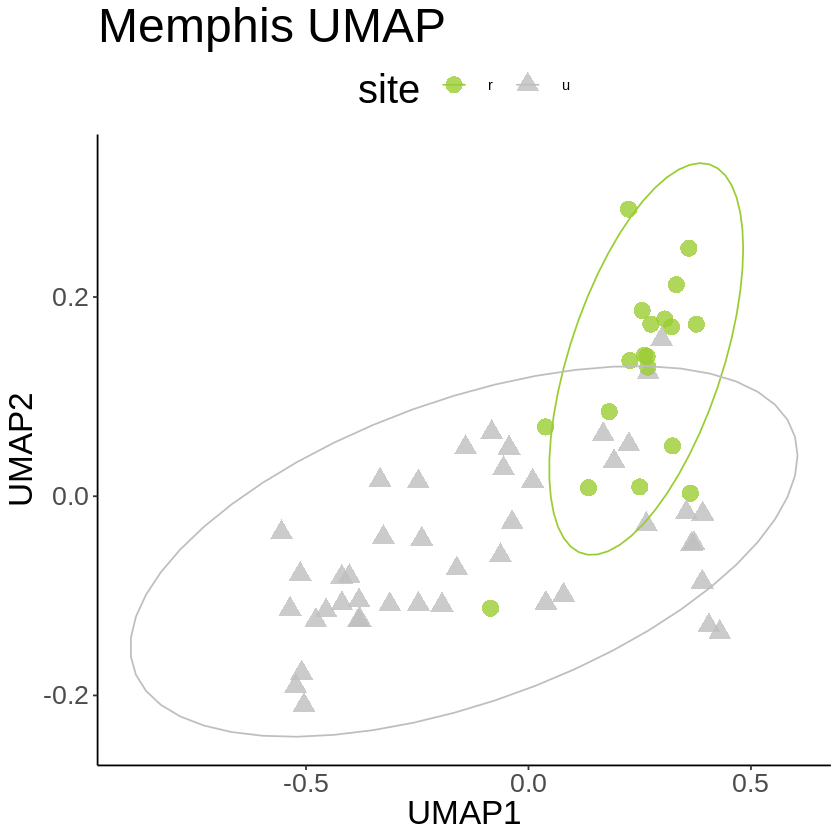

In [276]:
distMat <- as.matrix(dist(covMat))
Memphis_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Memphis_umap_layout <- Memphis_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Memphis_order_detail)
    
umap_plot <- Memphis_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Memphis UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Memphis_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Memphis_UMAP.png"
display_png(file=path_to_kplot)

## Mexico_city

### PCA 

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4957642,0.17567430,0.17246523,0.16043781,0.15506949,0.14335532,0.14129972,0.13608039
Proportion of Variance,0.2192608,0.02753133,0.02653468,0.02296277,0.02145179,0.01833321,0.01781121,0.01651969
Cumulative Proportion,0.2192608,0.24679218,0.27332686,0.29628962,0.31774141,0.33607462,0.35388583,0.37040552


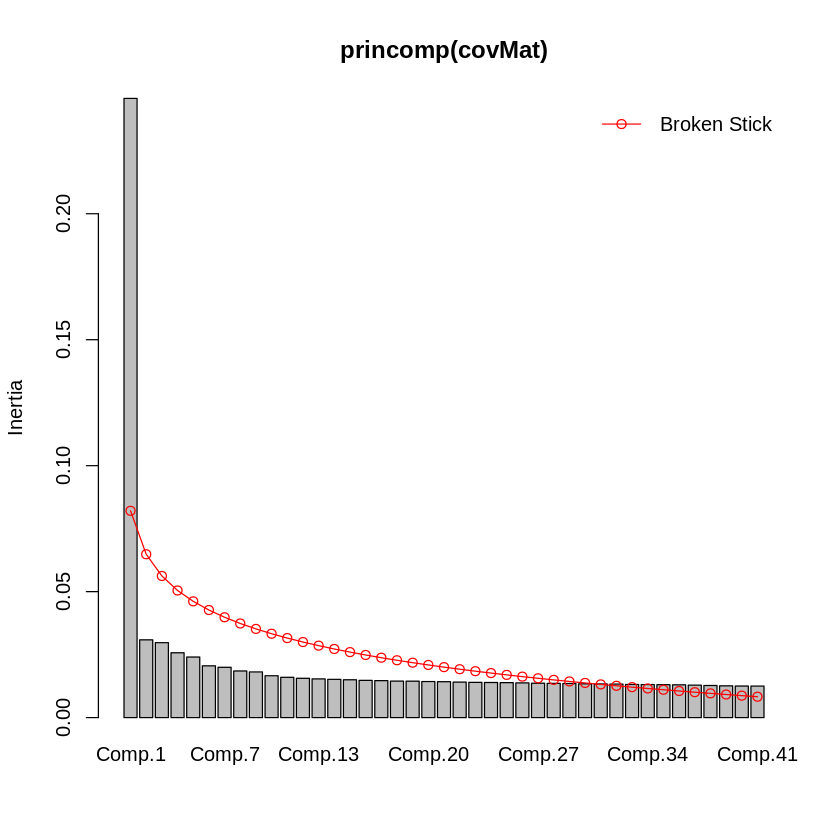

In [277]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure/pcangsd/by_city/pcangsd_withoutRelated/Mexico_City/Mexico_City_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Mexico_City_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



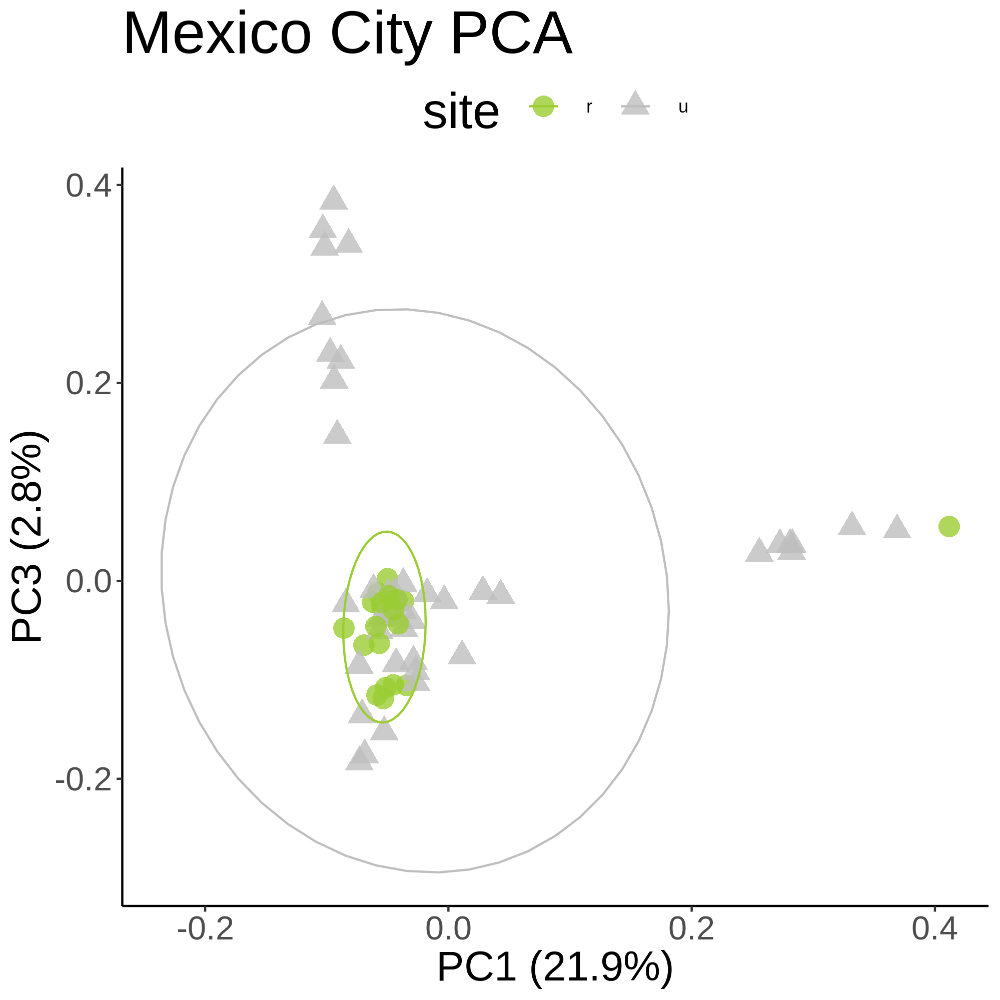

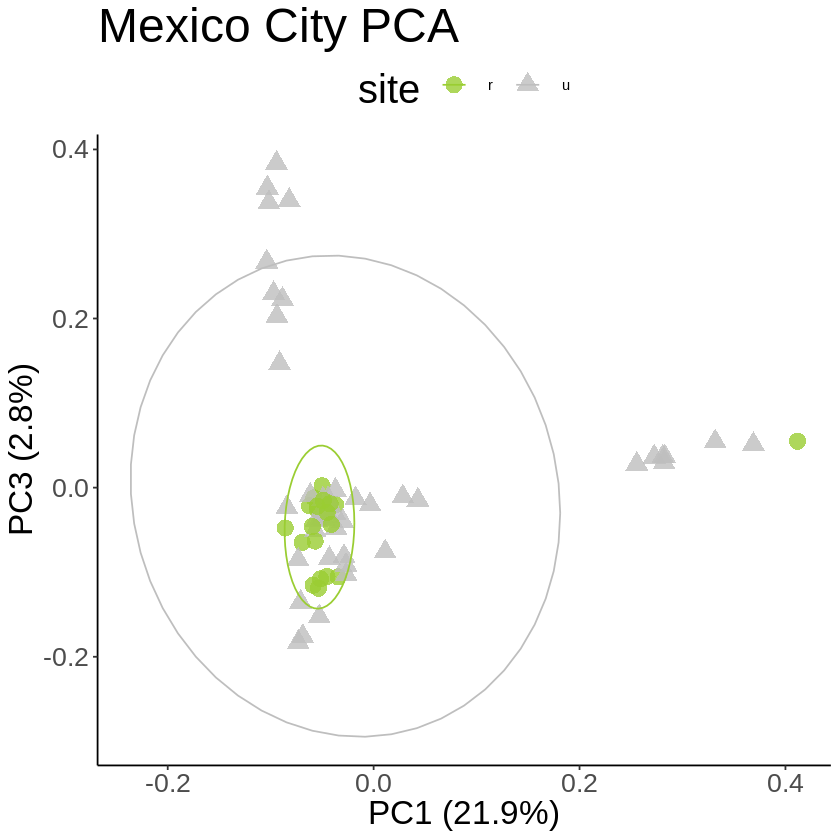

In [278]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Mexico City PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (21.9%)') + ylab('PC3 (2.8%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Mexico_City_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Mexico_City_PCA.png"
display_png(file=path_to_kplot)

In [279]:
### UMAP

Saving 6.67 x 6.67 in image



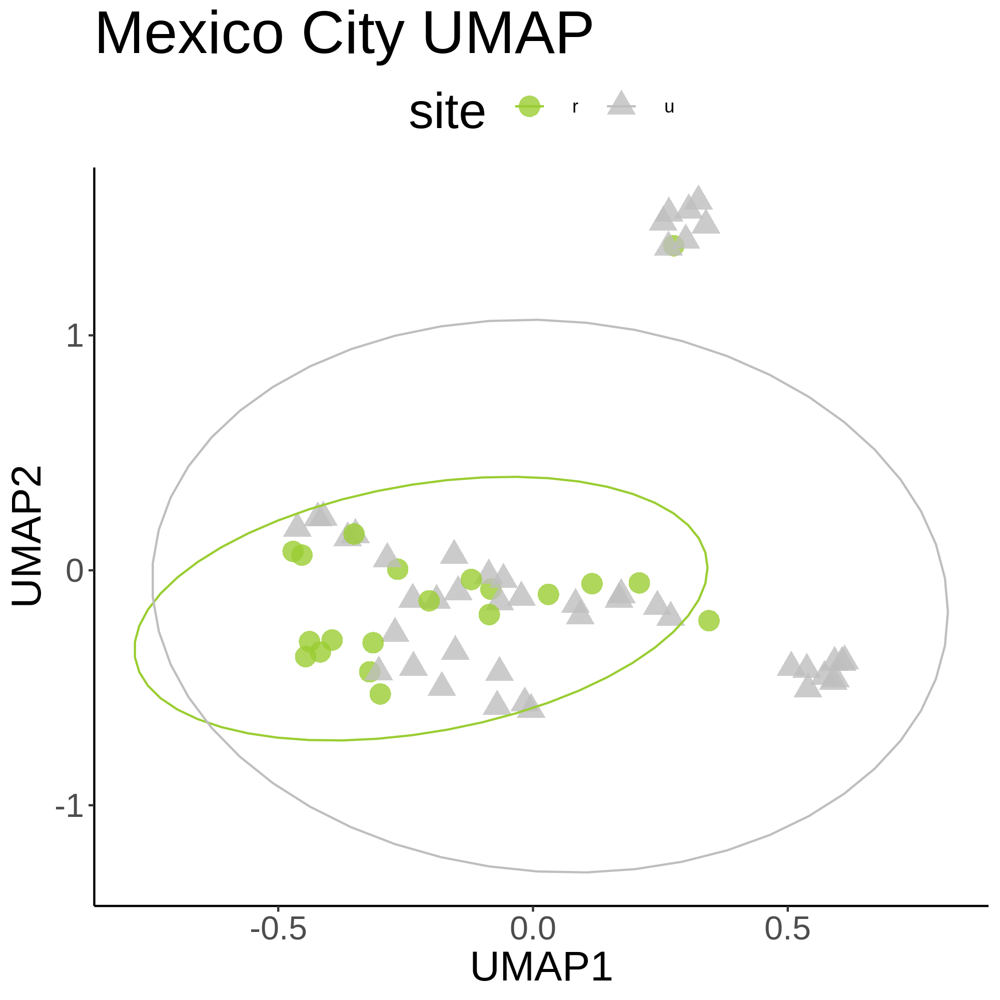

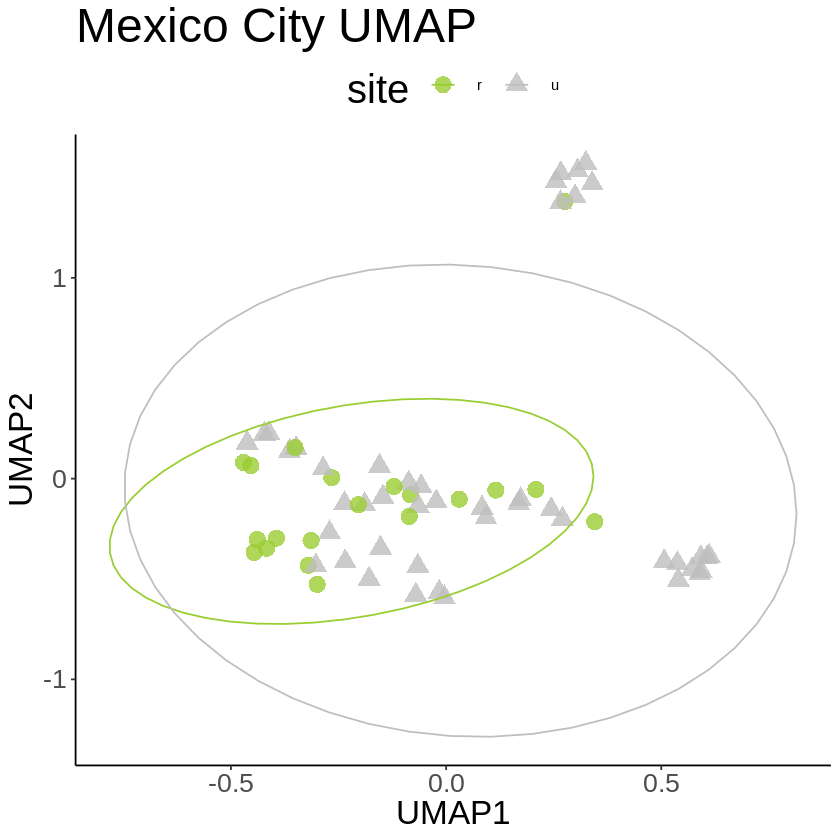

In [280]:
distMat <- as.matrix(dist(covMat))
Mexico_City_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Mexico_City_umap_layout <- Mexico_City_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Mexico_City_order_detail)
    
umap_plot <- Mexico_City_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Mexico City UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot

ggsave(
  "Mexico_City_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Mexico_City_UMAP.png"
display_png(file=path_to_kplot)

In [281]:
## Munich

In [282]:
### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4088532,0.12749384,0.12298026,0.12098546,0.11904360,0.11653117,0.11545859,0.11516835
Proportion of Variance,0.1464426,0.01424004,0.01324963,0.01282328,0.01241495,0.01189644,0.01167845,0.01161981
Cumulative Proportion,0.1464426,0.16068268,0.17393231,0.18675559,0.19917054,0.21106698,0.22274543,0.23436525


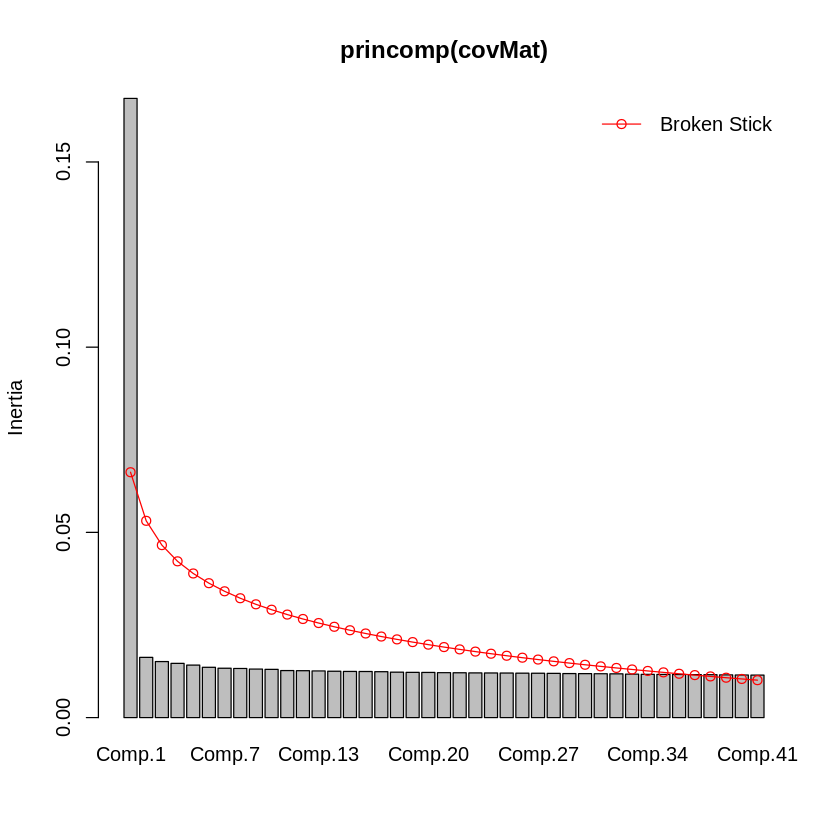

In [283]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Munich/Munich_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Munich_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



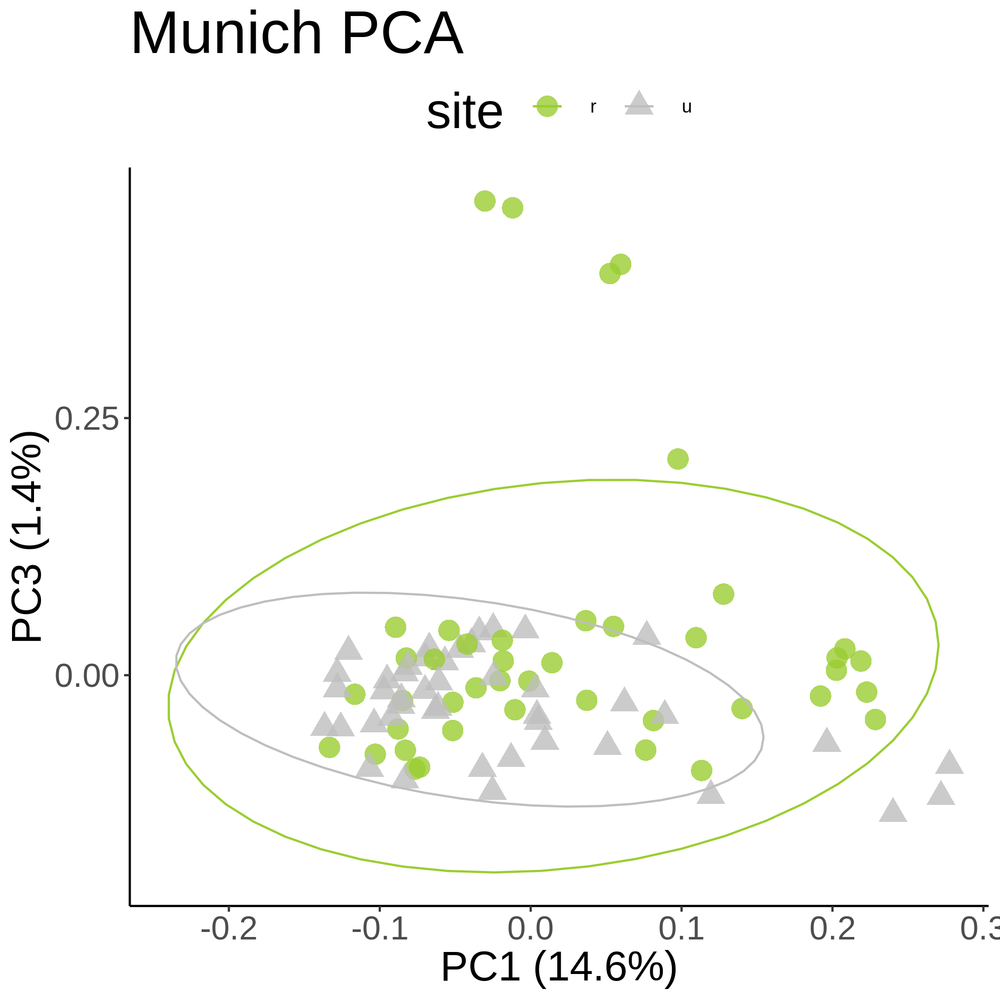

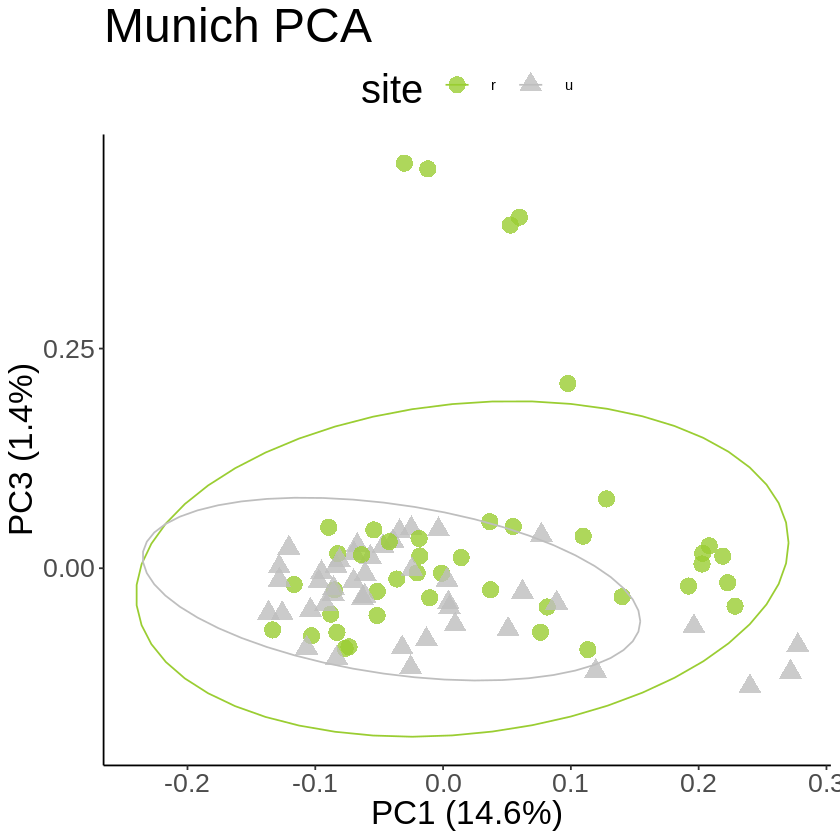

In [284]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Munich PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (14.6%)') + ylab('PC3 (1.4%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Munich_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Munich_PCA.png"
display_png(file=path_to_kplot)

In [285]:
### UMAP

Saving 6.67 x 6.67 in image



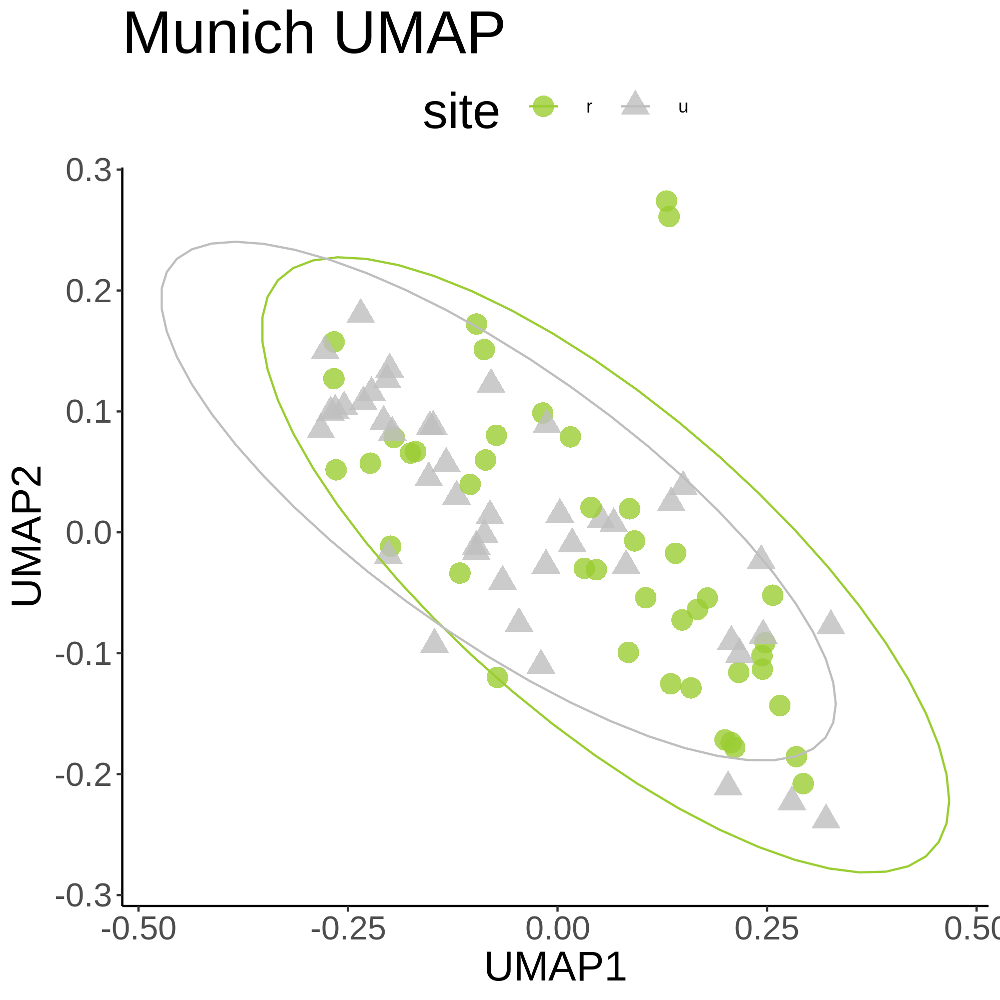

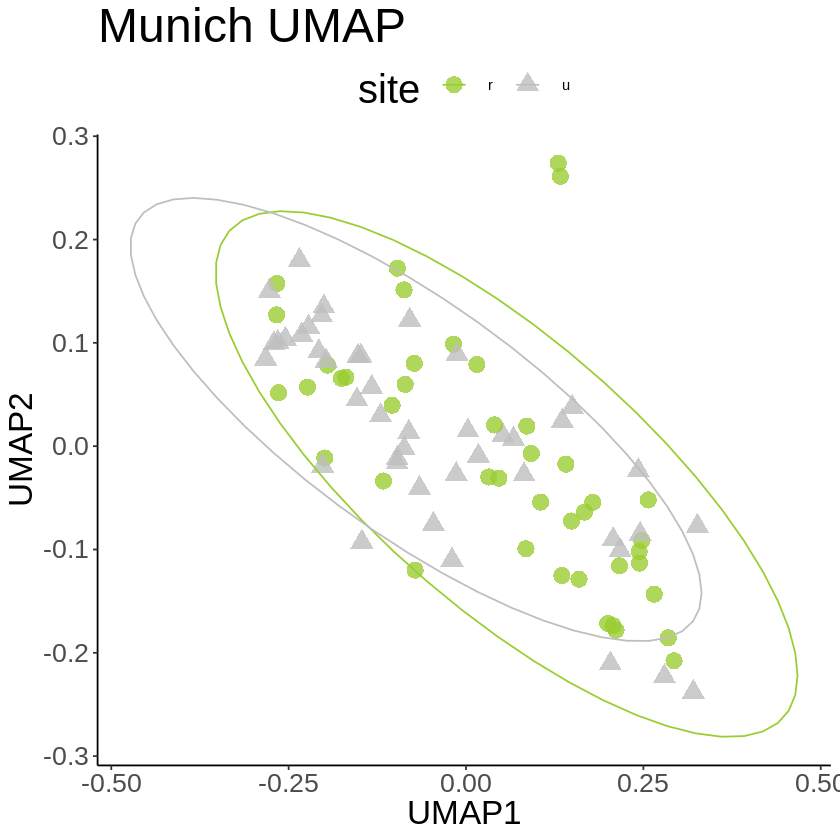

In [286]:
distMat <- as.matrix(dist(covMat))
Munich_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Munich_umap_layout <- Munich_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Munich_order_detail)
    
umap_plot <- Munich_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Munich UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Munich_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Munich_UMAP.png"
display_png(file=path_to_kplot)

In [287]:
## Paris

In [288]:
### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.4132949,0.19629764,0.18850880,0.18638206,0.18446326,0.18278970,0.18225586,0.18135499
Proportion of Variance,0.1666360,0.03759056,0.03466665,0.03388885,0.03319467,0.03259508,0.03240497,0.03208541
Cumulative Proportion,0.1666360,0.20422652,0.23889317,0.27278202,0.30597670,0.33857178,0.37097675,0.40306216


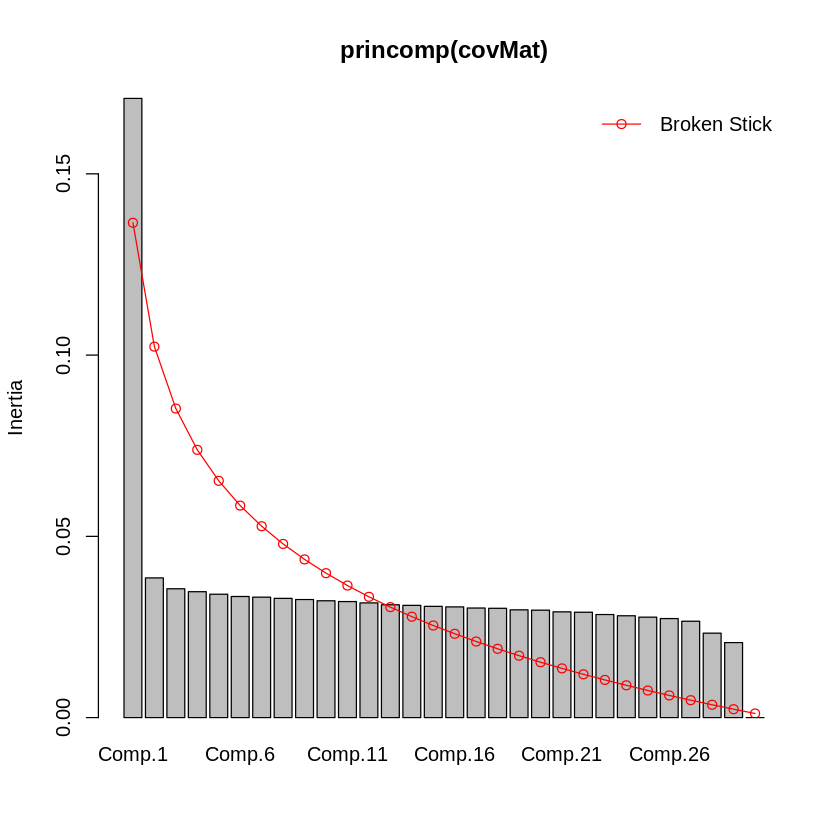

In [289]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Paris/Paris_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Paris_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



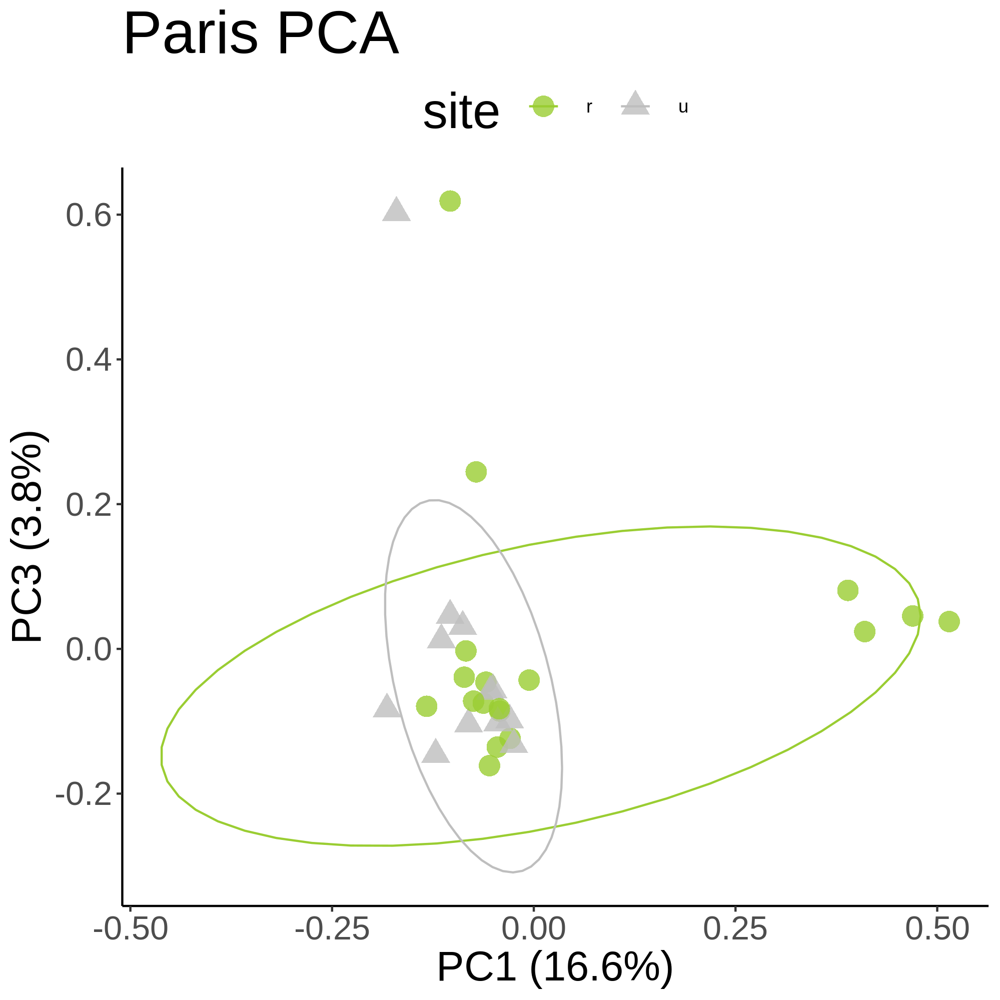

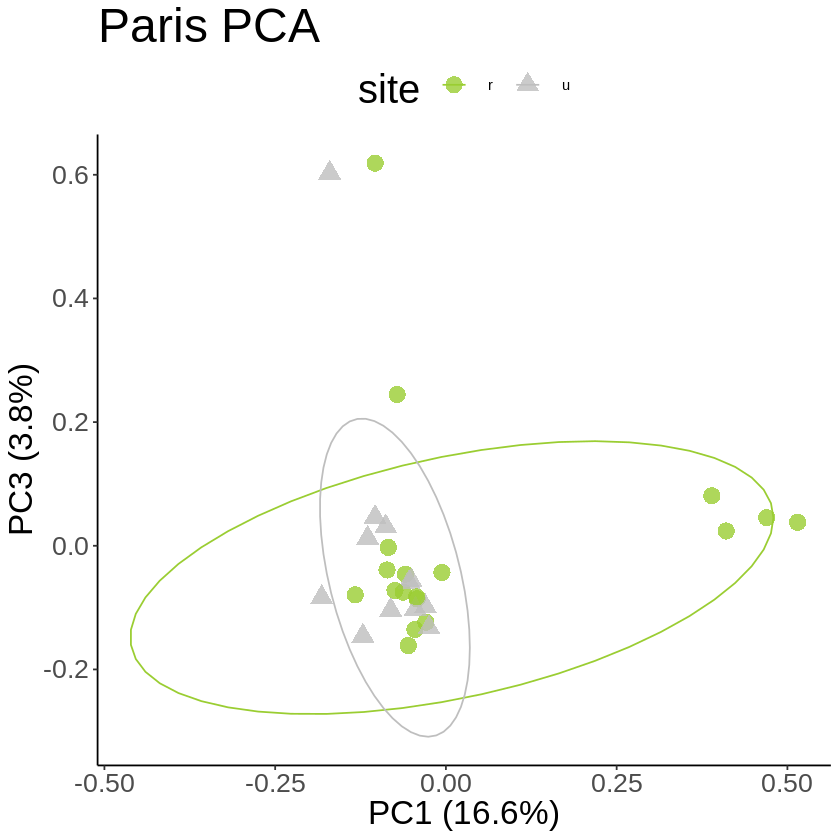

In [290]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Paris PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (16.6%)') + ylab('PC3 (3.8%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Paris_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Paris_PCA.png"
display_png(file=path_to_kplot)

In [291]:
### UMAP

Warning message:
“failed creating initial embedding; using random embedding instead”
Saving 6.67 x 6.67 in image



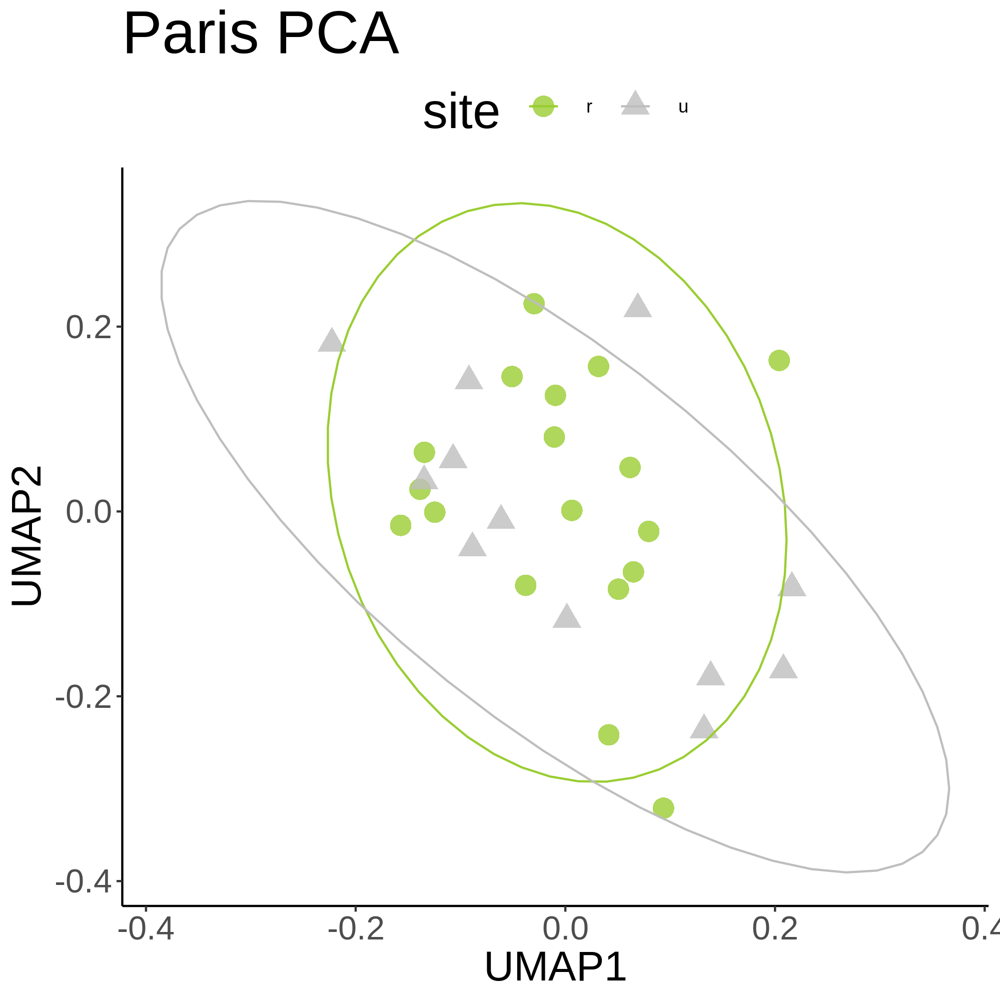

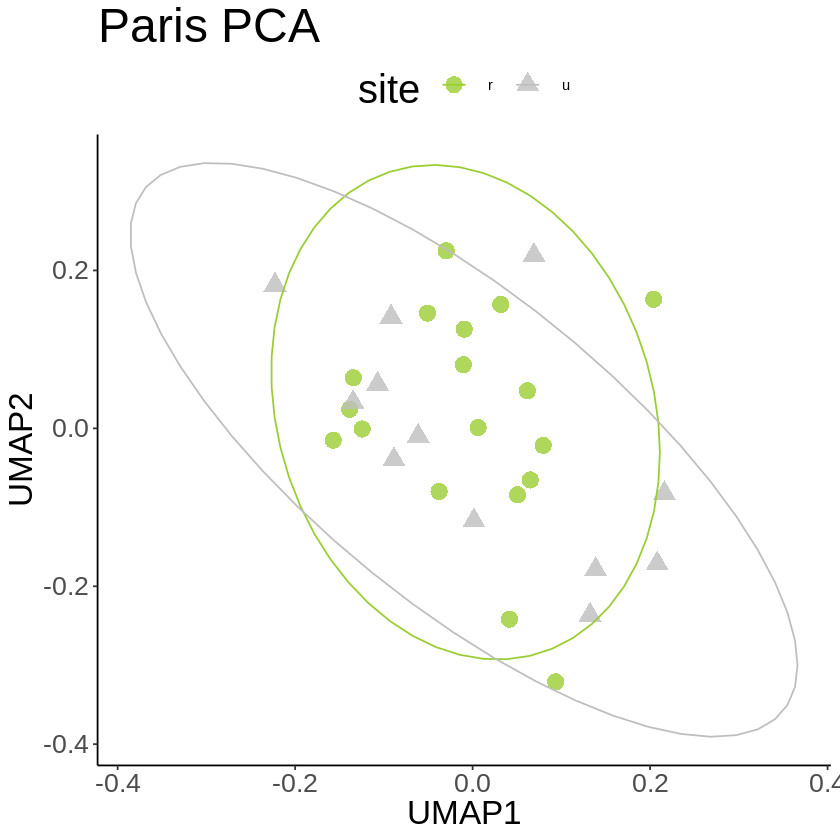

In [292]:
distMat <- as.matrix(dist(covMat))
Paris_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Paris_umap_layout <- Paris_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Paris_order_detail)
    
umap_plot <- Paris_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Paris PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Paris_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Paris_UMAP.png"
display_png(file=path_to_kplot)

In [293]:
## Quito

In [294]:
### PCA

var,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Standard deviation,0.5391312,0.1741914,0.17225393,0.16949776,0.16813505,0.16643222,0.16627995,0.16537764
Proportion of Variance,0.2458624,0.0256659,0.02509813,0.02430139,0.02391221,0.02343031,0.02338745,0.02313432
Cumulative Proportion,0.2458624,0.2715283,0.29662641,0.32092779,0.34484000,0.36827031,0.39165776,0.41479209


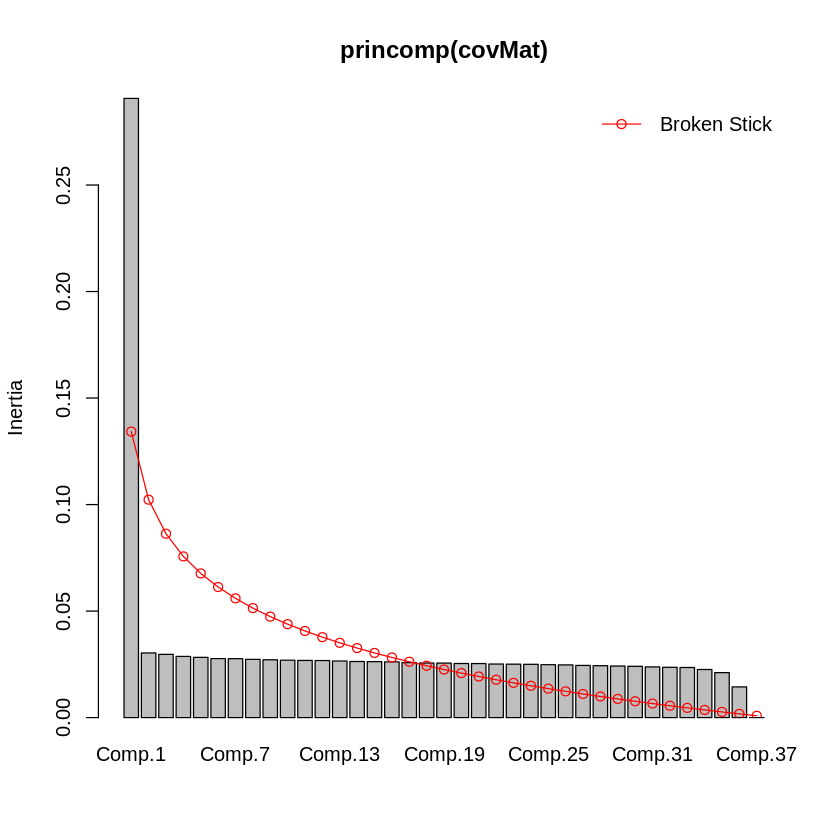

In [295]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Quito/Quito_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Quito_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

Saving 6.67 x 6.67 in image



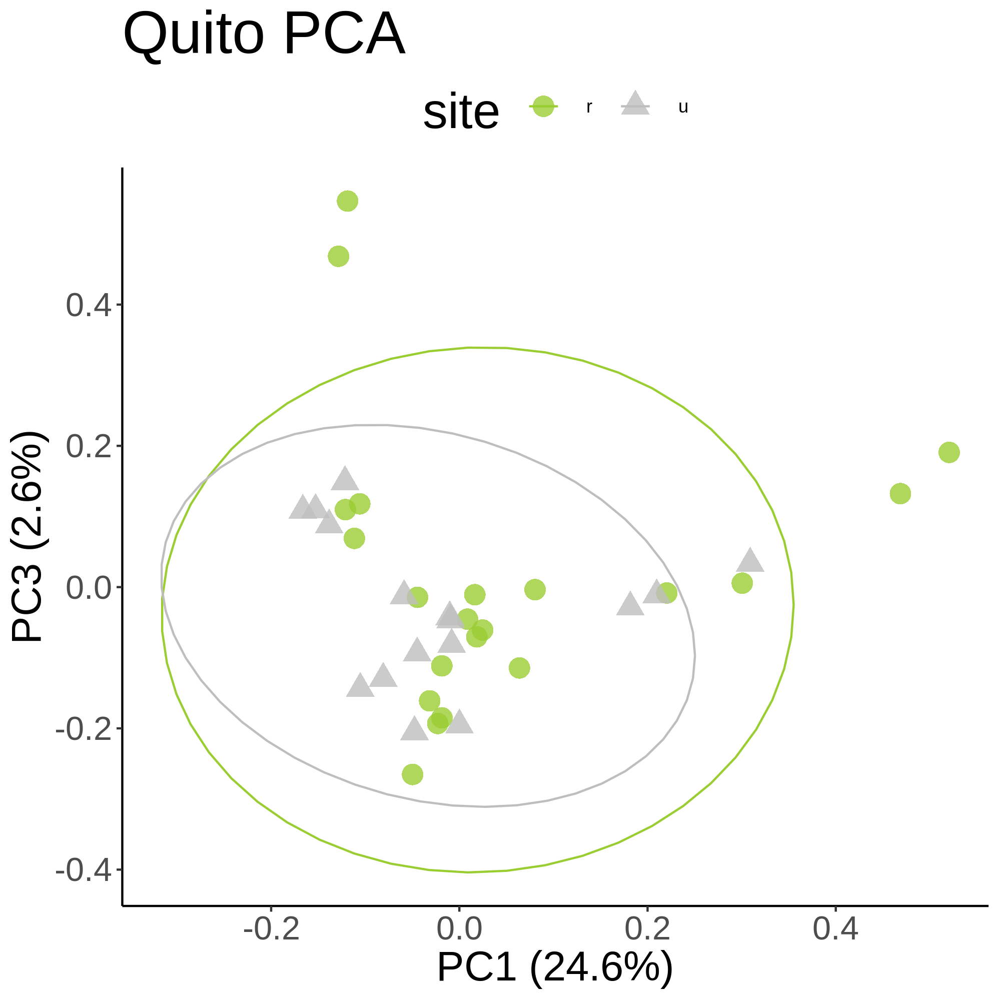

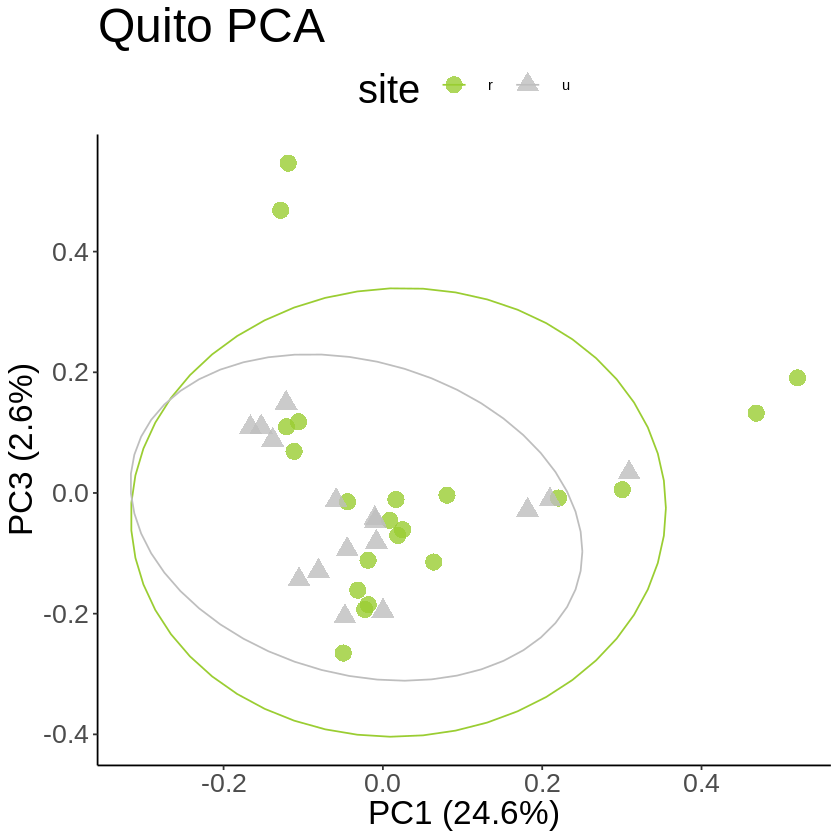

In [296]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Quito PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (24.6%)') + ylab('PC3 (2.6%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Quito_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Quito_PCA.png"
display_png(file=path_to_kplot)

In [297]:
### UMAP

In [ ]:
distMat <- as.matrix(dist(covMat))
Quito_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Quito_umap_layout <- Quito_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Quito_order_detail)
    
umap_plot <- Quito_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Quito UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Quito_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Quito_UMAP.png"
display_png(file=path_to_kplot)

Warning message:
“failed creating initial embedding; using random embedding instead”
Saving 6.67 x 6.67 in image



In [ ]:
## Tehran

In [ ]:
### PCA

In [ ]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Tehran/Tehran_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Tehran_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

In [ ]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Tehran PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (30.7.3%)') + ylab('PC3 (1.7%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Tehran_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Tehran_PCA.png"
display_png(file=path_to_kplot)

In [ ]:
### UMAP

In [ ]:
distMat <- as.matrix(dist(covMat))
Tehran_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Tehran_umap_layout <- Tehran_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Tehran_order_detail)
    
umap_plot <- Tehran_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Tehran UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Tehran_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Tehran_UMAP.png"
display_png(file=path_to_kplot)

In [ ]:
## Thessaloniki

In [ ]:
### PCA

In [ ]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Thessaloniki/Thessaloniki_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Thessaloniki_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

In [ ]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Thessaloniki PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (17.7%)') + ylab('PC3 (2.3%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Thessaloniki_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Thessaloniki_PCA.png"
display_png(file=path_to_kplot)

In [ ]:
### UMAP

In [ ]:
distMat <- as.matrix(dist(covMat))
Thessaloniki_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Thessaloniki_umap_layout <- Thessaloniki_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Thessaloniki_order_detail)
    
umap_plot <- Thessaloniki_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Thessaloniki PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Thessaloniki_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Thessaloniki_UMAP.png"
display_png(file=path_to_kplot)

## Toronto

### PCA

In [ ]:
# Load covariance matrix
covMat<-as.matrix(read.table("/scratch/projects/trifolium/glue/demography/glue_demography/results/population_structure//pcangsd/by_city/pcangsd_withoutRelated/Toronto/Toronto_4fold_maf0.05_pcangsd.cov", sep=" "))

# Perform eigen decomposition of covariance matrix
# Extract eigenvectors and bind with sample sheet for plotting and coloring by habitat
eigenvectors <- eigen(covMat)
eigen_df <- eigenvectors$vectors %>%
        as.data.frame() %>%
        dplyr::select(V1, V2, V3, V4) %>%
        rename('PC1' = 'V1',
               'PC2' = 'V2',
               'PC3' = 'V3',
               'PC4' = 'V4') %>%
    bind_cols(., Toronto_order_detail)

# Percent Variance explained by first 4 PCs
pca_importance(summary(princomp(covMat))) %>% 
    as.data.frame() %>% 
    rownames_to_column('var') %>% 
    dplyr::select(var, Comp.1:Comp.8)

screeplot(princomp(covMat), bstick = TRUE, npcs=41)

In [ ]:
pca_plot1 <- eigen_df %>%
    ggplot(., aes(x = PC1, y = PC2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Toronto PCA')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('PC1 (4.8%)') + ylab('PC3 (2%)') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
pca_plot1
ggsave(
  "Toronto_PCA.png",
  plot = pca_plot1,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/pca/Toronto_PCA.png"
display_png(file=path_to_kplot)

### UMAP

In [ ]:
distMat <- as.matrix(dist(covMat))
Toronto_umap <- umap(distMat, random_state = 42, input="dist", n_neighbors = 15, min_dist = 0.1, n_components = 40)
Toronto_umap_layout <- Toronto_umap$layout %>% 
    as_tibble() %>% 
    bind_cols(., Toronto_order_detail)
    
umap_plot <- Toronto_umap_layout %>%
    ggplot(., aes(x = V1, y = V2, color = site, shape = site)) +
        geom_point(size = 4.5, alpha = 0.8) +
        theme_classic() +
        stat_ellipse() +
        ggtitle('Toronto UMAP')+
        scale_color_manual(values=c("yellowgreen", "grey")) +
        xlab('UMAP1') + ylab('UMAP2') +
        theme(axis.text = element_text(size = 16),
              axis.title = element_text(size = 20),
              title = element_text(size=24),
              legend.position = 'top')
umap_plot
ggsave(
  "Toronto_UMAP.png",
  plot = umap_plot,
  device = png,
  path = "/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap",
  dpi = 300
)

path_to_kplot<-"/scratch/projects/trifolium/glue/demography/glue_demography/genomic-analyses/analyses/figures/umap/Toronto_UMAP.png"
display_png(file=path_to_kplot)